# NOTEBOOK Partie 1 (sur 2) - WORLD HAPPINESS REPORT 2021.
Projet Data Analyse - Cohorte Dec 2021.

# 1. INSPECTION ET STANDARDISATION DES DONNEES COLLECTEES

# 1.1. Préparation du dataset DF2_Données 2005-2020

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline
import seaborn as sns
pd.set_option('display.max_columns', None)
import warnings
warnings.filterwarnings('ignore')

whr = pd.read_csv('world-happiness-report.csv')
whr = whr.rename(columns = {'Country name':'Country' })
whr = whr.rename(columns = {'year':'Year' })
whr = whr.replace(to_replace = ['Hong Kong S.A.R. of China', 'Taiwan Province of China'], value= ['Hong Kong', 'Taiwan']) 
whr.head()

,Country,Year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect
0,Afghanistan,2008,3.724,7.370,0.451,50.80,0.718,0.168,0.882,0.518,0.258
1,Afghanistan,2009,4.402,7.540,0.552,51.20,0.679,0.190,0.850,0.584,0.237
2,Afghanistan,2010,4.758,7.647,0.539,51.60,0.600,0.121,0.707,0.618,0.275
3,Afghanistan,2011,3.832,7.620,0.521,51.92,0.496,0.162,0.731,0.611,0.267
4,Afghanistan,2012,3.783,7.705,0.521,52.24,0.531,0.236,0.776,0.710,0.268


In [2]:
whr_hong = whr.loc[whr["Country"] == 'Hong Kong']
whr_hong

,Country,Year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect
699,Hong Kong,2006,5.511,10.746,0.812,NaN,0.910,0.156,0.356,0.723,0.236
700,Hong Kong,2008,5.137,10.816,0.840,NaN,0.922,0.296,0.274,0.719,0.237
701,Hong Kong,2009,5.397,10.788,0.835,NaN,0.918,0.308,0.272,0.762,0.210
702,Hong Kong,2010,5.643,10.847,0.857,NaN,0.890,0.332,0.256,0.710,0.183
703,Hong Kong,2011,5.474,10.887,0.846,NaN,0.894,0.235,0.245,0.734,0.196
704,Hong Kong,2012,5.484,10.893,0.826,NaN,0.880,0.222,0.380,0.715,0.183
705,Hong Kong,2014,5.458,10.940,0.834,NaN,0.843,0.224,0.423,0.684,0.243
706,Hong Kong,2016,5.498,10.970,0.832,NaN,0.800,0.100,0.403,0.664,0.213
707,Hong Kong,2017,5.362,11.000,0.831,NaN,0.831,0.140,0.416,0.640,0.201
708,Hong Kong,2019,5.659,11.000,0.856,NaN,0.727,0.067,0.432,0.599,0.358


In [3]:
new_indicators = pd.read_excel('Global_4_Indicators_Over Years.xlsx')
new_indicators = new_indicators.replace(to_replace = ['Hong Kong ', 'Taiwan '], value= ['Hong Kong', 'Taiwan']) 
new_indicators


,Country,Regional indicator,Country Code,Indicator,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
0,Afghanistan,South Asia,AFG,Mortality rate under 5,108.400000,104.100000,99.900000,95.700000,91.700000,87.800000,84.000000,80.300000,76.900000,73.600000,70.400000,67.500000,64.800000,62.300000,60.100000,58.000000
1,Albania,Central and Eastern Europe,ALB,Mortality rate under 5,20.000000,18.500000,17.100000,15.800000,14.500000,13.300000,12.100000,11.200000,10.400000,9.900000,9.600000,9.400000,9.400000,9.500000,9.700000,9.800000
2,Algeria,Middle East and North Africa,DZA,Mortality rate under 5,33.600000,32.100000,30.700000,29.500000,28.400000,27.400000,26.700000,26.200000,25.800000,25.500000,25.200000,24.800000,24.300000,23.800000,23.300000,22.700000
3,Angola,Sub-Saharan Africa,AGO,Mortality rate under 5,166.100000,156.400000,147.000000,137.700000,128.700000,120.400000,112.500000,105.100000,98.500000,92.900000,88.100000,84.100000,80.600000,77.300000,74.200000,71.500000
4,Argentina,Latin America and Caribbean,ARG,Mortality rate under 5,16.500000,16.100000,15.700000,15.300000,14.900000,14.500000,13.900000,13.300000,12.700000,12.100000,11.500000,10.900000,10.300000,9.700000,9.100000,8.600000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
659,Venezuela,Latin America and Caribbean,VEN,Education Index,0.591111,0.611667,0.642222,0.662222,0.665556,0.674444,0.707222,0.706667,0.724444,0.725000,0.725556,0.721111,0.698889,0.698889,0.698889,0.698889
660,Vietnam,Southeast Asia,VNM,Education Index,0.527222,0.536667,0.548889,0.558333,0.597222,0.583333,0.600556,0.610000,0.613333,0.612778,0.619444,0.622778,0.626111,0.626111,0.629444,0.629444
661,Yemen,Middle East and North Africa,YEM,Education Index,0.305000,0.305556,0.309444,0.310000,0.319444,0.325556,0.343333,0.336111,0.344444,0.341667,0.341667,0.341667,0.341667,0.348333,0.351111,0.351111
662,Zambia,Sub-Saharan Africa,ZMB,Education Index,0.512778,0.521667,0.512778,0.522222,0.522222,0.525556,0.526111,0.526111,0.532222,0.532222,0.538333,0.544444,0.550556,0.553333,0.559444,0.559444


In [4]:
new_indicators_melt = new_indicators.melt(id_vars=['Country', 'Regional indicator','Country Code','Indicator' ], value_vars=['2005', '2006', '2007', '2008', '2009', '2010', '2011',
                '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020'], var_name= 'Year')
new_indicators_melt


,Country,Regional indicator,Country Code,Indicator,Year,value
0,Afghanistan,South Asia,AFG,Mortality rate under 5,2005,108.400000
1,Albania,Central and Eastern Europe,ALB,Mortality rate under 5,2005,20.000000
2,Algeria,Middle East and North Africa,DZA,Mortality rate under 5,2005,33.600000
3,Angola,Sub-Saharan Africa,AGO,Mortality rate under 5,2005,166.100000
4,Argentina,Latin America and Caribbean,ARG,Mortality rate under 5,2005,16.500000
...,...,...,...,...,...,...
10619,Venezuela,Latin America and Caribbean,VEN,Education Index,2020,0.698889
10620,Vietnam,Southeast Asia,VNM,Education Index,2020,0.629444
10621,Yemen,Middle East and North Africa,YEM,Education Index,2020,0.351111
10622,Zambia,Sub-Saharan Africa,ZMB,Education Index,2020,0.559444


In [5]:
groupby_new_indicator = new_indicators_melt.groupby("Indicator")

new_indicator_MR = groupby_new_indicator.get_group('Mortality rate under 5')
new_indicator_MR.head(15)
new_indicator_MR_sorted = new_indicator_MR.sort_values(by = ['Country', 'Year'], ascending = True)
new_indicator_MR_sorted
new_indicator_MR = new_indicator_MR_sorted.reset_index()
new_indicator_MR = new_indicator_MR.rename(columns = {'value':'Mortality rate under 5' })
new_indicator_MR = new_indicator_MR.drop(['Indicator', 'index'], axis = 1)
new_indicator_MR

,Country,Regional indicator,Country Code,Year,Mortality rate under 5
0,Afghanistan,South Asia,AFG,2005,108.4
1,Afghanistan,South Asia,AFG,2006,104.1
2,Afghanistan,South Asia,AFG,2007,99.9
3,Afghanistan,South Asia,AFG,2008,95.7
4,Afghanistan,South Asia,AFG,2009,91.7
...,...,...,...,...,...
2651,Zimbabwe,Sub-Saharan Africa,ZWE,2016,58.7
2652,Zimbabwe,Sub-Saharan Africa,ZWE,2017,57.0
2653,Zimbabwe,Sub-Saharan Africa,ZWE,2018,54.8
2654,Zimbabwe,Sub-Saharan Africa,ZWE,2019,54.2


In [6]:
groupby_new_indicator = new_indicators_melt.groupby('Indicator')

new_indicator_PS = groupby_new_indicator.get_group('Political Stability')
new_indicator_PS.head(15)
new_indicator_PS_sorted = new_indicator_PS.sort_values(by = ['Country', 'Year'], ascending = True)
new_indicator_PS_sorted
new_indicator_PS = new_indicator_PS_sorted.reset_index()
new_indicator_PS = new_indicator_PS.rename(columns = {'value':'Political Stability' })
new_indicator_PS = new_indicator_PS.drop(['Indicator','index'], axis = 1)
new_indicator_PS

,Country,Regional indicator,Country Code,Year,Political Stability
0,Afghanistan,South Asia,AFG,2005,-2.070934
1,Afghanistan,South Asia,AFG,2006,-2.221302
2,Afghanistan,South Asia,AFG,2007,-2.410581
3,Afghanistan,South Asia,AFG,2008,-2.690477
4,Afghanistan,South Asia,AFG,2009,-2.712689
...,...,...,...,...,...
2651,Zimbabwe,Sub-Saharan Africa,ZWE,2016,-0.619938
2652,Zimbabwe,Sub-Saharan Africa,ZWE,2017,-0.708769
2653,Zimbabwe,Sub-Saharan Africa,ZWE,2018,-0.722774
2654,Zimbabwe,Sub-Saharan Africa,ZWE,2019,-0.959749


In [7]:
groupby_new_indicator = new_indicators_melt.groupby('Indicator')

new_indicator_VA = groupby_new_indicator.get_group('Voice and Accountability')
new_indicator_VA.head(15)
new_indicator_VA_sorted = new_indicator_VA.sort_values(by = ['Country', 'Year'], ascending = True)
new_indicator_VA_sorted
new_indicator_VA = new_indicator_VA_sorted.reset_index()
new_indicator_VA = new_indicator_VA.rename(columns = {'value':'Voice and Accountability' })
new_indicator_VA = new_indicator_VA.drop(['Indicator','index'], axis = 1)
new_indicator_VA

,Country,Regional indicator,Country Code,Year,Voice and Accountability
0,Afghanistan,South Asia,AFG,2005,-1.125430
1,Afghanistan,South Asia,AFG,2006,-1.110294
2,Afghanistan,South Asia,AFG,2007,-1.057654
3,Afghanistan,South Asia,AFG,2008,-1.168902
4,Afghanistan,South Asia,AFG,2009,-1.375497
...,...,...,...,...,...
2651,Zimbabwe,Sub-Saharan Africa,ZWE,2016,-1.177471
2652,Zimbabwe,Sub-Saharan Africa,ZWE,2017,-1.195013
2653,Zimbabwe,Sub-Saharan Africa,ZWE,2018,-1.140979
2654,Zimbabwe,Sub-Saharan Africa,ZWE,2019,-1.159892


In [8]:
groupby_new_indicator = new_indicators_melt.groupby('Indicator')

new_indicator_EI = groupby_new_indicator.get_group('Education Index')
new_indicator_EI.head(15)
new_indicator_EI_sorted = new_indicator_EI.sort_values(by = ['Country', 'Year'], ascending = True)
new_indicator_EI_sorted
new_indicator_EI = new_indicator_EI_sorted.reset_index()
new_indicator_EI = new_indicator_EI.rename(columns = {'value':'Education Index' })
new_indicator_EI = new_indicator_EI.drop(['Indicator','index'], axis = 1)
new_indicator_EI

,Country,Regional indicator,Country Code,Year,Education Index
0,Afghanistan,South Asia,AFG,2005,0.311667
1,Afghanistan,South Asia,AFG,2006,0.323333
2,Afghanistan,South Asia,AFG,2007,0.338333
3,Afghanistan,South Asia,AFG,2008,0.344444
4,Afghanistan,South Asia,AFG,2009,0.350556
...,...,...,...,...,...
2651,Zimbabwe,Sub-Saharan Africa,ZWE,2016,0.565556
2652,Zimbabwe,Sub-Saharan Africa,ZWE,2017,0.568333
2653,Zimbabwe,Sub-Saharan Africa,ZWE,2018,0.571667
2654,Zimbabwe,Sub-Saharan Africa,ZWE,2019,0.588889


In [9]:
df_1 = new_indicator_MR.merge(right = new_indicator_PS, on = ['Country', 'Regional indicator', 'Country Code','Year'], how = 'outer')
df_1
# Annulé (perte de données)
# df_1 = pd.merge(new_indicator_MR, new_indicator_PS, left_on=['Country', 'Regional indicator', 'Country Code','Year'], right_on=['Country', 'Regional indicator', 'Country Code','Year'])
# df_1

,Country,Regional indicator,Country Code,Year,Mortality rate under 5,Political Stability
0,Afghanistan,South Asia,AFG,2005,108.4,-2.070934
1,Afghanistan,South Asia,AFG,2006,104.1,-2.221302
2,Afghanistan,South Asia,AFG,2007,99.9,-2.410581
3,Afghanistan,South Asia,AFG,2008,95.7,-2.690477
4,Afghanistan,South Asia,AFG,2009,91.7,-2.712689
...,...,...,...,...,...,...
2651,Zimbabwe,Sub-Saharan Africa,ZWE,2016,58.7,-0.619938
2652,Zimbabwe,Sub-Saharan Africa,ZWE,2017,57.0,-0.708769
2653,Zimbabwe,Sub-Saharan Africa,ZWE,2018,54.8,-0.722774
2654,Zimbabwe,Sub-Saharan Africa,ZWE,2019,54.2,-0.959749


In [10]:
df_2 = df_1.merge(right = new_indicator_VA, on = ['Country', 'Regional indicator', 'Country Code','Year'], how = 'outer')
df_2
# df_2 = pd.merge(df_1, new_indicator_VA, left_on=['Country', 'Regional indicator', 'Country Code','Year'], right_on=['Country', 'Regional indicator', 'Country Code','Year'])
# df_2

,Country,Regional indicator,Country Code,Year,Mortality rate under 5,Political Stability,Voice and Accountability
0,Afghanistan,South Asia,AFG,2005,108.4,-2.070934,-1.125430
1,Afghanistan,South Asia,AFG,2006,104.1,-2.221302,-1.110294
2,Afghanistan,South Asia,AFG,2007,99.9,-2.410581,-1.057654
3,Afghanistan,South Asia,AFG,2008,95.7,-2.690477,-1.168902
4,Afghanistan,South Asia,AFG,2009,91.7,-2.712689,-1.375497
...,...,...,...,...,...,...,...
2651,Zimbabwe,Sub-Saharan Africa,ZWE,2016,58.7,-0.619938,-1.177471
2652,Zimbabwe,Sub-Saharan Africa,ZWE,2017,57.0,-0.708769,-1.195013
2653,Zimbabwe,Sub-Saharan Africa,ZWE,2018,54.8,-0.722774,-1.140979
2654,Zimbabwe,Sub-Saharan Africa,ZWE,2019,54.2,-0.959749,-1.159892


In [11]:
df_3 = df_2.merge(right = new_indicator_EI, on = ['Country', 'Regional indicator', 'Country Code','Year'], how = 'outer')
df_3
df_3['Year'] = df_3['Year'].astype('int')
df_3.info()
# df_3 = pd.merge(df_2, new_indicator_EI, left_on=['Country', 'Regional indicator', 'Country Code','Year'], right_on=['Country', 'Regional indicator', 'Country Code','Year'])

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2656 entries, 0 to 2655
Data columns (total 8 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Country                   2656 non-null   object 
 1   Regional indicator        2656 non-null   object 
 2   Country Code              2624 non-null   object 
 3   Year                      2656 non-null   int64  
 4   Mortality rate under 5    2560 non-null   float64
 5   Political Stability       2582 non-null   float64
 6   Voice and Accountability  2586 non-null   float64
 7   Education Index           2566 non-null   float64
dtypes: float64(4), int64(1), object(3)
memory usage: 186.8+ KB


In [12]:
whr_indicator_1 = whr.merge(right = df_3, on = ['Country', 'Year'], how = 'left')
whr_indicator_1



,Country,Year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Regional indicator,Country Code,Mortality rate under 5,Political Stability,Voice and Accountability,Education Index
0,Afghanistan,2008,3.724,7.370,0.451,50.80,0.718,0.168,0.882,0.518,0.258,South Asia,AFG,95.7,-2.690477,-1.168902,0.344444
1,Afghanistan,2009,4.402,7.540,0.552,51.20,0.679,0.190,0.850,0.584,0.237,South Asia,AFG,91.7,-2.712689,-1.375497,0.350556
2,Afghanistan,2010,4.758,7.647,0.539,51.60,0.600,0.121,0.707,0.618,0.275,South Asia,AFG,87.8,-2.579152,-1.404468,0.370556
3,Afghanistan,2011,3.832,7.620,0.521,51.92,0.496,0.162,0.731,0.611,0.267,South Asia,AFG,84.0,-2.502060,-1.335977,0.373889
4,Afghanistan,2012,3.783,7.705,0.521,52.24,0.531,0.236,0.776,0.710,0.268,South Asia,AFG,80.3,-2.418561,-1.267430,0.391111
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1944,Zimbabwe,2016,3.735,7.984,0.768,54.40,0.733,-0.095,0.724,0.738,0.209,Sub-Saharan Africa,ZWE,58.7,-0.619938,-1.177471,0.565556
1945,Zimbabwe,2017,3.638,8.016,0.754,55.00,0.753,-0.098,0.751,0.806,0.224,Sub-Saharan Africa,ZWE,57.0,-0.708769,-1.195013,0.568333
1946,Zimbabwe,2018,3.616,8.049,0.775,55.60,0.763,-0.068,0.844,0.710,0.212,Sub-Saharan Africa,ZWE,54.8,-0.722774,-1.140979,0.571667
1947,Zimbabwe,2019,2.694,7.950,0.759,56.20,0.632,-0.064,0.831,0.716,0.235,Sub-Saharan Africa,ZWE,54.2,-0.959749,-1.159892,0.588889


In [13]:
columnsTitles = ['Country', 'Regional indicator', 'Country Code', 'Year', 'Life Ladder', 'Log GDP per capita', 'Social support', 
                 'Healthy life expectancy at birth', 'Freedom to make life choices', 'Generosity',
                 'Perceptions of corruption', 'Positive affect',
                 'Negative affect', 'Mortality rate under 5',
                 'Political Stability','Voice and Accountability','Education Index']

whr_indicator_1 = whr_indicator_1.reindex(columns=columnsTitles)
whr_indicator_1


,Country,Regional indicator,Country Code,Year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Mortality rate under 5,Political Stability,Voice and Accountability,Education Index
0,Afghanistan,South Asia,AFG,2008,3.724,7.370,0.451,50.80,0.718,0.168,0.882,0.518,0.258,95.7,-2.690477,-1.168902,0.344444
1,Afghanistan,South Asia,AFG,2009,4.402,7.540,0.552,51.20,0.679,0.190,0.850,0.584,0.237,91.7,-2.712689,-1.375497,0.350556
2,Afghanistan,South Asia,AFG,2010,4.758,7.647,0.539,51.60,0.600,0.121,0.707,0.618,0.275,87.8,-2.579152,-1.404468,0.370556
3,Afghanistan,South Asia,AFG,2011,3.832,7.620,0.521,51.92,0.496,0.162,0.731,0.611,0.267,84.0,-2.502060,-1.335977,0.373889
4,Afghanistan,South Asia,AFG,2012,3.783,7.705,0.521,52.24,0.531,0.236,0.776,0.710,0.268,80.3,-2.418561,-1.267430,0.391111
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1944,Zimbabwe,Sub-Saharan Africa,ZWE,2016,3.735,7.984,0.768,54.40,0.733,-0.095,0.724,0.738,0.209,58.7,-0.619938,-1.177471,0.565556
1945,Zimbabwe,Sub-Saharan Africa,ZWE,2017,3.638,8.016,0.754,55.00,0.753,-0.098,0.751,0.806,0.224,57.0,-0.708769,-1.195013,0.568333
1946,Zimbabwe,Sub-Saharan Africa,ZWE,2018,3.616,8.049,0.775,55.60,0.763,-0.068,0.844,0.710,0.212,54.8,-0.722774,-1.140979,0.571667
1947,Zimbabwe,Sub-Saharan Africa,ZWE,2019,2.694,7.950,0.759,56.20,0.632,-0.064,0.831,0.716,0.235,54.2,-0.959749,-1.159892,0.588889


In [14]:
whr_indicator_1 = whr_indicator_1.round({'Political Stability' : 3,'Voice and Accountability' : 3,'Education Index': 3})
whr_indicator_1



,Country,Regional indicator,Country Code,Year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Mortality rate under 5,Political Stability,Voice and Accountability,Education Index
0,Afghanistan,South Asia,AFG,2008,3.724,7.370,0.451,50.80,0.718,0.168,0.882,0.518,0.258,95.7,-2.690,-1.169,0.344
1,Afghanistan,South Asia,AFG,2009,4.402,7.540,0.552,51.20,0.679,0.190,0.850,0.584,0.237,91.7,-2.713,-1.375,0.351
2,Afghanistan,South Asia,AFG,2010,4.758,7.647,0.539,51.60,0.600,0.121,0.707,0.618,0.275,87.8,-2.579,-1.404,0.371
3,Afghanistan,South Asia,AFG,2011,3.832,7.620,0.521,51.92,0.496,0.162,0.731,0.611,0.267,84.0,-2.502,-1.336,0.374
4,Afghanistan,South Asia,AFG,2012,3.783,7.705,0.521,52.24,0.531,0.236,0.776,0.710,0.268,80.3,-2.419,-1.267,0.391
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1944,Zimbabwe,Sub-Saharan Africa,ZWE,2016,3.735,7.984,0.768,54.40,0.733,-0.095,0.724,0.738,0.209,58.7,-0.620,-1.177,0.566
1945,Zimbabwe,Sub-Saharan Africa,ZWE,2017,3.638,8.016,0.754,55.00,0.753,-0.098,0.751,0.806,0.224,57.0,-0.709,-1.195,0.568
1946,Zimbabwe,Sub-Saharan Africa,ZWE,2018,3.616,8.049,0.775,55.60,0.763,-0.068,0.844,0.710,0.212,54.8,-0.723,-1.141,0.572
1947,Zimbabwe,Sub-Saharan Africa,ZWE,2019,2.694,7.950,0.759,56.20,0.632,-0.064,0.831,0.716,0.235,54.2,-0.960,-1.160,0.589


In [15]:
IDH = pd.read_excel('IDH_Over years.xlsx')
IDH = IDH.replace(to_replace = ['Hong Kong ', 'Taiwan '], value= ['Hong Kong', 'Taiwan']) 

IDH


,Country,Regional indicator,Country Code,Indicator,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
0,Afghanistan,South Asia,AFG,HDI,0.418,0.429,0.447,0.447,0.460,0.472,0.477,0.489,0.496,0.500,0.500,0.502,0.506,0.509,0.511,0.5100
1,Albania,Central and Eastern Europe,ALB,HDI,0.706,0.713,0.722,0.728,0.733,0.745,0.764,0.775,0.782,0.787,0.788,0.788,0.790,0.792,0.795,0.7935
2,Algeria,Middle East and North Africa,DZA,HDI,0.685,0.690,0.700,0.702,0.711,0.721,0.728,0.728,0.729,0.736,0.740,0.743,0.745,0.746,0.748,0.7470
3,Angola,Sub-Saharan Africa,AGO,HDI,0.460,0.473,0.489,0.501,0.515,0.517,0.533,0.544,0.555,0.565,0.572,0.578,0.582,0.582,0.581,0.5815
4,Argentina,Latin America and Caribbean,ARG,HDI,0.788,0.812,0.817,0.821,0.821,0.829,0.835,0.834,0.835,0.836,0.840,0.839,0.843,0.842,0.845,0.8435
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
161,Venezuela,Latin America and Caribbean,VEN,HDI,0.718,0.731,0.748,0.757,0.756,0.757,0.769,0.772,0.777,0.775,0.769,0.759,0.743,0.733,0.711,0.7220
162,VietNam,Southeast Asia,VNM,HDI,0.624,0.632,0.640,0.647,0.659,0.661,0.671,0.676,0.681,0.683,0.688,0.693,0.696,0.700,0.704,0.7020
163,Yemen,Middle East and North Africa,YEM,HDI,0.483,0.488,0.492,0.495,0.502,0.506,0.506,0.504,0.509,0.502,0.483,0.474,0.467,0.468,0.470,0.4690
164,Zambia,Sub-Saharan Africa,ZMB,HDI,0.471,0.482,0.488,0.503,0.517,0.527,0.534,0.549,0.557,0.561,0.569,0.571,0.578,0.582,0.584,0.5830


In [16]:
IDH_melt = IDH.melt(id_vars=['Country', 'Regional indicator','Country Code','Indicator' ], value_vars=['2005', '2006', '2007', '2008', '2009', '2010', '2011',
                '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020'], var_name= 'Year')
IDH_melt

,Country,Regional indicator,Country Code,Indicator,Year,value
0,Afghanistan,South Asia,AFG,HDI,2005,0.418
1,Albania,Central and Eastern Europe,ALB,HDI,2005,0.706
2,Algeria,Middle East and North Africa,DZA,HDI,2005,0.685
3,Angola,Sub-Saharan Africa,AGO,HDI,2005,0.460
4,Argentina,Latin America and Caribbean,ARG,HDI,2005,0.788
...,...,...,...,...,...,...
2651,Venezuela,Latin America and Caribbean,VEN,HDI,2020,0.722
2652,VietNam,Southeast Asia,VNM,HDI,2020,0.702
2653,Yemen,Middle East and North Africa,YEM,HDI,2020,0.469
2654,Zambia,Sub-Saharan Africa,ZMB,HDI,2020,0.583


In [17]:
groupby_IDH = IDH_melt.groupby('Indicator')

IDH = groupby_IDH.get_group('HDI')
IDH.head(15)
IDH_sorted = IDH.sort_values(by = ['Country', 'Year'], ascending = True)
IDH_sorted
IDH  = IDH_sorted.reset_index()
IDH = IDH.rename(columns = {'value':'HDI' })
IDH = IDH.drop(['Indicator','index'], axis = 1)
IDH

,Country,Regional indicator,Country Code,Year,HDI
0,Afghanistan,South Asia,AFG,2005,0.418
1,Afghanistan,South Asia,AFG,2006,0.429
2,Afghanistan,South Asia,AFG,2007,0.447
3,Afghanistan,South Asia,AFG,2008,0.447
4,Afghanistan,South Asia,AFG,2009,0.460
...,...,...,...,...,...
2651,Zimbabwe,Sub-Saharan Africa,ZWE,2016,0.558
2652,Zimbabwe,Sub-Saharan Africa,ZWE,2017,0.563
2653,Zimbabwe,Sub-Saharan Africa,ZWE,2018,0.569
2654,Zimbabwe,Sub-Saharan Africa,ZWE,2019,0.571


In [18]:
GII = pd.read_excel('GII_Over Years.xlsx')
GII = GII.replace(to_replace = ['Hong Kong ', 'Taiwan '], value= ['Hong Kong', 'Taiwan']) 

GII


,Country,Regional indicator,Country Code,Indicator,2005,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
0,Afghanistan,South Asia,AFG,GII,0.745,0.751,0.743,0.734,0.724,0.714,0.702,0.690,0.673,0.673,0.655,0.655
1,Albania,Central and Eastern Europe,ALB,GII,0.306,0.242,0.249,0.230,0.221,0.217,0.207,0.205,0.187,0.186,0.181,0.184
2,Algeria,Middle East and North Africa,DZA,GII,0.552,0.507,0.500,0.419,0.416,0.424,0.427,0.425,0.434,0.433,0.429,0.431
3,Angola,Sub-Saharan Africa,AGO,GII,NaN,NaN,NaN,NaN,NaN,0.537,0.534,0.531,0.539,0.537,0.536,0.537
4,Argentina,Latin America and Caribbean,ARG,GII,0.372,0.358,0.354,0.351,0.348,0.345,NaN,0.338,0.332,0.328,0.328,0.328
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
161,Venezuela,Latin America and Caribbean,VEN,GII,0.488,0.487,0.486,0.485,0.483,0.482,0.483,0.498,0.478,0.479,0.479,0.479
162,Vietnam,Southeast Asia,VNM,GII,0.308,0.308,0.314,0.313,0.315,0.316,0.319,0.308,0.302,0.299,0.296,0.298
163,Yemen,Middle East and North Africa,YEM,GII,0.796,0.799,0.800,0.803,0.805,0.809,0.819,0.814,0.813,0.811,0.795,0.803
164,Zambia,Sub-Saharan Africa,ZMB,GII,0.627,0.596,0.599,0.594,0.589,0.587,0.573,0.548,0.542,0.539,0.539,0.539


In [19]:
GII_melt = GII.melt(id_vars=['Country', 'Regional indicator','Country Code','Indicator' ], value_vars=['2005','2010', '2011',
                '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020'], var_name= 'Year')
GII_melt

,Country,Regional indicator,Country Code,Indicator,Year,value
0,Afghanistan,South Asia,AFG,GII,2005,0.745
1,Albania,Central and Eastern Europe,ALB,GII,2005,0.306
2,Algeria,Middle East and North Africa,DZA,GII,2005,0.552
3,Angola,Sub-Saharan Africa,AGO,GII,2005,NaN
4,Argentina,Latin America and Caribbean,ARG,GII,2005,0.372
...,...,...,...,...,...,...
1987,Venezuela,Latin America and Caribbean,VEN,GII,2020,0.479
1988,Vietnam,Southeast Asia,VNM,GII,2020,0.298
1989,Yemen,Middle East and North Africa,YEM,GII,2020,0.803
1990,Zambia,Sub-Saharan Africa,ZMB,GII,2020,0.539


In [20]:
groupby_GII = GII_melt.groupby('Indicator')

GII = groupby_GII.get_group('GII')
GII.head(15)
GII_sorted = GII.sort_values(by = ['Country', 'Year'], ascending = True)
GII_sorted
GII  = GII_sorted.reset_index()
GII = GII.rename(columns = {'value':'GII' })
GII = GII.drop(['Indicator','index'], axis = 1)
GII

,Country,Regional indicator,Country Code,Year,GII
0,Afghanistan,South Asia,AFG,2005,0.745
1,Afghanistan,South Asia,AFG,2010,0.751
2,Afghanistan,South Asia,AFG,2011,0.743
3,Afghanistan,South Asia,AFG,2012,0.734
4,Afghanistan,South Asia,AFG,2013,0.724
...,...,...,...,...,...
1987,Zimbabwe,Sub-Saharan Africa,ZWE,2016,0.541
1988,Zimbabwe,Sub-Saharan Africa,ZWE,2017,0.533
1989,Zimbabwe,Sub-Saharan Africa,ZWE,2018,0.532
1990,Zimbabwe,Sub-Saharan Africa,ZWE,2019,0.527


In [21]:
display(IDH.head())
display(GII.head())

,Country,Regional indicator,Country Code,Year,HDI
0,Afghanistan,South Asia,AFG,2005,0.418
1,Afghanistan,South Asia,AFG,2006,0.429
2,Afghanistan,South Asia,AFG,2007,0.447
3,Afghanistan,South Asia,AFG,2008,0.447
4,Afghanistan,South Asia,AFG,2009,0.460


,Country,Regional indicator,Country Code,Year,GII
0,Afghanistan,South Asia,AFG,2005,0.745
1,Afghanistan,South Asia,AFG,2010,0.751
2,Afghanistan,South Asia,AFG,2011,0.743
3,Afghanistan,South Asia,AFG,2012,0.734
4,Afghanistan,South Asia,AFG,2013,0.724


In [22]:
IDH_GII= IDH.merge(right = GII, on = ['Country', 'Regional indicator', 'Country Code','Year'], how = 'outer')
IDH_GII['Year'] = IDH_GII['Year'].astype('int')
IDH_GII.info()

# Annulé : IDH_GII = IDH.merge(right = GII, on = ['Country', 'Regional indicator', 'Country Code', 'Year'], how = 'left')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2668 entries, 0 to 2667
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Country             2668 non-null   object 
 1   Regional indicator  2668 non-null   object 
 2   Country Code        2636 non-null   object 
 3   Year                2668 non-null   int64  
 4   HDI                 2581 non-null   float64
 5   GII                 1769 non-null   float64
dtypes: float64(2), int64(1), object(3)
memory usage: 145.9+ KB


In [23]:
whr_indicator_2 = whr_indicator_1.merge(right = IDH_GII, on = ['Country', 'Regional indicator', 'Country Code', 'Year'], how = 'left')
whr_indicator_2


,Country,Regional indicator,Country Code,Year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Mortality rate under 5,Political Stability,Voice and Accountability,Education Index,HDI,GII
0,Afghanistan,South Asia,AFG,2008,3.724,7.370,0.451,50.80,0.718,0.168,0.882,0.518,0.258,95.7,-2.690,-1.169,0.344,0.447,NaN
1,Afghanistan,South Asia,AFG,2009,4.402,7.540,0.552,51.20,0.679,0.190,0.850,0.584,0.237,91.7,-2.713,-1.375,0.351,0.460,NaN
2,Afghanistan,South Asia,AFG,2010,4.758,7.647,0.539,51.60,0.600,0.121,0.707,0.618,0.275,87.8,-2.579,-1.404,0.371,0.472,0.751
3,Afghanistan,South Asia,AFG,2011,3.832,7.620,0.521,51.92,0.496,0.162,0.731,0.611,0.267,84.0,-2.502,-1.336,0.374,0.477,0.743
4,Afghanistan,South Asia,AFG,2012,3.783,7.705,0.521,52.24,0.531,0.236,0.776,0.710,0.268,80.3,-2.419,-1.267,0.391,0.489,0.734
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1944,Zimbabwe,Sub-Saharan Africa,ZWE,2016,3.735,7.984,0.768,54.40,0.733,-0.095,0.724,0.738,0.209,58.7,-0.620,-1.177,0.566,0.558,0.541
1945,Zimbabwe,Sub-Saharan Africa,ZWE,2017,3.638,8.016,0.754,55.00,0.753,-0.098,0.751,0.806,0.224,57.0,-0.709,-1.195,0.568,0.563,0.533
1946,Zimbabwe,Sub-Saharan Africa,ZWE,2018,3.616,8.049,0.775,55.60,0.763,-0.068,0.844,0.710,0.212,54.8,-0.723,-1.141,0.572,0.569,0.532
1947,Zimbabwe,Sub-Saharan Africa,ZWE,2019,2.694,7.950,0.759,56.20,0.632,-0.064,0.831,0.716,0.235,54.2,-0.960,-1.160,0.589,0.571,0.527


In [24]:
whr_indicator_2.to_csv("World Happiness Report and Indicators_1")

In [25]:
Indicateurs_Last = pd.read_excel('Indicateurs_Dev_Last.xlsx')
Indicateurs_Last = Indicateurs_Last.replace(to_replace = ['Hong Kong ', 'Taiwan '], value= ['Hong Kong', 'Taiwan']) 
Indicateurs_Last


,Country,Regional indicator,Country Code,Indicator,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
0,Afghanistan,South Asia,AFG,Population Density,39.295215,40.488095,41.510495,42.462827,43.492948,44.704088,46.131500,47.730567,49.428043,51.114793,52.712072,54.196961,55.595550,56.937049,58.269395,59.627395
1,Albania,Central and Eastern Europe,ALB,Population Density,109.908285,109.217044,108.394781,107.566204,106.843759,106.314635,106.029015,105.854051,105.660292,105.441752,105.135146,104.967190,104.870693,104.612263,104.167555,103.567263
2,Algeria,Middle East and North Africa,DZA,Population Density,13.918278,14.124551,14.345384,14.582030,14.835323,15.105533,15.392712,15.696045,16.013559,16.342543,16.680244,17.025948,17.377697,17.730062,18.076295,18.411340
3,Angola,Sub-Saharan Africa,AGO,Population Density,15.588036,16.162593,16.768557,17.402451,18.059096,18.734457,19.427817,20.139508,20.867720,21.610470,22.366552,23.135062,23.916555,24.713072,25.527632,26.362612
4,Argentina,Latin America and Caribbean,ARG,Population Density,14.211666,14.356714,14.500840,14.645487,14.792609,14.904302,15.077152,15.249543,15.421160,15.591645,15.760633,15.928135,16.094191,16.258510,16.420827,16.580893
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
659,Venezuela,Latin America and Caribbean,VEN,Rule of Law,-1.242444,-1.424685,-1.574430,-1.623528,-1.617913,-1.654271,-1.675650,-1.689736,-1.821163,-1.916445,-2.032399,-2.241467,-2.236806,-2.322770,-2.320636,-2.346105
660,Vietnam,Southeast Asia,VNM,Rule of Law,-0.324811,-0.520868,-0.492490,-0.465127,-0.540058,-0.591382,-0.544865,-0.551566,-0.514852,-0.359914,-0.339425,0.075282,0.062379,-0.003692,-0.016580,-0.133932
661,Yemen,Middle East and North Africa,YEM,Rule of Law,-1.259267,-1.035675,-0.966745,-0.979925,-1.087096,-1.087327,-1.285414,-1.267200,-1.177279,-1.200374,-1.271131,-1.645298,-1.742034,-1.787354,-1.773752,-1.776561
662,Zambia,Sub-Saharan Africa,ZMB,Rule of Law,-0.520099,-0.539625,-0.525239,-0.408001,-0.475537,-0.490231,-0.456406,-0.365177,-0.267623,-0.236643,-0.229796,-0.300569,-0.328373,-0.345315,-0.461957,-0.622515


In [26]:
Indicateurs_Last_melt = Indicateurs_Last.melt(id_vars=['Country', 'Regional indicator','Country Code','Indicator' ], value_vars=['2005', '2006', '2007', '2008', '2009', '2010', '2011',
                '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020'], var_name= 'Year')
Indicateurs_Last_melt

,Country,Regional indicator,Country Code,Indicator,Year,value
0,Afghanistan,South Asia,AFG,Population Density,2005,39.295215
1,Albania,Central and Eastern Europe,ALB,Population Density,2005,109.908285
2,Algeria,Middle East and North Africa,DZA,Population Density,2005,13.918278
3,Angola,Sub-Saharan Africa,AGO,Population Density,2005,15.588036
4,Argentina,Latin America and Caribbean,ARG,Population Density,2005,14.211666
...,...,...,...,...,...,...
10619,Venezuela,Latin America and Caribbean,VEN,Rule of Law,2020,-2.346105
10620,Vietnam,Southeast Asia,VNM,Rule of Law,2020,-0.133932
10621,Yemen,Middle East and North Africa,YEM,Rule of Law,2020,-1.776561
10622,Zambia,Sub-Saharan Africa,ZMB,Rule of Law,2020,-0.622515


In [27]:
Indicateurs_Last_groupby = Indicateurs_Last_melt.groupby("Indicator")

Indicateurs_Last_PD = Indicateurs_Last_groupby.get_group('Population Density')
Indicateurs_Last_PD.head(15)
Indicateurs_Last_PD_sorted = Indicateurs_Last_PD.sort_values(by = ['Country', 'Year'], ascending = True)
Indicateurs_Last_PD_sorted
Indicateurs_Last_PD = Indicateurs_Last_PD_sorted.reset_index()
Indicateurs_Last_PD = Indicateurs_Last_PD.rename(columns = {'value':'Population Density' })
Indicateurs_Last_PD = Indicateurs_Last_PD.drop(['Indicator','index'], axis = 1)
Indicateurs_Last_PD



,Country,Regional indicator,Country Code,Year,Population Density
0,Afghanistan,South Asia,AFG,2005,39.295215
1,Afghanistan,South Asia,AFG,2006,40.488095
2,Afghanistan,South Asia,AFG,2007,41.510495
3,Afghanistan,South Asia,AFG,2008,42.462827
4,Afghanistan,South Asia,AFG,2009,43.492948
...,...,...,...,...,...
2651,Zimbabwe,Sub-Saharan Africa,ZWE,2016,36.268161
2652,Zimbabwe,Sub-Saharan Africa,ZWE,2017,36.801342
2653,Zimbabwe,Sub-Saharan Africa,ZWE,2018,37.324058
2654,Zimbabwe,Sub-Saharan Africa,ZWE,2019,37.858273


In [28]:
Indicateurs_Last_groupby = Indicateurs_Last_melt.groupby("Indicator")

Indicateurs_Last_UR = Indicateurs_Last_groupby.get_group('Unemployment Rate')
Indicateurs_Last_UR.head(15)
Indicateurs_Last_UR_sorted = Indicateurs_Last_UR.sort_values(by = ['Country', 'Year'], ascending = True)
Indicateurs_Last_UR_sorted
Indicateurs_Last_UR = Indicateurs_Last_UR_sorted.reset_index()
Indicateurs_Last_UR = Indicateurs_Last_UR.rename(columns = {'value':'Unemployment Rate' })
Indicateurs_Last_UR = Indicateurs_Last_UR.drop(['Indicator','index'], axis = 1)
Indicateurs_Last_UR

,Country,Regional indicator,Country Code,Year,Unemployment Rate
0,Afghanistan,South Asia,AFG,2005,11.217
1,Afghanistan,South Asia,AFG,2006,11.099
2,Afghanistan,South Asia,AFG,2007,11.301
3,Afghanistan,South Asia,AFG,2008,11.093
4,Afghanistan,South Asia,AFG,2009,11.311
...,...,...,...,...,...
2651,Zimbabwe,Sub-Saharan Africa,ZWE,2016,4.788
2652,Zimbabwe,Sub-Saharan Africa,ZWE,2017,4.785
2653,Zimbabwe,Sub-Saharan Africa,ZWE,2018,4.796
2654,Zimbabwe,Sub-Saharan Africa,ZWE,2019,4.833


In [29]:
Indicateurs_Last_groupby = Indicateurs_Last_melt.groupby("Indicator")

Indicateurs_Last_GI = Indicateurs_Last_groupby.get_group('Gini Index')
Indicateurs_Last_GI.head(15)
Indicateurs_Last_GI_sorted = Indicateurs_Last_GI.sort_values(by = ['Country', 'Year'], ascending = True)
Indicateurs_Last_GI_sorted
Indicateurs_Last_GI = Indicateurs_Last_GI_sorted.reset_index()
Indicateurs_Last_GI = Indicateurs_Last_GI.rename(columns = {'value':'Gini Index' })
Indicateurs_Last_GI = Indicateurs_Last_GI.drop(['Indicator','index'], axis = 1)
Indicateurs_Last_GI

,Country,Regional indicator,Country Code,Year,Gini Index
0,Afghanistan,South Asia,AFG,2005,NaN
1,Afghanistan,South Asia,AFG,2006,NaN
2,Afghanistan,South Asia,AFG,2007,NaN
3,Afghanistan,South Asia,AFG,2008,NaN
4,Afghanistan,South Asia,AFG,2009,NaN
...,...,...,...,...,...
2651,Zimbabwe,Sub-Saharan Africa,ZWE,2016,NaN
2652,Zimbabwe,Sub-Saharan Africa,ZWE,2017,44.3
2653,Zimbabwe,Sub-Saharan Africa,ZWE,2018,NaN
2654,Zimbabwe,Sub-Saharan Africa,ZWE,2019,50.3


In [30]:
Indicateurs_Last_groupby = Indicateurs_Last_melt.groupby("Indicator")

Indicateurs_Last_RL = Indicateurs_Last_groupby.get_group('Rule of Law')
Indicateurs_Last_RL.head(15)
Indicateurs_Last_RL_sorted = Indicateurs_Last_RL.sort_values(by = ['Country', 'Year'], ascending = True)
Indicateurs_Last_RL_sorted
Indicateurs_Last_RL = Indicateurs_Last_RL_sorted.reset_index()
Indicateurs_Last_RL = Indicateurs_Last_RL.rename(columns = {'value':'Rule of Law' })
Indicateurs_Last_RL = Indicateurs_Last_RL.drop(['Indicator','index'], axis = 1)
Indicateurs_Last_RL

,Country,Regional indicator,Country Code,Year,Rule of Law
0,Afghanistan,South Asia,AFG,2005,-1.658668
1,Afghanistan,South Asia,AFG,2006,-1.863189
2,Afghanistan,South Asia,AFG,2007,-1.829666
3,Afghanistan,South Asia,AFG,2008,-1.864380
4,Afghanistan,South Asia,AFG,2009,-1.847092
...,...,...,...,...,...
2651,Zimbabwe,Sub-Saharan Africa,ZWE,2016,-1.368501
2652,Zimbabwe,Sub-Saharan Africa,ZWE,2017,-1.373646
2653,Zimbabwe,Sub-Saharan Africa,ZWE,2018,-1.272543
2654,Zimbabwe,Sub-Saharan Africa,ZWE,2019,-1.257262


In [31]:
Indicateurs_Last_1 =  Indicateurs_Last_PD.merge(right = Indicateurs_Last_UR, on = ['Country', 'Regional indicator', 'Country Code', 'Year'], how = 'outer')
Indicateurs_Last_1

,Country,Regional indicator,Country Code,Year,Population Density,Unemployment Rate
0,Afghanistan,South Asia,AFG,2005,39.295215,11.217
1,Afghanistan,South Asia,AFG,2006,40.488095,11.099
2,Afghanistan,South Asia,AFG,2007,41.510495,11.301
3,Afghanistan,South Asia,AFG,2008,42.462827,11.093
4,Afghanistan,South Asia,AFG,2009,43.492948,11.311
...,...,...,...,...,...,...
2651,Zimbabwe,Sub-Saharan Africa,ZWE,2016,36.268161,4.788
2652,Zimbabwe,Sub-Saharan Africa,ZWE,2017,36.801342,4.785
2653,Zimbabwe,Sub-Saharan Africa,ZWE,2018,37.324058,4.796
2654,Zimbabwe,Sub-Saharan Africa,ZWE,2019,37.858273,4.833


In [32]:
Indicateurs_Last_2 = Indicateurs_Last_1.merge(right = Indicateurs_Last_GI, on = ['Country', 'Regional indicator', 'Country Code', 'Year'], how = 'outer')
Indicateurs_Last_2

,Country,Regional indicator,Country Code,Year,Population Density,Unemployment Rate,Gini Index
0,Afghanistan,South Asia,AFG,2005,39.295215,11.217,NaN
1,Afghanistan,South Asia,AFG,2006,40.488095,11.099,NaN
2,Afghanistan,South Asia,AFG,2007,41.510495,11.301,NaN
3,Afghanistan,South Asia,AFG,2008,42.462827,11.093,NaN
4,Afghanistan,South Asia,AFG,2009,43.492948,11.311,NaN
...,...,...,...,...,...,...,...
2651,Zimbabwe,Sub-Saharan Africa,ZWE,2016,36.268161,4.788,NaN
2652,Zimbabwe,Sub-Saharan Africa,ZWE,2017,36.801342,4.785,44.3
2653,Zimbabwe,Sub-Saharan Africa,ZWE,2018,37.324058,4.796,NaN
2654,Zimbabwe,Sub-Saharan Africa,ZWE,2019,37.858273,4.833,50.3


In [33]:
Indicateurs_Last_3 = Indicateurs_Last_2.merge(right = Indicateurs_Last_RL, on = ['Country', 'Regional indicator', 'Country Code', 'Year'], how = 'outer')
Indicateurs_Last_3['Year'] = Indicateurs_Last_3['Year'].astype('int')
Indicateurs_Last_3


,Country,Regional indicator,Country Code,Year,Population Density,Unemployment Rate,Gini Index,Rule of Law
0,Afghanistan,South Asia,AFG,2005,39.295215,11.217,NaN,-1.658668
1,Afghanistan,South Asia,AFG,2006,40.488095,11.099,NaN,-1.863189
2,Afghanistan,South Asia,AFG,2007,41.510495,11.301,NaN,-1.829666
3,Afghanistan,South Asia,AFG,2008,42.462827,11.093,NaN,-1.864380
4,Afghanistan,South Asia,AFG,2009,43.492948,11.311,NaN,-1.847092
...,...,...,...,...,...,...,...,...
2651,Zimbabwe,Sub-Saharan Africa,ZWE,2016,36.268161,4.788,NaN,-1.368501
2652,Zimbabwe,Sub-Saharan Africa,ZWE,2017,36.801342,4.785,44.3,-1.373646
2653,Zimbabwe,Sub-Saharan Africa,ZWE,2018,37.324058,4.796,NaN,-1.272543
2654,Zimbabwe,Sub-Saharan Africa,ZWE,2019,37.858273,4.833,50.3,-1.257262


In [34]:
df2 = whr_indicator_2.merge(right = Indicateurs_Last_3, on = ['Country', 'Regional indicator', 'Country Code', 'Year'], how = 'left')
df2

,Country,Regional indicator,Country Code,Year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Mortality rate under 5,Political Stability,Voice and Accountability,Education Index,HDI,GII,Population Density,Unemployment Rate,Gini Index,Rule of Law
0,Afghanistan,South Asia,AFG,2008,3.724,7.370,0.451,50.80,0.718,0.168,0.882,0.518,0.258,95.7,-2.690,-1.169,0.344,0.447,NaN,42.462827,11.093,NaN,-1.864380
1,Afghanistan,South Asia,AFG,2009,4.402,7.540,0.552,51.20,0.679,0.190,0.850,0.584,0.237,91.7,-2.713,-1.375,0.351,0.460,NaN,43.492948,11.311,NaN,-1.847092
2,Afghanistan,South Asia,AFG,2010,4.758,7.647,0.539,51.60,0.600,0.121,0.707,0.618,0.275,87.8,-2.579,-1.404,0.371,0.472,0.751,44.704088,11.352,NaN,-1.845427
3,Afghanistan,South Asia,AFG,2011,3.832,7.620,0.521,51.92,0.496,0.162,0.731,0.611,0.267,84.0,-2.502,-1.336,0.374,0.477,0.743,46.131500,11.054,NaN,-1.896546
4,Afghanistan,South Asia,AFG,2012,3.783,7.705,0.521,52.24,0.531,0.236,0.776,0.710,0.268,80.3,-2.419,-1.267,0.391,0.489,0.734,47.730567,11.341,NaN,-1.643081
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1944,Zimbabwe,Sub-Saharan Africa,ZWE,2016,3.735,7.984,0.768,54.40,0.733,-0.095,0.724,0.738,0.209,58.7,-0.620,-1.177,0.566,0.558,0.541,36.268161,4.788,NaN,-1.368501
1945,Zimbabwe,Sub-Saharan Africa,ZWE,2017,3.638,8.016,0.754,55.00,0.753,-0.098,0.751,0.806,0.224,57.0,-0.709,-1.195,0.568,0.563,0.533,36.801342,4.785,44.3,-1.373646
1946,Zimbabwe,Sub-Saharan Africa,ZWE,2018,3.616,8.049,0.775,55.60,0.763,-0.068,0.844,0.710,0.212,54.8,-0.723,-1.141,0.572,0.569,0.532,37.324058,4.796,NaN,-1.272543
1947,Zimbabwe,Sub-Saharan Africa,ZWE,2019,2.694,7.950,0.759,56.20,0.632,-0.064,0.831,0.716,0.235,54.2,-0.960,-1.160,0.589,0.571,0.527,37.858273,4.833,50.3,-1.257262


In [35]:
pd.set_option('display.max_columns', None)
df2.head()
df2 = df2.round({'Population Density' : 3,'Voice and Accountability' : 3,'Rule of Law': 3})
df2

,Country,Regional indicator,Country Code,Year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Mortality rate under 5,Political Stability,Voice and Accountability,Education Index,HDI,GII,Population Density,Unemployment Rate,Gini Index,Rule of Law
0,Afghanistan,South Asia,AFG,2008,3.724,7.370,0.451,50.80,0.718,0.168,0.882,0.518,0.258,95.7,-2.690,-1.169,0.344,0.447,NaN,42.463,11.093,NaN,-1.864
1,Afghanistan,South Asia,AFG,2009,4.402,7.540,0.552,51.20,0.679,0.190,0.850,0.584,0.237,91.7,-2.713,-1.375,0.351,0.460,NaN,43.493,11.311,NaN,-1.847
2,Afghanistan,South Asia,AFG,2010,4.758,7.647,0.539,51.60,0.600,0.121,0.707,0.618,0.275,87.8,-2.579,-1.404,0.371,0.472,0.751,44.704,11.352,NaN,-1.845
3,Afghanistan,South Asia,AFG,2011,3.832,7.620,0.521,51.92,0.496,0.162,0.731,0.611,0.267,84.0,-2.502,-1.336,0.374,0.477,0.743,46.131,11.054,NaN,-1.897
4,Afghanistan,South Asia,AFG,2012,3.783,7.705,0.521,52.24,0.531,0.236,0.776,0.710,0.268,80.3,-2.419,-1.267,0.391,0.489,0.734,47.731,11.341,NaN,-1.643
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1944,Zimbabwe,Sub-Saharan Africa,ZWE,2016,3.735,7.984,0.768,54.40,0.733,-0.095,0.724,0.738,0.209,58.7,-0.620,-1.177,0.566,0.558,0.541,36.268,4.788,NaN,-1.369
1945,Zimbabwe,Sub-Saharan Africa,ZWE,2017,3.638,8.016,0.754,55.00,0.753,-0.098,0.751,0.806,0.224,57.0,-0.709,-1.195,0.568,0.563,0.533,36.801,4.785,44.3,-1.374
1946,Zimbabwe,Sub-Saharan Africa,ZWE,2018,3.616,8.049,0.775,55.60,0.763,-0.068,0.844,0.710,0.212,54.8,-0.723,-1.141,0.572,0.569,0.532,37.324,4.796,NaN,-1.273
1947,Zimbabwe,Sub-Saharan Africa,ZWE,2019,2.694,7.950,0.759,56.20,0.632,-0.064,0.831,0.716,0.235,54.2,-0.960,-1.160,0.589,0.571,0.527,37.858,4.833,50.3,-1.257


In [36]:
df2 = df2.rename(columns = {'GII':'Gender Inequality Index', 'HDI' : 'Human Development Index' })
columnsTitles = ['Country', 'Regional indicator', 'Country Code', 'Year', 'Life Ladder', 
                 'Social support', 'Freedom to make life choices', 'Generosity', 'Perceptions of corruption', 
                 'Political Stability','Voice and Accountability','Rule of Law',   
                 'Human Development Index', 'Log GDP per capita', 'Education Index','Healthy life expectancy at birth',
                 'Mortality rate under 5', 'Gender Inequality Index', 'Gini Index', 'Population Density', 'Unemployment Rate',  
                 'Positive affect','Negative affect']

df2 = df2.reindex(columns=columnsTitles)
df2

,Country,Regional indicator,Country Code,Year,Life Ladder,Social support,Freedom to make life choices,Generosity,Perceptions of corruption,Political Stability,Voice and Accountability,Rule of Law,Human Development Index,Log GDP per capita,Education Index,Healthy life expectancy at birth,Mortality rate under 5,Gender Inequality Index,Gini Index,Population Density,Unemployment Rate,Positive affect,Negative affect
0,Afghanistan,South Asia,AFG,2008,3.724,0.451,0.718,0.168,0.882,-2.690,-1.169,-1.864,0.447,7.370,0.344,50.80,95.7,NaN,NaN,42.463,11.093,0.518,0.258
1,Afghanistan,South Asia,AFG,2009,4.402,0.552,0.679,0.190,0.850,-2.713,-1.375,-1.847,0.460,7.540,0.351,51.20,91.7,NaN,NaN,43.493,11.311,0.584,0.237
2,Afghanistan,South Asia,AFG,2010,4.758,0.539,0.600,0.121,0.707,-2.579,-1.404,-1.845,0.472,7.647,0.371,51.60,87.8,0.751,NaN,44.704,11.352,0.618,0.275
3,Afghanistan,South Asia,AFG,2011,3.832,0.521,0.496,0.162,0.731,-2.502,-1.336,-1.897,0.477,7.620,0.374,51.92,84.0,0.743,NaN,46.131,11.054,0.611,0.267
4,Afghanistan,South Asia,AFG,2012,3.783,0.521,0.531,0.236,0.776,-2.419,-1.267,-1.643,0.489,7.705,0.391,52.24,80.3,0.734,NaN,47.731,11.341,0.710,0.268
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1944,Zimbabwe,Sub-Saharan Africa,ZWE,2016,3.735,0.768,0.733,-0.095,0.724,-0.620,-1.177,-1.369,0.558,7.984,0.566,54.40,58.7,0.541,NaN,36.268,4.788,0.738,0.209
1945,Zimbabwe,Sub-Saharan Africa,ZWE,2017,3.638,0.754,0.753,-0.098,0.751,-0.709,-1.195,-1.374,0.563,8.016,0.568,55.00,57.0,0.533,44.3,36.801,4.785,0.806,0.224
1946,Zimbabwe,Sub-Saharan Africa,ZWE,2018,3.616,0.775,0.763,-0.068,0.844,-0.723,-1.141,-1.273,0.569,8.049,0.572,55.60,54.8,0.532,NaN,37.324,4.796,0.710,0.212
1947,Zimbabwe,Sub-Saharan Africa,ZWE,2019,2.694,0.759,0.632,-0.064,0.831,-0.960,-1.160,-1.257,0.571,7.950,0.589,56.20,54.2,0.527,50.3,37.858,4.833,0.716,0.235


In [37]:
df2.to_csv("World Happiness Report_Dataset_over years.csv")

# 1.2. Préparation du dataset DF1_Données 2018-2020

In [38]:
Data_2 = pd.read_excel('Data_2_3Years.xlsx')
Data_2

,Country,Regional indicator,Country Code,Indicator,Mean
0,Afghanistan,South Asia,AFG,Mortality rate under 5,60.133333
1,Albania,Central and Eastern Europe,ALB,Mortality rate under 5,9.666667
2,Algeria,Middle East and North Africa,DZA,Mortality rate under 5,23.266667
3,Angola,Sub-Saharan Africa,AGO,Mortality rate under 5,74.333333
4,Argentina,Latin America and Caribbean,ARG,Mortality rate under 5,9.133333
...,...,...,...,...,...
1655,Venezuela,Latin America and Caribbean,VEN,GII,0.479000
1656,Vietnam,Southeast Asia,VNM,GII,0.297667
1657,Yemen,Middle East and North Africa,YEM,GII,0.803000
1658,Zambia,Sub-Saharan Africa,ZMB,GII,0.539000


In [39]:
Data_2_groupby = Data_2.groupby("Indicator")

Data_2_MR = Data_2_groupby.get_group('Mortality rate under 5')
Data_2_MR.head(15)
Data_2_MR_sorted = Data_2_MR.sort_values(by = ['Country'], ascending = True)
Data_2_MR_sorted
Data_2_MR = Data_2_MR_sorted.reset_index()
Data_2_MR = Data_2_MR.rename(columns = {'Mean':'Mortality rate under 5' })
Data_2_MR = Data_2_MR.drop(['Indicator','index'], axis = 1)
Data_2_MR


,Country,Regional indicator,Country Code,Mortality rate under 5
0,Afghanistan,South Asia,AFG,60.133333
1,Albania,Central and Eastern Europe,ALB,9.666667
2,Algeria,Middle East and North Africa,DZA,23.266667
3,Angola,Sub-Saharan Africa,AGO,74.333333
4,Argentina,Latin America and Caribbean,ARG,9.133333
...,...,...,...,...
161,Venezuela,Latin America and Caribbean,VEN,24.200000
162,Vietnam,Southeast Asia,VNM,21.100000
163,Yemen,Middle East and North Africa,YEM,60.900000
164,Zambia,Sub-Saharan Africa,ZMB,63.633333


In [40]:
Data_2_groupby = Data_2.groupby("Indicator")

Data_2_PS = Data_2_groupby.get_group('Political Stability')
Data_2_PS.head(15)
Data_2_PS_sorted = Data_2_PS.sort_values(by = ['Country'], ascending = True)
Data_2_PS_sorted
Data_2_PS = Data_2_PS_sorted.reset_index()
Data_2_PS = Data_2_PS.rename(columns = {'Mean':'Political Stability' })
Data_2_PS = Data_2_PS.drop(['Indicator','index'], axis = 1)
Data_2_PS



,Country,Regional indicator,Country Code,Political Stability
0,Afghanistan,South Asia,AFG,-2.716401
1,Albania,Central and Eastern Europe,ALB,0.188540
2,Algeria,Middle East and North Africa,DZA,-0.913543
3,Angola,Sub-Saharan Africa,AGO,-0.404965
4,Argentina,Latin America and Caribbean,ARG,-0.014705
...,...,...,...,...
161,Venezuela,Latin America and Caribbean,VEN,-1.468596
162,Vietnam,Southeast Asia,VNM,0.003525
163,Yemen,Middle East and North Africa,YEM,-2.816140
164,Zambia,Sub-Saharan Africa,ZMB,-0.052144


In [41]:
Data_2_groupby = Data_2.groupby("Indicator")

Data_2_VA = Data_2_groupby.get_group('Voice and Accountability')
Data_2_VA.head(15)
Data_2_VA_sorted = Data_2_VA.sort_values(by = ['Country'], ascending = True)
Data_2_VA_sorted
Data_2_VA = Data_2_VA_sorted.reset_index()
Data_2_VA = Data_2_VA.rename(columns = {'Mean':'Voice and Accountability' })
Data_2_VA = Data_2_VA.drop(['Indicator','index'], axis = 1)
Data_2_VA


,Country,Regional indicator,Country Code,Voice and Accountability
0,Afghanistan,South Asia,AFG,-1.033951
1,Albania,Central and Eastern Europe,ALB,0.136928
2,Algeria,Middle East and North Africa,DZA,-1.052914
3,Angola,Sub-Saharan Africa,AGO,-0.833488
4,Argentina,Latin America and Caribbean,ARG,0.566835
...,...,...,...,...
161,Venezuela,Latin America and Caribbean,VEN,-1.456598
162,Vietnam,Southeast Asia,VNM,-1.420873
163,Yemen,Middle East and North Africa,YEM,-1.770083
164,Zambia,Sub-Saharan Africa,ZMB,-0.360434


In [42]:
Data_2_groupby = Data_2.groupby("Indicator")

Data_2_EI = Data_2_groupby.get_group('Education Index')
Data_2_EI.head(15)
Data_2_EI_sorted = Data_2_EI.sort_values(by = ['Country'], ascending = True)
Data_2_EI_sorted
Data_2_EI = Data_2_EI_sorted.reset_index()
Data_2_EI = Data_2_EI.rename(columns = {'Mean':'Education Index' })
Data_2_EI = Data_2_EI.drop(['Indicator','index'], axis = 1)
Data_2_EI

,Country,Regional indicator,Country Code,Education Index
0,Afghanistan,South Asia,AFG,0.412407
1,Albania,Central and Eastern Europe,ALB,0.745000
2,Algeria,Middle East and North Africa,DZA,0.671296
3,Angola,Sub-Saharan Africa,AGO,0.501111
4,Argentina,Latin America and Caribbean,ARG,0.850741
...,...,...,...,...
161,Venezuela,Latin America and Caribbean,VEN,0.698889
162,Vietnam,Southeast Asia,VNM,0.628333
163,Yemen,Middle East and North Africa,YEM,0.350185
164,Zambia,Sub-Saharan Africa,ZMB,0.557407


In [43]:
Data_2_groupby = Data_2.groupby("Indicator")

Data_2_PD = Data_2_groupby.get_group('Population Density')
Data_2_PD.head(15)
Data_2_PD_sorted = Data_2_PD.sort_values(by = ['Country'], ascending = True)
Data_2_PD_sorted
Data_2_PD = Data_2_PD_sorted.reset_index()
Data_2_PD = Data_2_PD.rename(columns = {'Mean':'Population Density' })
Data_2_PD = Data_2_PD.drop(['Indicator','index'], axis = 1)
Data_2_PD

,Country,Regional indicator,Country Code,Population Density
0,Afghanistan,South Asia,AFG,58.277946
1,Albania,Central and Eastern Europe,ALB,104.115693
2,Algeria,Middle East and North Africa,DZA,18.072566
3,Angola,Sub-Saharan Africa,AGO,25.534439
4,Argentina,Latin America and Caribbean,ARG,16.420076
...,...,...,...,...
161,Venezuela,Latin America and Caribbean,VEN,32.439162
162,Vietnam,Southeast Asia,VNM,311.055192
163,Yemen,Middle East and North Africa,YEM,55.234561
164,Zambia,Sub-Saharan Africa,ZMB,24.032564


In [44]:
Data_2_groupby = Data_2.groupby("Indicator")

Data_2_UR = Data_2_groupby.get_group('Unemployment Rate')
Data_2_UR.head(15)
Data_2_UR_sorted = Data_2_UR.sort_values(by = ['Country'], ascending = True)
Data_2_UR_sorted
Data_2_UR = Data_2_UR_sorted.reset_index()
Data_2_UR = Data_2_UR.rename(columns = {'Mean':'Unemployment Rate' })
Data_2_UR = Data_2_UR.drop(['Indicator','index'], axis = 1)
Data_2_UR

,Country,Regional indicator,Country Code,Unemployment Rate
0,Afghanistan,South Asia,AFG,11.359667
1,Albania,Central and Eastern Europe,ALB,12.366334
2,Algeria,Middle East and North Africa,DZA,11.161000
3,Angola,Sub-Saharan Africa,AGO,7.725000
4,Argentina,Latin America and Caribbean,ARG,10.173333
...,...,...,...,...
161,Venezuela,Latin America and Caribbean,VEN,5.581667
162,Vietnam,Southeast Asia,VNM,1.863333
163,Yemen,Middle East and North Africa,YEM,13.197333
164,Zambia,Sub-Saharan Africa,ZMB,12.459333


In [45]:
Data_2_groupby = Data_2.groupby("Indicator")

Data_2_GI = Data_2_groupby.get_group('Gini Index')
Data_2_GI.head(15)
Data_2_GI_sorted = Data_2_GI.sort_values(by = ['Country'], ascending = True)
Data_2_GI_sorted
Data_2_GI = Data_2_GI_sorted.reset_index()
Data_2_GI = Data_2_GI.rename(columns = {'Mean':'Gini Index' })
Data_2_GI = Data_2_GI.drop(['Indicator','index'], axis = 1)
Data_2_GI

,Country,Regional indicator,Country Code,Gini Index
0,Afghanistan,South Asia,AFG,NaN
1,Albania,Central and Eastern Europe,ALB,NaN
2,Algeria,Middle East and North Africa,DZA,NaN
3,Angola,Sub-Saharan Africa,AGO,NaN
4,Argentina,Latin America and Caribbean,ARG,42.1
...,...,...,...,...
161,Venezuela,Latin America and Caribbean,VEN,NaN
162,Vietnam,Southeast Asia,VNM,NaN
163,Yemen,Middle East and North Africa,YEM,NaN
164,Zambia,Sub-Saharan Africa,ZMB,NaN


In [46]:
Data_2_groupby = Data_2.groupby("Indicator")

Data_2_RL = Data_2_groupby.get_group('Rule of Law')
Data_2_RL.head(15)
Data_2_RL_sorted = Data_2_RL.sort_values(by = ['Country'], ascending = True)
Data_2_RL_sorted
Data_2_RL = Data_2_RL_sorted.reset_index()
Data_2_RL = Data_2_RL.rename(columns = {'Mean':'Rule of Law' })
Data_2_RL = Data_2_RL.drop(['Indicator','index'], axis = 1)
Data_2_RL

,Country,Regional indicator,Country Code,Rule of Law
0,Afghanistan,South Asia,AFG,-1.728483
1,Albania,Central and Eastern Europe,ALB,-0.390924
2,Algeria,Middle East and North Africa,DZA,-0.778997
3,Angola,Sub-Saharan Africa,AGO,-1.022037
4,Argentina,Latin America and Caribbean,ARG,-0.381226
...,...,...,...,...
161,Venezuela,Latin America and Caribbean,VEN,-2.329837
162,Vietnam,Southeast Asia,VNM,-0.051402
163,Yemen,Middle East and North Africa,YEM,-1.779222
164,Zambia,Sub-Saharan Africa,ZMB,-0.476596


In [47]:
Data_2_groupby = Data_2.groupby("Indicator")

Data_2_HDI = Data_2_groupby.get_group('HDI')
Data_2_HDI.head(15)
Data_2_HDI_sorted = Data_2_HDI.sort_values(by = ['Country'], ascending = True)
Data_2_HDI_sorted
Data_2_HDI = Data_2_HDI_sorted.reset_index()
Data_2_HDI = Data_2_HDI.rename(columns = {'Mean':'HDI' })
Data_2_HDI = Data_2_HDI.drop(['Indicator','index'], axis = 1)
Data_2_HDI

,Country,Regional indicator,Country Code,HDI
0,Afghanistan,South Asia,AFG,0.5100
1,Albania,Central and Eastern Europe,ALB,0.7935
2,Algeria,Middle East and North Africa,DZA,0.7470
3,Angola,Sub-Saharan Africa,AGO,0.5815
4,Argentina,Latin America and Caribbean,ARG,0.8435
...,...,...,...,...
161,Venezuela,Latin America and Caribbean,VEN,0.7220
162,VietNam,Southeast Asia,VNM,0.7020
163,Yemen,Middle East and North Africa,YEM,0.4690
164,Zambia,Sub-Saharan Africa,ZMB,0.5830


In [48]:
Data_2_groupby = Data_2.groupby("Indicator")

Data_2_GII = Data_2_groupby.get_group('GII')
Data_2_GII.head(15)
Data_2_GII_sorted = Data_2_GII.sort_values(by = ['Country'], ascending = True)
Data_2_GII_sorted
Data_2_GII = Data_2_GII_sorted.reset_index()
Data_2_GII = Data_2_GII.rename(columns = {'Mean':'GII' })
Data_2_GII = Data_2_GII.drop(['Indicator','index'], axis = 1)
Data_2_GII

,Country,Regional indicator,Country Code,GII
0,Afghanistan,South Asia,AFG,0.661000
1,Albania,Central and Eastern Europe,ALB,0.183667
2,Algeria,Middle East and North Africa,DZA,0.431000
3,Angola,Sub-Saharan Africa,AGO,0.536667
4,Argentina,Latin America and Caribbean,ARG,0.328000
...,...,...,...,...
161,Venezuela,Latin America and Caribbean,VEN,0.479000
162,Vietnam,Southeast Asia,VNM,0.297667
163,Yemen,Middle East and North Africa,YEM,0.803000
164,Zambia,Sub-Saharan Africa,ZMB,0.539000


In [49]:
Data_2_Merge1 = Data_2_MR.merge(right = Data_2_PS, on = ['Country', 'Regional indicator', 'Country Code'], how = 'left')
Data_2_Merge1

,Country,Regional indicator,Country Code,Mortality rate under 5,Political Stability
0,Afghanistan,South Asia,AFG,60.133333,-2.716401
1,Albania,Central and Eastern Europe,ALB,9.666667,0.188540
2,Algeria,Middle East and North Africa,DZA,23.266667,-0.913543
3,Angola,Sub-Saharan Africa,AGO,74.333333,-0.404965
4,Argentina,Latin America and Caribbean,ARG,9.133333,-0.014705
...,...,...,...,...,...
161,Venezuela,Latin America and Caribbean,VEN,24.200000,-1.468596
162,Vietnam,Southeast Asia,VNM,21.100000,0.003525
163,Yemen,Middle East and North Africa,YEM,60.900000,-2.816140
164,Zambia,Sub-Saharan Africa,ZMB,63.633333,-0.052144


In [50]:
Data_2_Merge2 = Data_2_Merge1.merge(right = Data_2_VA, on = ['Country', 'Regional indicator', 'Country Code'], how = 'left')
Data_2_Merge2

,Country,Regional indicator,Country Code,Mortality rate under 5,Political Stability,Voice and Accountability
0,Afghanistan,South Asia,AFG,60.133333,-2.716401,-1.033951
1,Albania,Central and Eastern Europe,ALB,9.666667,0.188540,0.136928
2,Algeria,Middle East and North Africa,DZA,23.266667,-0.913543,-1.052914
3,Angola,Sub-Saharan Africa,AGO,74.333333,-0.404965,-0.833488
4,Argentina,Latin America and Caribbean,ARG,9.133333,-0.014705,0.566835
...,...,...,...,...,...,...
161,Venezuela,Latin America and Caribbean,VEN,24.200000,-1.468596,-1.456598
162,Vietnam,Southeast Asia,VNM,21.100000,0.003525,-1.420873
163,Yemen,Middle East and North Africa,YEM,60.900000,-2.816140,-1.770083
164,Zambia,Sub-Saharan Africa,ZMB,63.633333,-0.052144,-0.360434


In [51]:
Data_2_Merge3 = Data_2_Merge2.merge(right = Data_2_EI, on = ['Country', 'Regional indicator', 'Country Code'], how = 'left')
Data_2_Merge3

,Country,Regional indicator,Country Code,Mortality rate under 5,Political Stability,Voice and Accountability,Education Index
0,Afghanistan,South Asia,AFG,60.133333,-2.716401,-1.033951,0.412407
1,Albania,Central and Eastern Europe,ALB,9.666667,0.188540,0.136928,0.745000
2,Algeria,Middle East and North Africa,DZA,23.266667,-0.913543,-1.052914,0.671296
3,Angola,Sub-Saharan Africa,AGO,74.333333,-0.404965,-0.833488,0.501111
4,Argentina,Latin America and Caribbean,ARG,9.133333,-0.014705,0.566835,0.850741
...,...,...,...,...,...,...,...
161,Venezuela,Latin America and Caribbean,VEN,24.200000,-1.468596,-1.456598,0.698889
162,Vietnam,Southeast Asia,VNM,21.100000,0.003525,-1.420873,0.628333
163,Yemen,Middle East and North Africa,YEM,60.900000,-2.816140,-1.770083,0.350185
164,Zambia,Sub-Saharan Africa,ZMB,63.633333,-0.052144,-0.360434,0.557407


In [52]:
Data_2_Merge4 = Data_2_Merge3.merge(right = Data_2_PD, on = ['Country', 'Regional indicator', 'Country Code'], how = 'left')
Data_2_Merge4

,Country,Regional indicator,Country Code,Mortality rate under 5,Political Stability,Voice and Accountability,Education Index,Population Density
0,Afghanistan,South Asia,AFG,60.133333,-2.716401,-1.033951,0.412407,58.277946
1,Albania,Central and Eastern Europe,ALB,9.666667,0.188540,0.136928,0.745000,104.115693
2,Algeria,Middle East and North Africa,DZA,23.266667,-0.913543,-1.052914,0.671296,18.072566
3,Angola,Sub-Saharan Africa,AGO,74.333333,-0.404965,-0.833488,0.501111,25.534439
4,Argentina,Latin America and Caribbean,ARG,9.133333,-0.014705,0.566835,0.850741,16.420076
...,...,...,...,...,...,...,...,...
161,Venezuela,Latin America and Caribbean,VEN,24.200000,-1.468596,-1.456598,0.698889,32.439162
162,Vietnam,Southeast Asia,VNM,21.100000,0.003525,-1.420873,0.628333,311.055192
163,Yemen,Middle East and North Africa,YEM,60.900000,-2.816140,-1.770083,0.350185,55.234561
164,Zambia,Sub-Saharan Africa,ZMB,63.633333,-0.052144,-0.360434,0.557407,24.032564


In [53]:
Data_2_Merge5 = Data_2_Merge4.merge(right = Data_2_UR, on = ['Country', 'Regional indicator', 'Country Code'], how = 'left')
Data_2_Merge5

,Country,Regional indicator,Country Code,Mortality rate under 5,Political Stability,Voice and Accountability,Education Index,Population Density,Unemployment Rate
0,Afghanistan,South Asia,AFG,60.133333,-2.716401,-1.033951,0.412407,58.277946,11.359667
1,Albania,Central and Eastern Europe,ALB,9.666667,0.188540,0.136928,0.745000,104.115693,12.366334
2,Algeria,Middle East and North Africa,DZA,23.266667,-0.913543,-1.052914,0.671296,18.072566,11.161000
3,Angola,Sub-Saharan Africa,AGO,74.333333,-0.404965,-0.833488,0.501111,25.534439,7.725000
4,Argentina,Latin America and Caribbean,ARG,9.133333,-0.014705,0.566835,0.850741,16.420076,10.173333
...,...,...,...,...,...,...,...,...,...
161,Venezuela,Latin America and Caribbean,VEN,24.200000,-1.468596,-1.456598,0.698889,32.439162,5.581667
162,Vietnam,Southeast Asia,VNM,21.100000,0.003525,-1.420873,0.628333,311.055192,1.863333
163,Yemen,Middle East and North Africa,YEM,60.900000,-2.816140,-1.770083,0.350185,55.234561,13.197333
164,Zambia,Sub-Saharan Africa,ZMB,63.633333,-0.052144,-0.360434,0.557407,24.032564,12.459333


In [54]:
Data_2_Merge6 = Data_2_Merge5.merge(right = Data_2_GI, on = ['Country', 'Regional indicator', 'Country Code'], how = 'left')
Data_2_Merge6

,Country,Regional indicator,Country Code,Mortality rate under 5,Political Stability,Voice and Accountability,Education Index,Population Density,Unemployment Rate,Gini Index
0,Afghanistan,South Asia,AFG,60.133333,-2.716401,-1.033951,0.412407,58.277946,11.359667,NaN
1,Albania,Central and Eastern Europe,ALB,9.666667,0.188540,0.136928,0.745000,104.115693,12.366334,NaN
2,Algeria,Middle East and North Africa,DZA,23.266667,-0.913543,-1.052914,0.671296,18.072566,11.161000,NaN
3,Angola,Sub-Saharan Africa,AGO,74.333333,-0.404965,-0.833488,0.501111,25.534439,7.725000,NaN
4,Argentina,Latin America and Caribbean,ARG,9.133333,-0.014705,0.566835,0.850741,16.420076,10.173333,42.1
...,...,...,...,...,...,...,...,...,...,...
161,Venezuela,Latin America and Caribbean,VEN,24.200000,-1.468596,-1.456598,0.698889,32.439162,5.581667,NaN
162,Vietnam,Southeast Asia,VNM,21.100000,0.003525,-1.420873,0.628333,311.055192,1.863333,NaN
163,Yemen,Middle East and North Africa,YEM,60.900000,-2.816140,-1.770083,0.350185,55.234561,13.197333,NaN
164,Zambia,Sub-Saharan Africa,ZMB,63.633333,-0.052144,-0.360434,0.557407,24.032564,12.459333,NaN


In [55]:
Data_2_Merge7 = Data_2_Merge6.merge(right = Data_2_RL, on = ['Country', 'Regional indicator', 'Country Code'], how = 'left')
Data_2_Merge7

,Country,Regional indicator,Country Code,Mortality rate under 5,Political Stability,Voice and Accountability,Education Index,Population Density,Unemployment Rate,Gini Index,Rule of Law
0,Afghanistan,South Asia,AFG,60.133333,-2.716401,-1.033951,0.412407,58.277946,11.359667,NaN,-1.728483
1,Albania,Central and Eastern Europe,ALB,9.666667,0.188540,0.136928,0.745000,104.115693,12.366334,NaN,-0.390924
2,Algeria,Middle East and North Africa,DZA,23.266667,-0.913543,-1.052914,0.671296,18.072566,11.161000,NaN,-0.778997
3,Angola,Sub-Saharan Africa,AGO,74.333333,-0.404965,-0.833488,0.501111,25.534439,7.725000,NaN,-1.022037
4,Argentina,Latin America and Caribbean,ARG,9.133333,-0.014705,0.566835,0.850741,16.420076,10.173333,42.1,-0.381226
...,...,...,...,...,...,...,...,...,...,...,...
161,Venezuela,Latin America and Caribbean,VEN,24.200000,-1.468596,-1.456598,0.698889,32.439162,5.581667,NaN,-2.329837
162,Vietnam,Southeast Asia,VNM,21.100000,0.003525,-1.420873,0.628333,311.055192,1.863333,NaN,-0.051402
163,Yemen,Middle East and North Africa,YEM,60.900000,-2.816140,-1.770083,0.350185,55.234561,13.197333,NaN,-1.779222
164,Zambia,Sub-Saharan Africa,ZMB,63.633333,-0.052144,-0.360434,0.557407,24.032564,12.459333,NaN,-0.476596


In [56]:
Data_2_Merge8 = Data_2_Merge7.merge(right = Data_2_HDI, on = ['Country', 'Regional indicator', 'Country Code'], how = 'left')
Data_2_Merge8

,Country,Regional indicator,Country Code,Mortality rate under 5,Political Stability,Voice and Accountability,Education Index,Population Density,Unemployment Rate,Gini Index,Rule of Law,HDI
0,Afghanistan,South Asia,AFG,60.133333,-2.716401,-1.033951,0.412407,58.277946,11.359667,NaN,-1.728483,0.5100
1,Albania,Central and Eastern Europe,ALB,9.666667,0.188540,0.136928,0.745000,104.115693,12.366334,NaN,-0.390924,0.7935
2,Algeria,Middle East and North Africa,DZA,23.266667,-0.913543,-1.052914,0.671296,18.072566,11.161000,NaN,-0.778997,0.7470
3,Angola,Sub-Saharan Africa,AGO,74.333333,-0.404965,-0.833488,0.501111,25.534439,7.725000,NaN,-1.022037,0.5815
4,Argentina,Latin America and Caribbean,ARG,9.133333,-0.014705,0.566835,0.850741,16.420076,10.173333,42.1,-0.381226,0.8435
...,...,...,...,...,...,...,...,...,...,...,...,...
161,Venezuela,Latin America and Caribbean,VEN,24.200000,-1.468596,-1.456598,0.698889,32.439162,5.581667,NaN,-2.329837,0.7220
162,Vietnam,Southeast Asia,VNM,21.100000,0.003525,-1.420873,0.628333,311.055192,1.863333,NaN,-0.051402,NaN
163,Yemen,Middle East and North Africa,YEM,60.900000,-2.816140,-1.770083,0.350185,55.234561,13.197333,NaN,-1.779222,0.4690
164,Zambia,Sub-Saharan Africa,ZMB,63.633333,-0.052144,-0.360434,0.557407,24.032564,12.459333,NaN,-0.476596,0.5830


In [57]:
Data_2_Merge9 = Data_2_Merge8.merge(right = Data_2_GII, on = ['Country', 'Regional indicator', 'Country Code'], how = 'left')
Data_2_Merge9

,Country,Regional indicator,Country Code,Mortality rate under 5,Political Stability,Voice and Accountability,Education Index,Population Density,Unemployment Rate,Gini Index,Rule of Law,HDI,GII
0,Afghanistan,South Asia,AFG,60.133333,-2.716401,-1.033951,0.412407,58.277946,11.359667,NaN,-1.728483,0.5100,0.661000
1,Albania,Central and Eastern Europe,ALB,9.666667,0.188540,0.136928,0.745000,104.115693,12.366334,NaN,-0.390924,0.7935,0.183667
2,Algeria,Middle East and North Africa,DZA,23.266667,-0.913543,-1.052914,0.671296,18.072566,11.161000,NaN,-0.778997,0.7470,0.431000
3,Angola,Sub-Saharan Africa,AGO,74.333333,-0.404965,-0.833488,0.501111,25.534439,7.725000,NaN,-1.022037,0.5815,0.536667
4,Argentina,Latin America and Caribbean,ARG,9.133333,-0.014705,0.566835,0.850741,16.420076,10.173333,42.1,-0.381226,0.8435,0.328000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
161,Venezuela,Latin America and Caribbean,VEN,24.200000,-1.468596,-1.456598,0.698889,32.439162,5.581667,NaN,-2.329837,0.7220,0.479000
162,Vietnam,Southeast Asia,VNM,21.100000,0.003525,-1.420873,0.628333,311.055192,1.863333,NaN,-0.051402,NaN,0.297667
163,Yemen,Middle East and North Africa,YEM,60.900000,-2.816140,-1.770083,0.350185,55.234561,13.197333,NaN,-1.779222,0.4690,0.803000
164,Zambia,Sub-Saharan Africa,ZMB,63.633333,-0.052144,-0.360434,0.557407,24.032564,12.459333,NaN,-0.476596,0.5830,0.539000


In [58]:
df_2021 = pd.read_csv('world-happiness-report-2021.csv')
df_2021

,Country name,Regional indicator,Ladder score,Standard error of ladder score,upperwhisker,lowerwhisker,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Ladder score in Dystopia,Explained by: Log GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption,Dystopia + residual
0,Finland,Western Europe,7.842,0.032,7.904,7.780,10.775,0.954,72.000,0.949,-0.098,0.186,2.43,1.446,1.106,0.741,0.691,0.124,0.481,3.253
1,Denmark,Western Europe,7.620,0.035,7.687,7.552,10.933,0.954,72.700,0.946,0.030,0.179,2.43,1.502,1.108,0.763,0.686,0.208,0.485,2.868
2,Switzerland,Western Europe,7.571,0.036,7.643,7.500,11.117,0.942,74.400,0.919,0.025,0.292,2.43,1.566,1.079,0.816,0.653,0.204,0.413,2.839
3,Iceland,Western Europe,7.554,0.059,7.670,7.438,10.878,0.983,73.000,0.955,0.160,0.673,2.43,1.482,1.172,0.772,0.698,0.293,0.170,2.967
4,Netherlands,Western Europe,7.464,0.027,7.518,7.410,10.932,0.942,72.400,0.913,0.175,0.338,2.43,1.501,1.079,0.753,0.647,0.302,0.384,2.798
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144,Lesotho,Sub-Saharan Africa,3.512,0.120,3.748,3.276,7.926,0.787,48.700,0.715,-0.131,0.915,2.43,0.451,0.731,0.007,0.405,0.103,0.015,1.800
145,Botswana,Sub-Saharan Africa,3.467,0.074,3.611,3.322,9.782,0.784,59.269,0.824,-0.246,0.801,2.43,1.099,0.724,0.340,0.539,0.027,0.088,0.648
146,Rwanda,Sub-Saharan Africa,3.415,0.068,3.548,3.282,7.676,0.552,61.400,0.897,0.061,0.167,2.43,0.364,0.202,0.407,0.627,0.227,0.493,1.095
147,Zimbabwe,Sub-Saharan Africa,3.145,0.058,3.259,3.030,7.943,0.750,56.201,0.677,-0.047,0.821,2.43,0.457,0.649,0.243,0.359,0.157,0.075,1.205


In [59]:
df_2021.drop(df_2021.iloc[:, 12:20], inplace = True, axis = 1) 
df_2021

,Country name,Regional indicator,Ladder score,Standard error of ladder score,upperwhisker,lowerwhisker,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption
0,Finland,Western Europe,7.842,0.032,7.904,7.780,10.775,0.954,72.000,0.949,-0.098,0.186
1,Denmark,Western Europe,7.620,0.035,7.687,7.552,10.933,0.954,72.700,0.946,0.030,0.179
2,Switzerland,Western Europe,7.571,0.036,7.643,7.500,11.117,0.942,74.400,0.919,0.025,0.292
3,Iceland,Western Europe,7.554,0.059,7.670,7.438,10.878,0.983,73.000,0.955,0.160,0.673
4,Netherlands,Western Europe,7.464,0.027,7.518,7.410,10.932,0.942,72.400,0.913,0.175,0.338
...,...,...,...,...,...,...,...,...,...,...,...,...
144,Lesotho,Sub-Saharan Africa,3.512,0.120,3.748,3.276,7.926,0.787,48.700,0.715,-0.131,0.915
145,Botswana,Sub-Saharan Africa,3.467,0.074,3.611,3.322,9.782,0.784,59.269,0.824,-0.246,0.801
146,Rwanda,Sub-Saharan Africa,3.415,0.068,3.548,3.282,7.676,0.552,61.400,0.897,0.061,0.167
147,Zimbabwe,Sub-Saharan Africa,3.145,0.058,3.259,3.030,7.943,0.750,56.201,0.677,-0.047,0.821


In [60]:
df_2021 = df_2021.rename(columns = {'Country name':'Country'})
df_2021_sorted = df_2021.sort_values(by = ['Country'], ascending = True)
df_2021_sorted = df_2021_sorted.reset_index()
df_2021_sorted = df_2021_sorted.drop(['index'], axis = 1)
df_2021_sorted

,Country,Regional indicator,Ladder score,Standard error of ladder score,upperwhisker,lowerwhisker,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption
0,Afghanistan,South Asia,2.523,0.038,2.596,2.449,7.695,0.463,52.493,0.382,-0.102,0.924
1,Albania,Central and Eastern Europe,5.117,0.059,5.234,5.001,9.520,0.697,68.999,0.785,-0.030,0.901
2,Algeria,Middle East and North Africa,4.887,0.053,4.991,4.783,9.342,0.802,66.005,0.480,-0.067,0.752
3,Argentina,Latin America and Caribbean,5.929,0.056,6.040,5.819,9.962,0.898,69.000,0.828,-0.182,0.834
4,Armenia,Commonwealth of Independent States,5.283,0.058,5.397,5.168,9.487,0.799,67.055,0.825,-0.168,0.629
...,...,...,...,...,...,...,...,...,...,...,...,...
144,Venezuela,Latin America and Caribbean,4.892,0.064,5.017,4.767,9.073,0.861,66.700,0.615,-0.169,0.827
145,Vietnam,Southeast Asia,5.411,0.039,5.488,5.334,8.973,0.850,68.034,0.940,-0.098,0.796
146,Yemen,Middle East and North Africa,3.658,0.070,3.794,3.521,7.578,0.832,57.122,0.602,-0.147,0.800
147,Zambia,Sub-Saharan Africa,4.073,0.069,4.209,3.938,8.145,0.708,55.809,0.782,0.061,0.823


In [61]:
df1 = df_2021_sorted.merge(right = Data_2_Merge9 , on = ['Country', 'Regional indicator'], how = 'left')
df1

,Country,Regional indicator,Ladder score,Standard error of ladder score,upperwhisker,lowerwhisker,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Country Code,Mortality rate under 5,Political Stability,Voice and Accountability,Education Index,Population Density,Unemployment Rate,Gini Index,Rule of Law,HDI,GII
0,Afghanistan,South Asia,2.523,0.038,2.596,2.449,7.695,0.463,52.493,0.382,-0.102,0.924,AFG,60.133333,-2.716401,-1.033951,0.412407,58.277946,11.359667,NaN,-1.728483,0.5100,0.661000
1,Albania,Central and Eastern Europe,5.117,0.059,5.234,5.001,9.520,0.697,68.999,0.785,-0.030,0.901,ALB,9.666667,0.188540,0.136928,0.745000,104.115693,12.366334,NaN,-0.390924,0.7935,0.183667
2,Algeria,Middle East and North Africa,4.887,0.053,4.991,4.783,9.342,0.802,66.005,0.480,-0.067,0.752,DZA,23.266667,-0.913543,-1.052914,0.671296,18.072566,11.161000,NaN,-0.778997,0.7470,0.431000
3,Argentina,Latin America and Caribbean,5.929,0.056,6.040,5.819,9.962,0.898,69.000,0.828,-0.182,0.834,ARG,9.133333,-0.014705,0.566835,0.850741,16.420076,10.173333,42.10,-0.381226,0.8435,0.328000
4,Armenia,Commonwealth of Independent States,5.283,0.058,5.397,5.168,9.487,0.799,67.055,0.825,-0.168,0.629,ARM,11.500000,-0.476542,-0.012602,0.740556,103.883655,19.491999,32.15,-0.121221,0.7735,0.254667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144,Venezuela,Latin America and Caribbean,4.892,0.064,5.017,4.767,9.073,0.861,66.700,0.615,-0.169,0.827,VEN,24.200000,-1.468596,-1.456598,0.698889,32.439162,5.581667,NaN,-2.329837,0.7220,0.479000
145,Vietnam,Southeast Asia,5.411,0.039,5.488,5.334,8.973,0.850,68.034,0.940,-0.098,0.796,VNM,21.100000,0.003525,-1.420873,0.628333,311.055192,1.863333,NaN,-0.051402,NaN,0.297667
146,Yemen,Middle East and North Africa,3.658,0.070,3.794,3.521,7.578,0.832,57.122,0.602,-0.147,0.800,YEM,60.900000,-2.816140,-1.770083,0.350185,55.234561,13.197333,NaN,-1.779222,0.4690,0.803000
147,Zambia,Sub-Saharan Africa,4.073,0.069,4.209,3.938,8.145,0.708,55.809,0.782,0.061,0.823,ZMB,63.633333,-0.052144,-0.360434,0.557407,24.032564,12.459333,NaN,-0.476596,0.5830,0.539000


In [62]:
WHR_3_years_renamed = df1.rename(columns = {'HDI':'Human Development Index', 'GII' : 'Gender Inequality Index' })
WHR_3_years_renamed

,Country,Regional indicator,Ladder score,Standard error of ladder score,upperwhisker,lowerwhisker,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Country Code,Mortality rate under 5,Political Stability,Voice and Accountability,Education Index,Population Density,Unemployment Rate,Gini Index,Rule of Law,Human Development Index,Gender Inequality Index
0,Afghanistan,South Asia,2.523,0.038,2.596,2.449,7.695,0.463,52.493,0.382,-0.102,0.924,AFG,60.133333,-2.716401,-1.033951,0.412407,58.277946,11.359667,NaN,-1.728483,0.5100,0.661000
1,Albania,Central and Eastern Europe,5.117,0.059,5.234,5.001,9.520,0.697,68.999,0.785,-0.030,0.901,ALB,9.666667,0.188540,0.136928,0.745000,104.115693,12.366334,NaN,-0.390924,0.7935,0.183667
2,Algeria,Middle East and North Africa,4.887,0.053,4.991,4.783,9.342,0.802,66.005,0.480,-0.067,0.752,DZA,23.266667,-0.913543,-1.052914,0.671296,18.072566,11.161000,NaN,-0.778997,0.7470,0.431000
3,Argentina,Latin America and Caribbean,5.929,0.056,6.040,5.819,9.962,0.898,69.000,0.828,-0.182,0.834,ARG,9.133333,-0.014705,0.566835,0.850741,16.420076,10.173333,42.10,-0.381226,0.8435,0.328000
4,Armenia,Commonwealth of Independent States,5.283,0.058,5.397,5.168,9.487,0.799,67.055,0.825,-0.168,0.629,ARM,11.500000,-0.476542,-0.012602,0.740556,103.883655,19.491999,32.15,-0.121221,0.7735,0.254667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144,Venezuela,Latin America and Caribbean,4.892,0.064,5.017,4.767,9.073,0.861,66.700,0.615,-0.169,0.827,VEN,24.200000,-1.468596,-1.456598,0.698889,32.439162,5.581667,NaN,-2.329837,0.7220,0.479000
145,Vietnam,Southeast Asia,5.411,0.039,5.488,5.334,8.973,0.850,68.034,0.940,-0.098,0.796,VNM,21.100000,0.003525,-1.420873,0.628333,311.055192,1.863333,NaN,-0.051402,NaN,0.297667
146,Yemen,Middle East and North Africa,3.658,0.070,3.794,3.521,7.578,0.832,57.122,0.602,-0.147,0.800,YEM,60.900000,-2.816140,-1.770083,0.350185,55.234561,13.197333,NaN,-1.779222,0.4690,0.803000
147,Zambia,Sub-Saharan Africa,4.073,0.069,4.209,3.938,8.145,0.708,55.809,0.782,0.061,0.823,ZMB,63.633333,-0.052144,-0.360434,0.557407,24.032564,12.459333,NaN,-0.476596,0.5830,0.539000


In [63]:
columnsTitles = ['Country', 'Regional indicator', 'Country Code', 'Ladder score', 
                 'Standard error of ladder score', 'upperwhisker', 'lowerwhisker',
                 'Social support', 'Freedom to make life choices', 'Generosity', 'Perceptions of corruption', 
                 'Political Stability','Voice and Accountability','Rule of Law',   
                 'Human Development Index', 'Logged GDP per capita', 'Education Index','Healthy life expectancy',
                 'Mortality rate under 5', 'Gender Inequality Index', 'Gini Index', 'Population Density', 
                 'Unemployment Rate']

df1 = WHR_3_years_renamed.reindex(columns=columnsTitles)
df1

,Country,Regional indicator,Country Code,Ladder score,Standard error of ladder score,upperwhisker,lowerwhisker,Social support,Freedom to make life choices,Generosity,Perceptions of corruption,Political Stability,Voice and Accountability,Rule of Law,Human Development Index,Logged GDP per capita,Education Index,Healthy life expectancy,Mortality rate under 5,Gender Inequality Index,Gini Index,Population Density,Unemployment Rate
0,Afghanistan,South Asia,AFG,2.523,0.038,2.596,2.449,0.463,0.382,-0.102,0.924,-2.716401,-1.033951,-1.728483,0.5100,7.695,0.412407,52.493,60.133333,0.661000,NaN,58.277946,11.359667
1,Albania,Central and Eastern Europe,ALB,5.117,0.059,5.234,5.001,0.697,0.785,-0.030,0.901,0.188540,0.136928,-0.390924,0.7935,9.520,0.745000,68.999,9.666667,0.183667,NaN,104.115693,12.366334
2,Algeria,Middle East and North Africa,DZA,4.887,0.053,4.991,4.783,0.802,0.480,-0.067,0.752,-0.913543,-1.052914,-0.778997,0.7470,9.342,0.671296,66.005,23.266667,0.431000,NaN,18.072566,11.161000
3,Argentina,Latin America and Caribbean,ARG,5.929,0.056,6.040,5.819,0.898,0.828,-0.182,0.834,-0.014705,0.566835,-0.381226,0.8435,9.962,0.850741,69.000,9.133333,0.328000,42.10,16.420076,10.173333
4,Armenia,Commonwealth of Independent States,ARM,5.283,0.058,5.397,5.168,0.799,0.825,-0.168,0.629,-0.476542,-0.012602,-0.121221,0.7735,9.487,0.740556,67.055,11.500000,0.254667,32.15,103.883655,19.491999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144,Venezuela,Latin America and Caribbean,VEN,4.892,0.064,5.017,4.767,0.861,0.615,-0.169,0.827,-1.468596,-1.456598,-2.329837,0.7220,9.073,0.698889,66.700,24.200000,0.479000,NaN,32.439162,5.581667
145,Vietnam,Southeast Asia,VNM,5.411,0.039,5.488,5.334,0.850,0.940,-0.098,0.796,0.003525,-1.420873,-0.051402,NaN,8.973,0.628333,68.034,21.100000,0.297667,NaN,311.055192,1.863333
146,Yemen,Middle East and North Africa,YEM,3.658,0.070,3.794,3.521,0.832,0.602,-0.147,0.800,-2.816140,-1.770083,-1.779222,0.4690,7.578,0.350185,57.122,60.900000,0.803000,NaN,55.234561,13.197333
147,Zambia,Sub-Saharan Africa,ZMB,4.073,0.069,4.209,3.938,0.708,0.782,0.061,0.823,-0.052144,-0.360434,-0.476596,0.5830,8.145,0.557407,55.809,63.633333,0.539000,NaN,24.032564,12.459333


In [64]:
df1 = WHR_3_years_renamed.round({'Unemployment Rate' : 2,'Population Density' : 2,'Gender Inequality Index': 2, 
                                 'Political Stability' : 3, 'Voice and Accountability' : 3, 
                                 'Rule of Law' : 3,'Human Development Index' : 2, 
                                 'Education Index' : 3, 'Mortality rate under 5' : 2, 'Healthy life expectancy' : 1})
df1

,Country,Regional indicator,Ladder score,Standard error of ladder score,upperwhisker,lowerwhisker,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Country Code,Mortality rate under 5,Political Stability,Voice and Accountability,Education Index,Population Density,Unemployment Rate,Gini Index,Rule of Law,Human Development Index,Gender Inequality Index
0,Afghanistan,South Asia,2.523,0.038,2.596,2.449,7.695,0.463,52.5,0.382,-0.102,0.924,AFG,60.13,-2.716,-1.034,0.412,58.28,11.36,NaN,-1.728,0.51,0.66
1,Albania,Central and Eastern Europe,5.117,0.059,5.234,5.001,9.520,0.697,69.0,0.785,-0.030,0.901,ALB,9.67,0.189,0.137,0.745,104.12,12.37,NaN,-0.391,0.79,0.18
2,Algeria,Middle East and North Africa,4.887,0.053,4.991,4.783,9.342,0.802,66.0,0.480,-0.067,0.752,DZA,23.27,-0.914,-1.053,0.671,18.07,11.16,NaN,-0.779,0.75,0.43
3,Argentina,Latin America and Caribbean,5.929,0.056,6.040,5.819,9.962,0.898,69.0,0.828,-0.182,0.834,ARG,9.13,-0.015,0.567,0.851,16.42,10.17,42.10,-0.381,0.84,0.33
4,Armenia,Commonwealth of Independent States,5.283,0.058,5.397,5.168,9.487,0.799,67.1,0.825,-0.168,0.629,ARM,11.50,-0.477,-0.013,0.741,103.88,19.49,32.15,-0.121,0.77,0.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144,Venezuela,Latin America and Caribbean,4.892,0.064,5.017,4.767,9.073,0.861,66.7,0.615,-0.169,0.827,VEN,24.20,-1.469,-1.457,0.699,32.44,5.58,NaN,-2.330,0.72,0.48
145,Vietnam,Southeast Asia,5.411,0.039,5.488,5.334,8.973,0.850,68.0,0.940,-0.098,0.796,VNM,21.10,0.004,-1.421,0.628,311.06,1.86,NaN,-0.051,NaN,0.30
146,Yemen,Middle East and North Africa,3.658,0.070,3.794,3.521,7.578,0.832,57.1,0.602,-0.147,0.800,YEM,60.90,-2.816,-1.770,0.350,55.23,13.20,NaN,-1.779,0.47,0.80
147,Zambia,Sub-Saharan Africa,4.073,0.069,4.209,3.938,8.145,0.708,55.8,0.782,0.061,0.823,ZMB,63.63,-0.052,-0.360,0.557,24.03,12.46,NaN,-0.477,0.58,0.54


In [65]:
df1.to_csv("World Happiness Report_Dataset_3 years.csv")

In [66]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 149 entries, 0 to 148
Data columns (total 23 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Country                         149 non-null    object 
 1   Regional indicator              149 non-null    object 
 2   Ladder score                    149 non-null    float64
 3   Standard error of ladder score  149 non-null    float64
 4   upperwhisker                    149 non-null    float64
 5   lowerwhisker                    149 non-null    float64
 6   Logged GDP per capita           149 non-null    float64
 7   Social support                  149 non-null    float64
 8   Healthy life expectancy         149 non-null    float64
 9   Freedom to make life choices    149 non-null    float64
 10  Generosity                      149 non-null    float64
 11  Perceptions of corruption       149 non-null    float64
 12  Country Code                    146 

# 2. EXPLORATION DES DONNEES

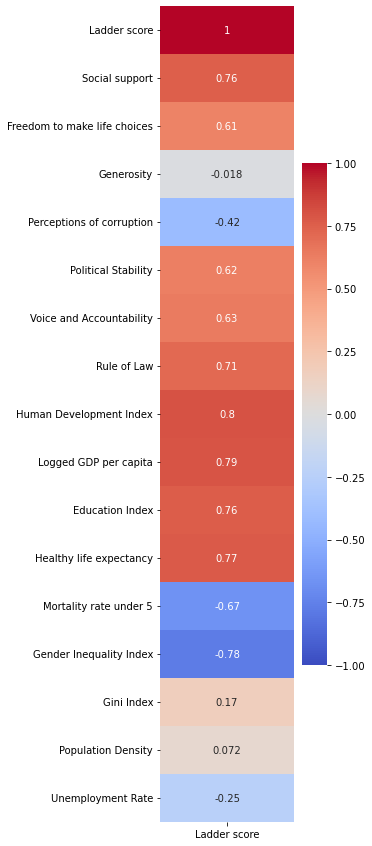

In [67]:
upp_mat = np.triu(df1[['Ladder score', 'Social support', 'Freedom to make life choices', 'Generosity', 'Perceptions of corruption', 
                 'Political Stability','Voice and Accountability','Rule of Law',   
                 'Human Development Index', 'Logged GDP per capita', 'Education Index','Healthy life expectancy',
                 'Mortality rate under 5', 'Gender Inequality Index', 'Gini Index', 'Population Density', 
                 'Unemployment Rate']].corr())
fig, ax = plt.subplots(figsize=(3,15))
sns.heatmap(df1[['Ladder score', 'Social support', 'Freedom to make life choices', 'Generosity', 'Perceptions of corruption', 
                 'Political Stability','Voice and Accountability','Rule of Law',   
                 'Human Development Index', 'Logged GDP per capita', 'Education Index','Healthy life expectancy',
                 'Mortality rate under 5', 'Gender Inequality Index', 'Gini Index', 'Population Density', 
                 'Unemployment Rate']].corr()[['Ladder score']], vmin = -1, vmax = +1, annot = True, cmap = 'coolwarm');

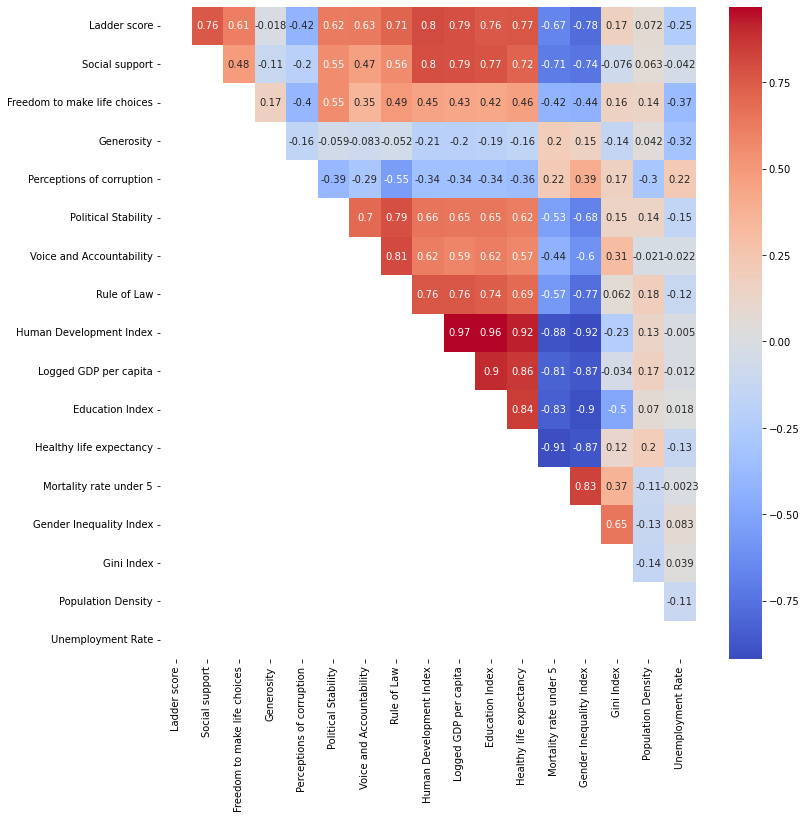

In [68]:
cor = df1[['Ladder score', 'Social support', 'Freedom to make life choices', 'Generosity', 'Perceptions of corruption', 
                 'Political Stability','Voice and Accountability','Rule of Law',   
                 'Human Development Index', 'Logged GDP per capita', 'Education Index','Healthy life expectancy',
                 'Mortality rate under 5', 'Gender Inequality Index', 'Gini Index', 'Population Density', 
                 'Unemployment Rate']].corr()
fig, ax = plt.subplots(figsize=(12,12))
upp_mat = np.tril(df1[['Ladder score', 'Social support', 'Freedom to make life choices', 'Generosity', 'Perceptions of corruption', 
                 'Political Stability','Voice and Accountability','Rule of Law',   
                 'Human Development Index', 'Logged GDP per capita', 'Education Index','Healthy life expectancy',
                 'Mortality rate under 5', 'Gender Inequality Index', 'Gini Index', 'Population Density', 
                 'Unemployment Rate']].corr())
sns.heatmap(cor, annot=True, ax=ax,mask = upp_mat, cmap='coolwarm');

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


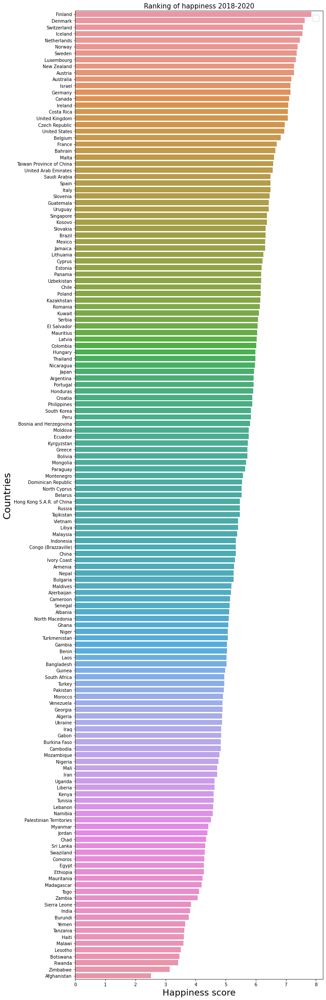

In [69]:
matplotlib.rcParams['figure.figsize']= (10, 40)
sns.barplot(x = 'Ladder score', y = 'Country', data = df1, order=df1.sort_values('Ladder score', ascending = False).Country)
plt.title('Ranking of happiness 2018-2020', fontsize = 15)
plt.xlabel('Happiness score', fontsize = 20)
plt.ylabel('Countries', fontsize = 22) 
plt.legend(fontsize = 18)
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


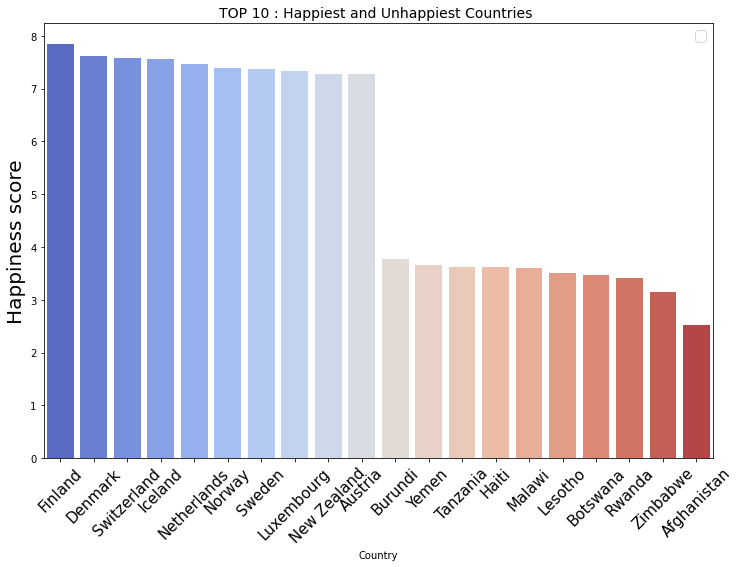

In [70]:
HC = df1.sort_values(by='Ladder score', ascending=False).head(10)
UC = df1.sort_values(by='Ladder score', ascending=False).tail(10)
Rankdf = HC.append(UC)

plt.figure(figsize=(12,8))
plt.title("TOP 10 : Happiest and Unhappiest Countries ", fontsize="14")
sns.barplot(x = Rankdf["Country"], y = Rankdf["Ladder score"], palette="coolwarm" )
plt.xticks(rotation=45, fontsize = 15);
plt.legend(fontsize = 14)
plt.ylabel('Happiness score', fontsize = 20);



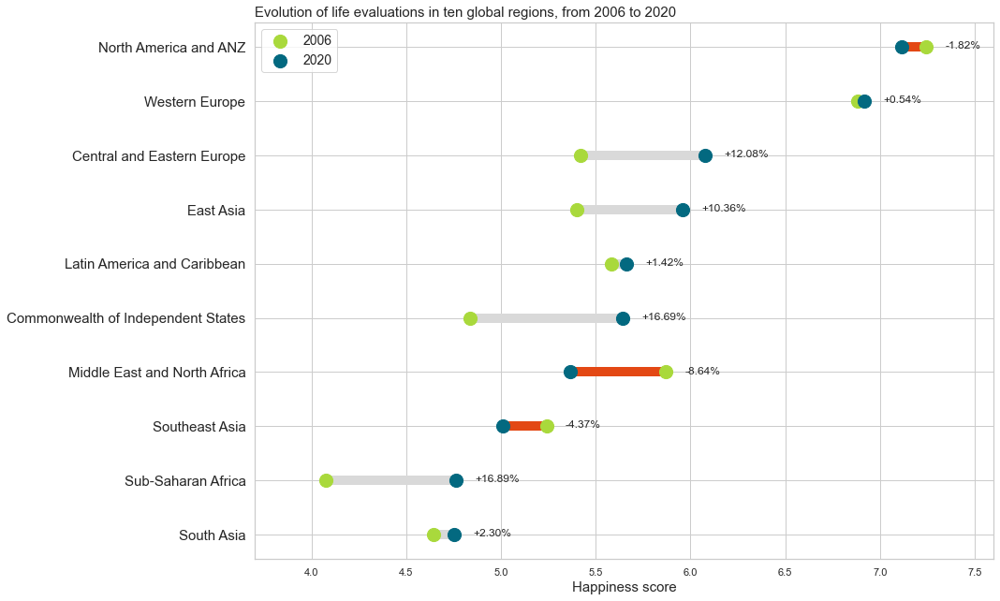

In [71]:
import io
sns.set(style="whitegrid")  # set style

df2_region_2006 = df2.loc[df2["Year"] == 2006]
df2_region_2006 = pd.DataFrame(df2_region_2006.groupby("Regional indicator")["Life Ladder"].mean())
df2_region_2006 = df2_region_2006.rename(columns = {'Life Ladder': 2006 })
df2_region_2006 = df2_region_2006.round({2006 : 3})
df2_region_2006

df2_region_2020 = df2.loc[df2["Year"] == 2020]
df2_region_2020 = pd.DataFrame(df2_region_2020.groupby("Regional indicator")["Life Ladder"].mean())
df2_region_2020 = df2_region_2020.rename(columns = {'Life Ladder': 2020 })
df2_region_2020 = df2_region_2020.round({2020 : 3})
df2_region_2020

df_region = pd.concat([df2_region_2006, df2_region_2020], axis = 1)
df_region = df_region.sort_values(by = 2020, ascending = True)

df_region["Ladder dynamics"] = df_region[2020] / df_region[2006] - 1
df_region


plt.figure(figsize=(15,9))
y_range = np.arange(1, len(df_region.index) + 1)
colors = np.where(df_region[2020] > df_region[2006], '#d9d9d9', '#e34814') 
plt.hlines(y=y_range, xmin=df_region[2006], xmax=df_region[2020],
           color=colors, lw=10)
plt.scatter(df_region[2006], y_range, color='#a9d93c', s=200, label='2006', zorder=3)
plt.scatter(df_region[2020], y_range, color='#036980', s=200 , label='2020', zorder=3)

for (_, row), y in zip(df_region.iterrows(), y_range):
    plt.annotate(f"{row['Ladder dynamics']:+.2%}", (max(row[2006], row[2020]) + 0.1, y - 0.03))
plt.legend(ncol=2, bbox_to_anchor=(1., 1.01), loc="lower right", frameon=False)

plt.yticks(y_range, df_region.index, fontsize = 15)
plt.title("Evolution of life evaluations in ten global regions, from 2006 to 2020", loc='left', fontsize = 15)
plt.xlim(3.7,7.6)
plt.gcf().subplots_adjust(left=0.35)
plt.tight_layout()
plt.legend(fontsize = 14)
plt.xlabel('Happiness score', fontsize = 15)
plt.show()

In [72]:
#europe = df_europe.groupby(['Regional indicator', 'Year']).agg(Ladder_mean=pd.NamedAgg(column="Life Ladder", 
    #aggfunc="mean"),Ladder_std =pd.NamedAgg(column="Life Ladder", aggfunc="std"))

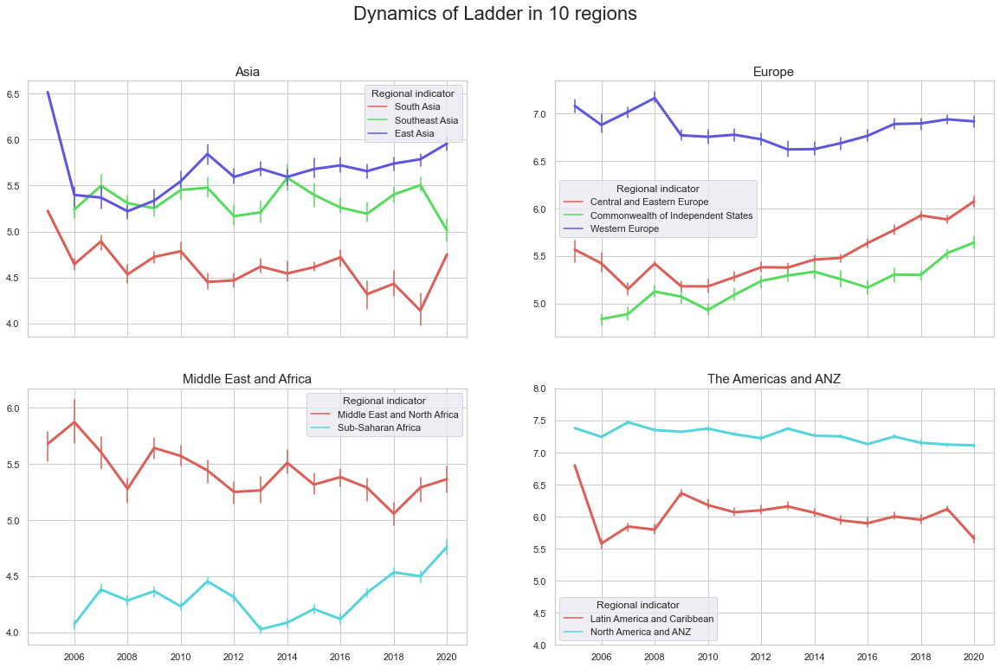

In [73]:
df_europe = df2.loc[df2['Regional indicator'].isin(['Western Europe','Central and Eastern Europe', 'Commonwealth of Independent States' ])]
df_ame = df2.loc[df2['Regional indicator'].isin(['North America and ANZ','Latin America and Caribbean' ])]
df_MEA = df2.loc[df2['Regional indicator'].isin(['Middle East and North Africa','Sub-Saharan Africa' ])]
df_asia = df2.loc[df2['Regional indicator'].isin(['East Asia','South Asia','Southeast Asia' ])]


fig, axes = plt.subplots(2, 2, sharex=True, figsize=(20,12))
fig.suptitle('Dynamics of Ladder in 10 regions', fontsize = 22)
sns.set(style="darkgrid")  # set style

asia_plot = sns.lineplot(ax=axes[0, 0], data=df_asia, x ='Year', y ='Life Ladder', hue="Regional indicator", 
                         err_style="bars", ci=30, palette = 'hls', linewidth=3)
plt.ylim(4, 8)
asia_plot.set(xlabel=None)
asia_plot.set(ylabel=None)
asia_plot.set_title("Asia", fontsize = 15);

europe_plot = sns.lineplot(ax=axes[0, 1], data=df_europe, x ='Year', y ='Life Ladder', hue="Regional indicator", 
                         err_style="bars", ci=30, palette = 'hls', linewidth=3)
plt.ylim(4, 8)
europe_plot.set(xlabel=None)
europe_plot.set(ylabel=None)
europe_plot.set_title("Europe", fontsize = 15);

mea_plot = sns.lineplot(ax=axes[1, 0], data=df_MEA , x ='Year', y ='Life Ladder', hue="Regional indicator", 
                         err_style="bars", ci=30, palette = 'hls', linewidth=3)
plt.ylim(4, 8)
mea_plot.set(xlabel=None)
mea_plot.set(ylabel=None)
mea_plot.set_title("Middle East and Africa", fontsize = 15);

america_plot = sns.lineplot(ax=axes[1, 1], data=df_ame, x ='Year', y ='Life Ladder', hue="Regional indicator", 
                         err_style="bars", ci=30, palette = 'hls', linewidth=3)
plt.ylim(4, 8)
america_plot.set(xlabel=None)
america_plot.set(ylabel=None)
america_plot.set_title("The Americas and ANZ", fontsize = 15);

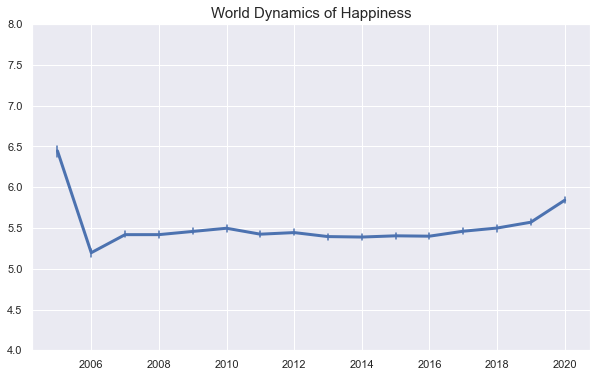

In [74]:
plt.figure(figsize=(10,6))
sns.set(style="darkgrid")  # set style
world_plot = sns.lineplot(data=df2, x ='Year', y ='Life Ladder', err_style="bars", ci=30, palette = 'hls', linewidth=3)
plt.ylim(4, 8)
world_plot.set(xlabel=None)
world_plot.set(ylabel=None)
world_plot.set_title("World Dynamics of Happiness", fontsize = 15);

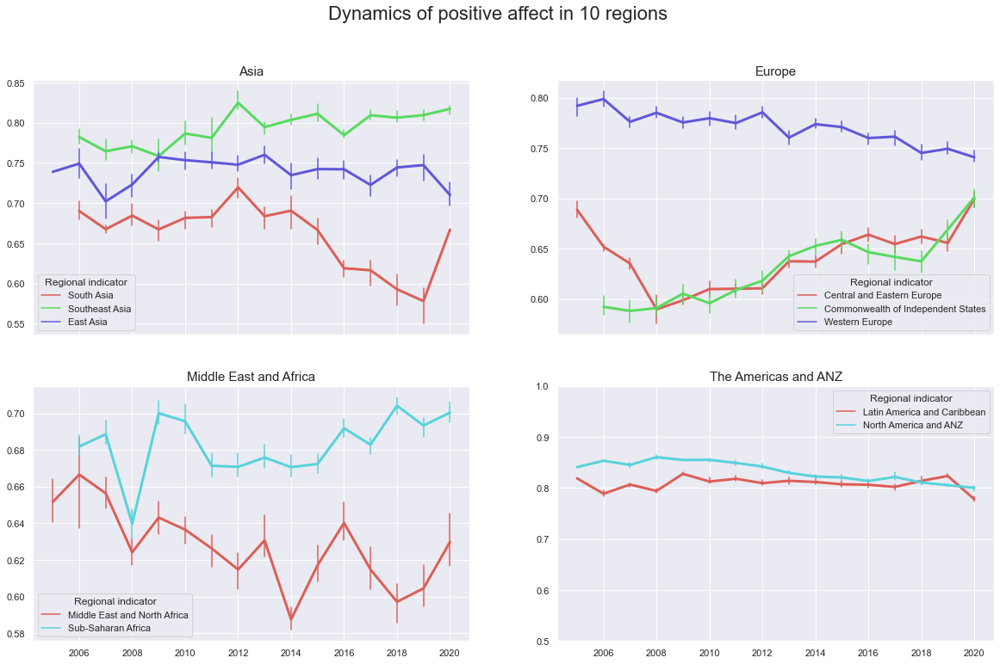

In [75]:
fig, axes = plt.subplots(2, 2, sharex=True, figsize=(20,12))
fig.suptitle('Dynamics of positive affect in 10 regions', fontsize = 22)
sns.set(style="darkgrid")  # set style

asia_plot = sns.lineplot(ax=axes[0, 0], data=df_asia, x ='Year', y ='Positive affect', hue="Regional indicator", 
                         err_style="bars", ci=30, palette = 'hls', linewidth=3)
plt.ylim(0.5, 1)
asia_plot.set(xlabel=None)
asia_plot.set(ylabel=None)
asia_plot.set_title("Asia", fontsize = 15);

europe_plot = sns.lineplot(ax=axes[0, 1], data=df_europe, x ='Year', y ='Positive affect', hue="Regional indicator", 
                         err_style="bars", ci=30, palette = 'hls', linewidth=3)
plt.ylim(0.5, 1)
europe_plot.set(xlabel=None)
europe_plot.set(ylabel=None)
europe_plot.set_title("Europe", fontsize = 15);

mea_plot = sns.lineplot(ax=axes[1, 0], data=df_MEA , x ='Year', y ='Positive affect', hue="Regional indicator", 
                         err_style="bars", ci=30, palette = 'hls', linewidth=3)
plt.ylim(0.5, 1)
mea_plot.set(xlabel=None)
mea_plot.set(ylabel=None)
mea_plot.set_title("Middle East and Africa", fontsize = 15);

america_plot = sns.lineplot(ax=axes[1, 1], data=df_ame, x ='Year', y ='Positive affect', hue="Regional indicator", 
                         err_style="bars", ci=30, palette = 'hls', linewidth=3)
plt.ylim(0.5, 1)
america_plot.set(xlabel=None)
america_plot.set(ylabel=None)
america_plot.set_title("The Americas and ANZ", fontsize = 15);

Text(3.1999999999999886, 0.5, 'y-axis')

<Figure size 2880x2880 with 0 Axes>

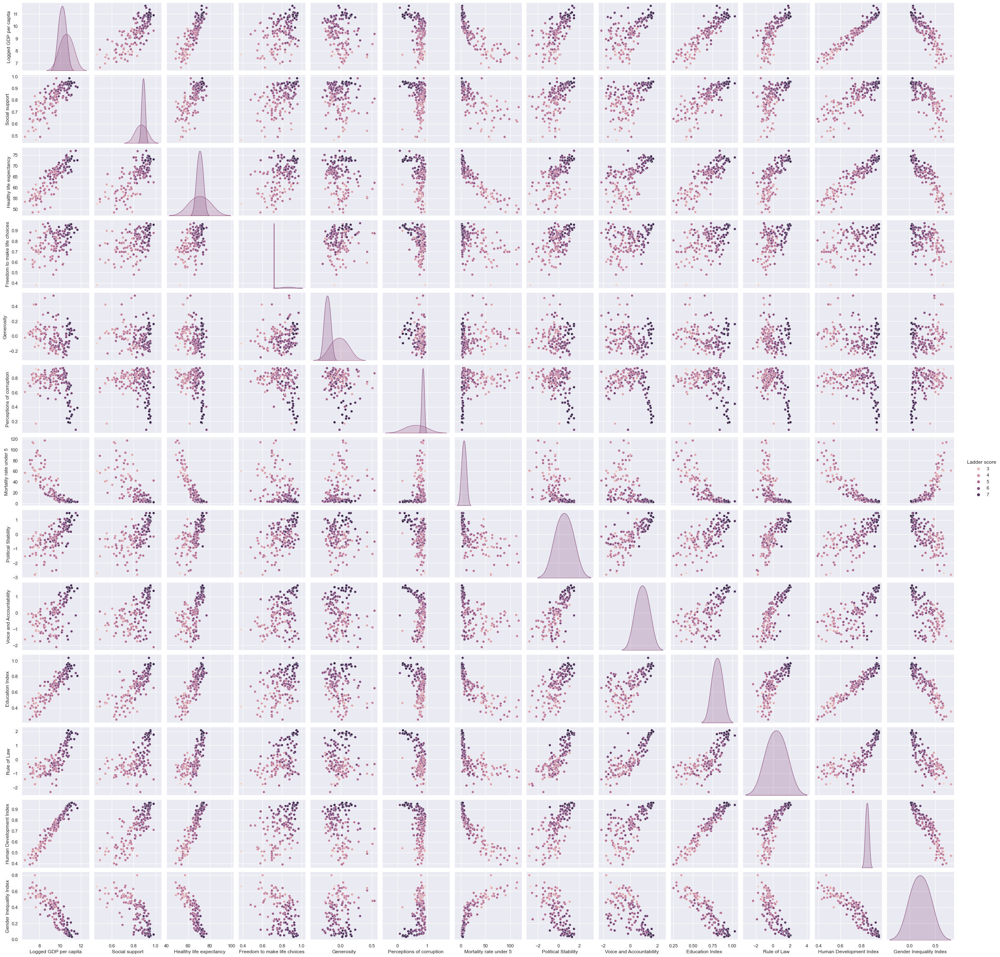

In [76]:
from matplotlib import pyplot

import matplotlib.pyplot as plt

df0 = df1.drop(['Unemployment Rate','Population Density', 'Gini Index','Country','Regional indicator', 'Country Code', 'Standard error of ladder score', 'lowerwhisker', 'upperwhisker'], axis=1)

plt.figure(figsize=(40, 40))
sns.pairplot(df0, hue = 'Ladder score', diag_kind='kde');
ax.set_xlabel('x-axis', fontsize = 25) 
ax.set_ylabel('y-axis', fontsize = 25) 

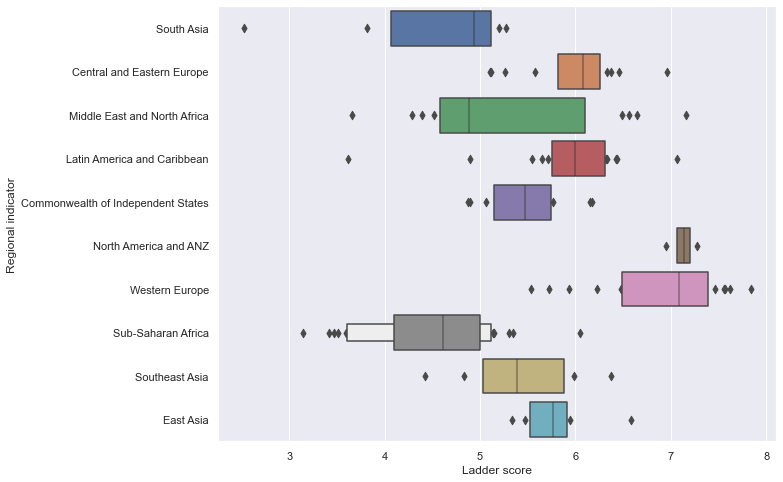

In [77]:
plt.figure(figsize=(10, 8))
sns.boxenplot(x='Ladder score', y = 'Regional indicator', data = df1);

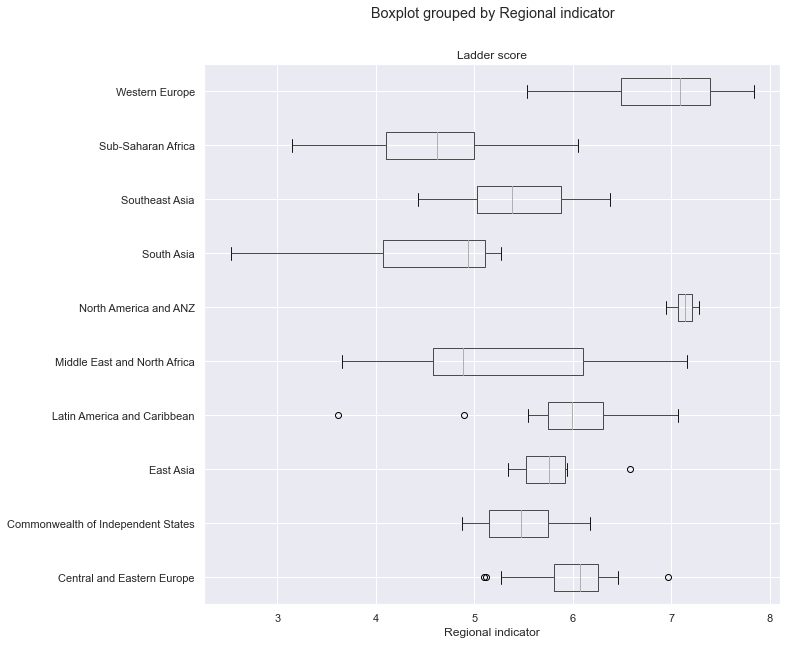

In [78]:
df1.boxplot(column='Ladder score', by = 'Regional indicator',vert = 0, figsize = (10,10));

In [79]:
from scipy.stats import pearsonr
df1_stat=df1[['Ladder score', 'Social support', 'Freedom to make life choices', 'Generosity', 'Perceptions of corruption', 
                 'Political Stability','Voice and Accountability','Rule of Law',   
                 'Human Development Index', 'Logged GDP per capita', 'Education Index','Healthy life expectancy',
                 'Mortality rate under 5', 'Gender Inequality Index', 'Gini Index', 'Population Density', 
                 'Unemployment Rate']]
rho = df1_stat.corr()
pval = df1_stat.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.applymap(lambda x: ''.join(['*' for t in [0.01,0.05,0.1] if x<=t]))
rho.round(2).astype(str) + p

# Significativité 
#   * : significatif à 10%
#  ** : significatif à 5%
# *** : significatif à 1%

,Ladder score,Social support,Freedom to make life choices,Generosity,Perceptions of corruption,Political Stability,Voice and Accountability,Rule of Law,Human Development Index,Logged GDP per capita,Education Index,Healthy life expectancy,Mortality rate under 5,Gender Inequality Index,Gini Index,Population Density,Unemployment Rate
Ladder score,1.0***,0.76***,0.61***,-0.02,-0.42***,0.62***,0.63***,0.71***,0.8***,0.79***,0.76***,0.77***,-0.67***,-0.78***,0.17,0.07,-0.25***
Social support,0.76***,1.0***,0.48***,-0.11,-0.2**,0.55***,0.47***,0.56***,0.8***,0.79***,0.77***,0.72***,-0.71***,-0.74***,-0.08,0.06,-0.04
Freedom to make life choices,0.61***,0.48***,1.0***,0.17**,-0.4***,0.55***,0.35***,0.49***,0.45***,0.43***,0.42***,0.46***,-0.42***,-0.44***,0.16,0.14,-0.37***
Generosity,-0.02,-0.11,0.17**,1.0***,-0.16**,-0.06,-0.08,-0.05,-0.21**,-0.2**,-0.19**,-0.16**,0.2**,0.15*,-0.14,0.04,-0.32***
Perceptions of corruption,-0.42***,-0.2**,-0.4***,-0.16**,1.0***,-0.39***,-0.29***,-0.55***,-0.34***,-0.34***,-0.34***,-0.36***,0.22***,0.39***,0.17,-0.3***,0.22***
Political Stability,0.62***,0.55***,0.55***,-0.06,-0.39***,1.0***,0.7***,0.79***,0.66***,0.65***,0.65***,0.62***,-0.53***,-0.68***,0.15,0.14*,-0.15*
Voice and Accountability,0.63***,0.47***,0.35***,-0.08,-0.29***,0.7***,1.0***,0.81***,0.62***,0.59***,0.62***,0.57***,-0.44***,-0.6***,0.31,-0.02,-0.02
Rule of Law,0.71***,0.56***,0.49***,-0.05,-0.55***,0.79***,0.81***,1.0***,0.76***,0.76***,0.74***,0.69***,-0.57***,-0.77***,0.06,0.18**,-0.12
Human Development Index,0.8***,0.8***,0.45***,-0.21**,-0.34***,0.66***,0.62***,0.76***,1.0***,0.97***,0.96***,0.92***,-0.88***,-0.92***,-0.23,0.13,-0.0
Logged GDP per capita,0.79***,0.79***,0.43***,-0.2**,-0.34***,0.65***,0.59***,0.76***,0.97***,1.0***,0.9***,0.86***,-0.81***,-0.87***,-0.03,0.17**,-0.01


In [80]:
print(cor["Ladder score"])

Ladder score                    1.000000
Social support                  0.756888
Freedom to make life choices    0.607753
Generosity                     -0.017799
Perceptions of corruption      -0.421140
Political Stability             0.622892
Voice and Accountability        0.634495
Rule of Law                     0.713592
Human Development Index         0.800659
Logged GDP per capita           0.789760
Education Index                 0.758834
Healthy life expectancy         0.768178
Mortality rate under 5         -0.665678
Gender Inequality Index        -0.777339
Gini Index                      0.171518
Population Density              0.072362
Unemployment Rate              -0.245368
Name: Ladder score, dtype: float64


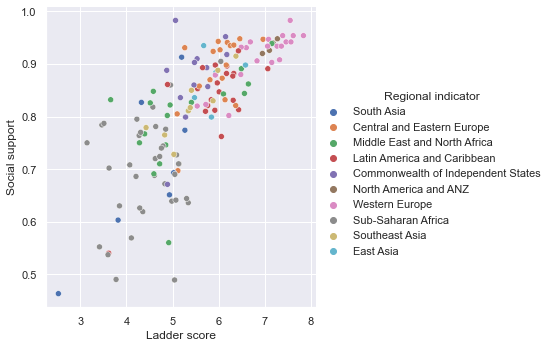

In [81]:
# Rapport bien-être / 'Social support'en fonction des différentes régions 
sns.relplot(x='Ladder score',y='Social support', hue='Regional indicator', data =df1);

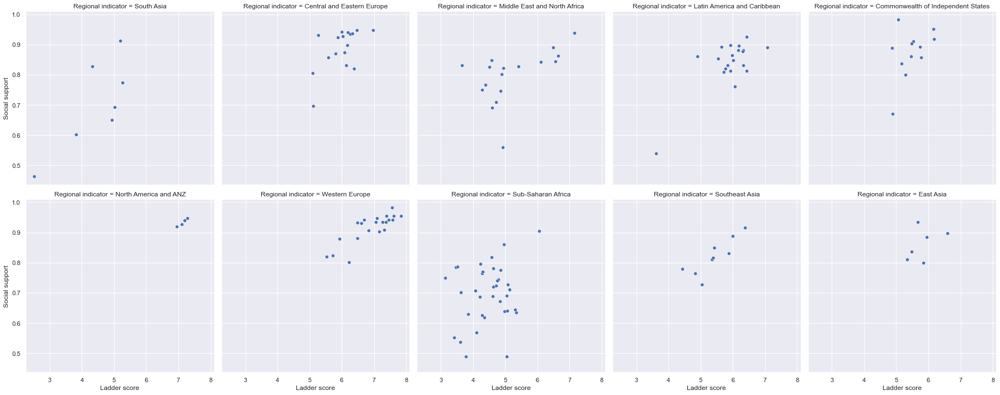

In [82]:
# Le même graphique en séparant les différentes régions
sns.relplot(x='Ladder score',y='Social support', col='Regional indicator', col_wrap=5, data =df1);

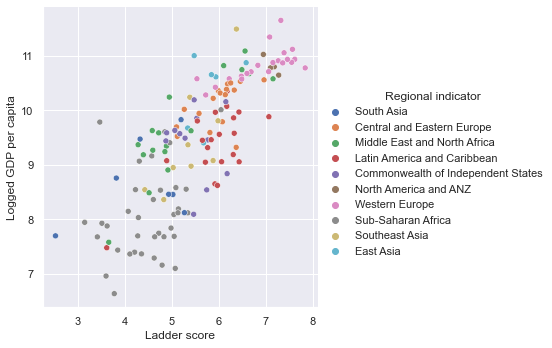

In [83]:
# Rapport bien-être / PIB par habitant ('Log GDP per capita') par région
sns.relplot(x='Ladder score',y='Logged GDP per capita', hue='Regional indicator', data =df1);

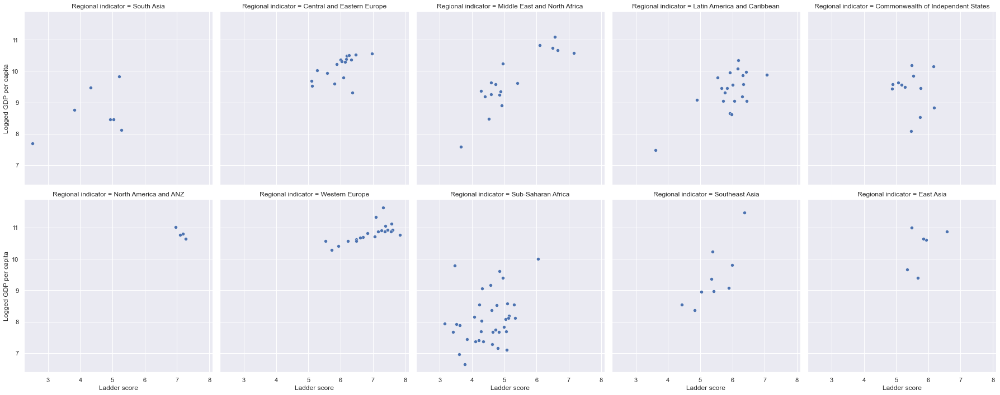

In [84]:
sns.relplot(x='Ladder score',y='Logged GDP per capita', col='Regional indicator', col_wrap=5, data =df1);

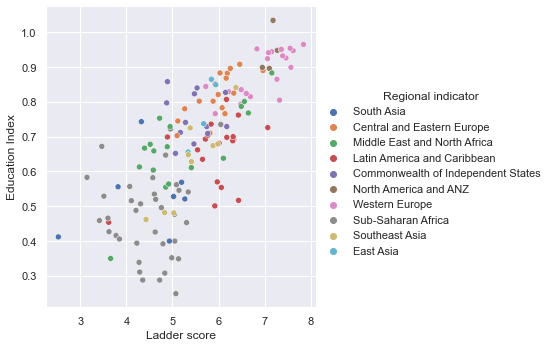

In [85]:
# Le bien-être de certaines régions est-il plus sensible au niveau d'education ('Education index') ?
sns.relplot(x='Ladder score',y='Education Index', hue='Regional indicator', data =df1);

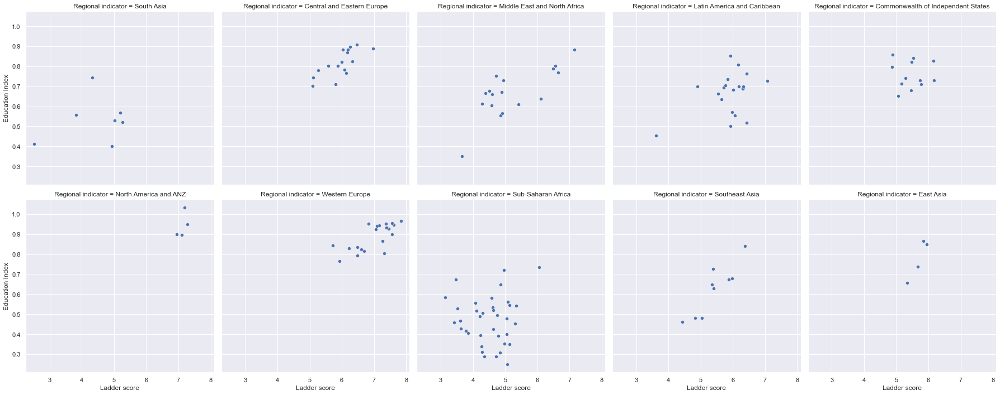

In [86]:
sns.relplot(x='Ladder score',y='Education Index', col='Regional indicator', col_wrap=5, data =df1);

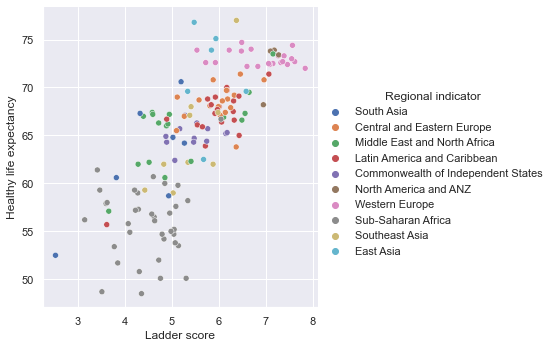

In [87]:
sns.relplot(x='Ladder score',y='Healthy life expectancy', hue='Regional indicator', data =df1);

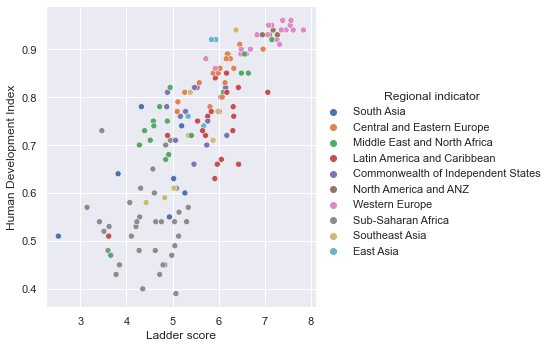

In [88]:
sns.relplot(x='Ladder score',y='Human Development Index', hue='Regional indicator', data =df1);

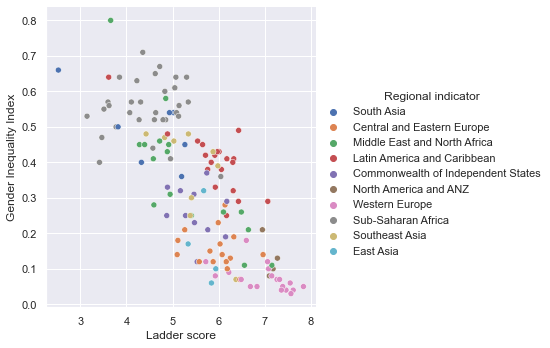

In [89]:
#Visualisation pour la correlation negative avec l'inégalité de genre
sns.relplot(x='Ladder score',y='Gender Inequality Index', hue='Regional indicator', data =df1);


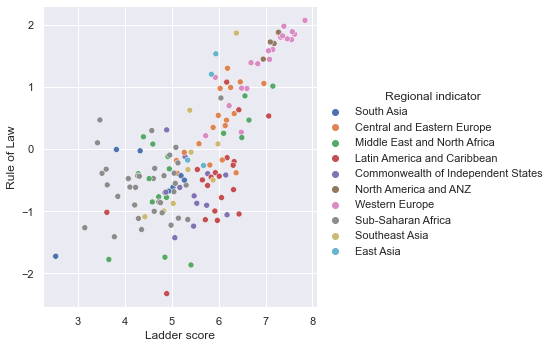

In [90]:
sns.relplot(x='Ladder score',y='Rule of Law', hue='Regional indicator', data =df1);
  

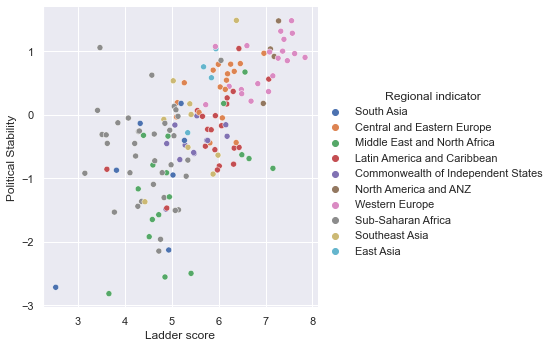

In [91]:
sns.relplot(x='Ladder score',y='Political Stability', hue ='Regional indicator', data = df1);

In [92]:
import geopandas as gpd
import json
import folium

gdf = gpd.read_file('/Users/anissa/Documents/Anissa/PROJET DATASCIENTEST/ne_110m_admin_0_countries.shp')[['ADMIN', 'ADM0_A3', 'geometry']]

In [93]:
merged=gdf.merge(df1,left_on='ADM0_A3',right_on='Country Code')
merged_json = json.loads(merged.to_json())
json_data = json.dumps(merged_json)

In [94]:
m = folium.Map(location=[48, -102], zoom_start=1)
list_of_index=['Ladder score', 'Human Development Index', 'Logged GDP per capita', 'Generosity', 'Social support', 'Gender Inequality Index', 'Political Stability', 'Rule of Law', 'Freedom to make life choices', 'Perceptions of corruption']     


for x in list_of_index:
  folium.Choropleth(
      geo_data=json_data,
      name=x,
      data=merged,
      columns=['Country', x],
      key_on='feature.properties.Country',
      fill_color='RdBu',
      fill_opacity=0.7,
      line_opacity=0.2,
      legend_name=x
   ).add_to(m)
folium.LayerControl(collapsed=False).add_to(m)
m

# 3. APPRENTISSAGE NON SUPERVISE (ACP)

In [105]:
df1_bis = pd.read_csv('World Happiness Report_Dataset_3 years.csv', index_col='Country')
df1_bis

,Unnamed: 0,Regional indicator,Ladder score,Standard error of ladder score,upperwhisker,lowerwhisker,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Country Code,Mortality rate under 5,Political Stability,Voice and Accountability,Education Index,Population Density,Unemployment Rate,Gini Index,Rule of Law,Human Development Index,Gender Inequality Index
Country,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0,South Asia,2.523,0.038,2.596,2.449,7.695,0.463,52.5,0.382,-0.102,0.924,AFG,60.13,-2.716,-1.034,0.412,58.28,11.36,NaN,-1.728,0.51,0.66
Albania,1,Central and Eastern Europe,5.117,0.059,5.234,5.001,9.520,0.697,69.0,0.785,-0.030,0.901,ALB,9.67,0.189,0.137,0.745,104.12,12.37,NaN,-0.391,0.79,0.18
Algeria,2,Middle East and North Africa,4.887,0.053,4.991,4.783,9.342,0.802,66.0,0.480,-0.067,0.752,DZA,23.27,-0.914,-1.053,0.671,18.07,11.16,NaN,-0.779,0.75,0.43
Argentina,3,Latin America and Caribbean,5.929,0.056,6.040,5.819,9.962,0.898,69.0,0.828,-0.182,0.834,ARG,9.13,-0.015,0.567,0.851,16.42,10.17,42.10,-0.381,0.84,0.33
Armenia,4,Commonwealth of Independent States,5.283,0.058,5.397,5.168,9.487,0.799,67.1,0.825,-0.168,0.629,ARM,11.50,-0.477,-0.013,0.741,103.88,19.49,32.15,-0.121,0.77,0.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Venezuela,144,Latin America and Caribbean,4.892,0.064,5.017,4.767,9.073,0.861,66.7,0.615,-0.169,0.827,VEN,24.20,-1.469,-1.457,0.699,32.44,5.58,NaN,-2.330,0.72,0.48
Vietnam,145,Southeast Asia,5.411,0.039,5.488,5.334,8.973,0.850,68.0,0.940,-0.098,0.796,VNM,21.10,0.004,-1.421,0.628,311.06,1.86,NaN,-0.051,NaN,0.30
Yemen,146,Middle East and North Africa,3.658,0.070,3.794,3.521,7.578,0.832,57.1,0.602,-0.147,0.800,YEM,60.90,-2.816,-1.770,0.350,55.23,13.20,NaN,-1.779,0.47,0.80


In [106]:
happiness = df1_bis["Ladder score"]
happiness
df1_bis = df1_bis.drop(['Unnamed: 0','Ladder score', 'Regional indicator', 'Country Code', 'Standard error of ladder score', 'upperwhisker', 'lowerwhisker', 'Gini Index'], axis=1)
df1_bis

,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Mortality rate under 5,Political Stability,Voice and Accountability,Education Index,Population Density,Unemployment Rate,Rule of Law,Human Development Index,Gender Inequality Index
Country,,,,,,,,,,,,,,,
Afghanistan,7.695,0.463,52.5,0.382,-0.102,0.924,60.13,-2.716,-1.034,0.412,58.28,11.36,-1.728,0.51,0.66
Albania,9.520,0.697,69.0,0.785,-0.030,0.901,9.67,0.189,0.137,0.745,104.12,12.37,-0.391,0.79,0.18
Algeria,9.342,0.802,66.0,0.480,-0.067,0.752,23.27,-0.914,-1.053,0.671,18.07,11.16,-0.779,0.75,0.43
Argentina,9.962,0.898,69.0,0.828,-0.182,0.834,9.13,-0.015,0.567,0.851,16.42,10.17,-0.381,0.84,0.33
Armenia,9.487,0.799,67.1,0.825,-0.168,0.629,11.50,-0.477,-0.013,0.741,103.88,19.49,-0.121,0.77,0.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Venezuela,9.073,0.861,66.7,0.615,-0.169,0.827,24.20,-1.469,-1.457,0.699,32.44,5.58,-2.330,0.72,0.48
Vietnam,8.973,0.850,68.0,0.940,-0.098,0.796,21.10,0.004,-1.421,0.628,311.06,1.86,-0.051,NaN,0.30
Yemen,7.578,0.832,57.1,0.602,-0.147,0.800,60.90,-2.816,-1.770,0.350,55.23,13.20,-1.779,0.47,0.80


In [107]:
df1_bis.info()

<class 'pandas.core.frame.DataFrame'>
Index: 149 entries, Afghanistan to Zimbabwe
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Logged GDP per capita         149 non-null    float64
 1   Social support                149 non-null    float64
 2   Healthy life expectancy       149 non-null    float64
 3   Freedom to make life choices  149 non-null    float64
 4   Generosity                    149 non-null    float64
 5   Perceptions of corruption     149 non-null    float64
 6   Mortality rate under 5        144 non-null    float64
 7   Political Stability           146 non-null    float64
 8   Voice and Accountability      146 non-null    float64
 9   Education Index               145 non-null    float64
 10  Population Density            144 non-null    float64
 11  Unemployment Rate             145 non-null    float64
 12  Rule of Law                   146 non-null    float64


In [108]:
# Remplacement des valeurs manquantes numériques par la moyenne :
for col in df1_bis.select_dtypes("number").columns:
    df1_bis[col]=df1_bis[col].fillna(df1_bis[col].median())
df1_bis.info()
df1_bis

<class 'pandas.core.frame.DataFrame'>
Index: 149 entries, Afghanistan to Zimbabwe
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Logged GDP per capita         149 non-null    float64
 1   Social support                149 non-null    float64
 2   Healthy life expectancy       149 non-null    float64
 3   Freedom to make life choices  149 non-null    float64
 4   Generosity                    149 non-null    float64
 5   Perceptions of corruption     149 non-null    float64
 6   Mortality rate under 5        149 non-null    float64
 7   Political Stability           149 non-null    float64
 8   Voice and Accountability      149 non-null    float64
 9   Education Index               149 non-null    float64
 10  Population Density            149 non-null    float64
 11  Unemployment Rate             149 non-null    float64
 12  Rule of Law                   149 non-null    float64


,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Mortality rate under 5,Political Stability,Voice and Accountability,Education Index,Population Density,Unemployment Rate,Rule of Law,Human Development Index,Gender Inequality Index
Country,,,,,,,,,,,,,,,
Afghanistan,7.695,0.463,52.5,0.382,-0.102,0.924,60.13,-2.716,-1.034,0.412,58.28,11.36,-1.728,0.510,0.66
Albania,9.520,0.697,69.0,0.785,-0.030,0.901,9.67,0.189,0.137,0.745,104.12,12.37,-0.391,0.790,0.18
Algeria,9.342,0.802,66.0,0.480,-0.067,0.752,23.27,-0.914,-1.053,0.671,18.07,11.16,-0.779,0.750,0.43
Argentina,9.962,0.898,69.0,0.828,-0.182,0.834,9.13,-0.015,0.567,0.851,16.42,10.17,-0.381,0.840,0.33
Armenia,9.487,0.799,67.1,0.825,-0.168,0.629,11.50,-0.477,-0.013,0.741,103.88,19.49,-0.121,0.770,0.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Venezuela,9.073,0.861,66.7,0.615,-0.169,0.827,24.20,-1.469,-1.457,0.699,32.44,5.58,-2.330,0.720,0.48
Vietnam,8.973,0.850,68.0,0.940,-0.098,0.796,21.10,0.004,-1.421,0.628,311.06,1.86,-0.051,0.755,0.30
Yemen,7.578,0.832,57.1,0.602,-0.147,0.800,60.90,-2.816,-1.770,0.350,55.23,13.20,-1.779,0.470,0.80


In [109]:
from sklearn import decomposition, preprocessing

from sklearn.preprocessing import StandardScaler
# Création de l'instance StandardScaler
scaler = StandardScaler()  
df1_norm = scaler.fit_transform(df1_bis)

from sklearn.decomposition import PCA
# Création de l'instance PCA
pca = PCA()  
Coord = pca.fit_transform(df1_norm)  # Calcul des coordonnées de l'ACP

Les ratio sont : [5.41564444e-01 1.21824737e-01 6.99815950e-02 6.64393785e-02
 4.56911947e-02 3.84922160e-02 3.60682267e-02 2.09064890e-02
 1.72945089e-02 1.33419000e-02 1.02977471e-02 7.70498737e-03
 6.57647349e-03 3.30509511e-03 5.11007171e-04]


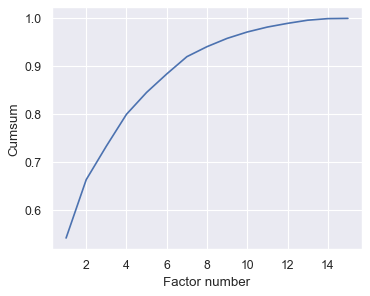

In [110]:
print('Les ratio sont :',pca.explained_variance_ratio_)

from matplotlib.pyplot import figure

figure(figsize=(5, 4), dpi=80)

plt.plot(np.arange(1, 16), np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Factor number')
plt.ylabel('Cumsum');


[0.54156444 0.66338918 0.73337078 0.79981015 0.84550135 0.88399357
 0.92006179 0.94096828 0.95826279 0.97160469 0.98190244 0.98960742
 0.9961839  0.99948899 1.        ]


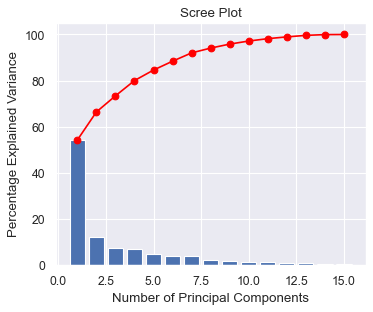

In [111]:
figure(figsize=(5, 4), dpi=80)

def display_scree_plot(pca):
    scree = pca.explained_variance_ratio_*100
    plt.bar(np.arange(len(scree))+1, scree)
    plt.plot(np.arange(len(scree))+1, scree.cumsum(),c="red",marker='o')
    plt.xlabel("Number of Principal Components")
    plt.ylabel("Percentage Explained Variance")
    plt.title("Scree Plot")
    plt.show(block=False)
expvar = np.round(pca.explained_variance_ratio_,5) 
expvar
print(pca.explained_variance_ratio_.cumsum())
display_scree_plot(pca)

In [112]:
# Le nombre de composantes pour une compression optimale des données par ACP serait de :

model = PCA(n_components=0.95) # On souhaite 95% de variance expliquée 
coord = model.fit_transform(df1_norm)
print('Le nombre optimal de composantes pour une compression de données par ACP est de :', model.n_components_)

Le nombre optimal de composantes pour une compression de données par ACP est de : 9


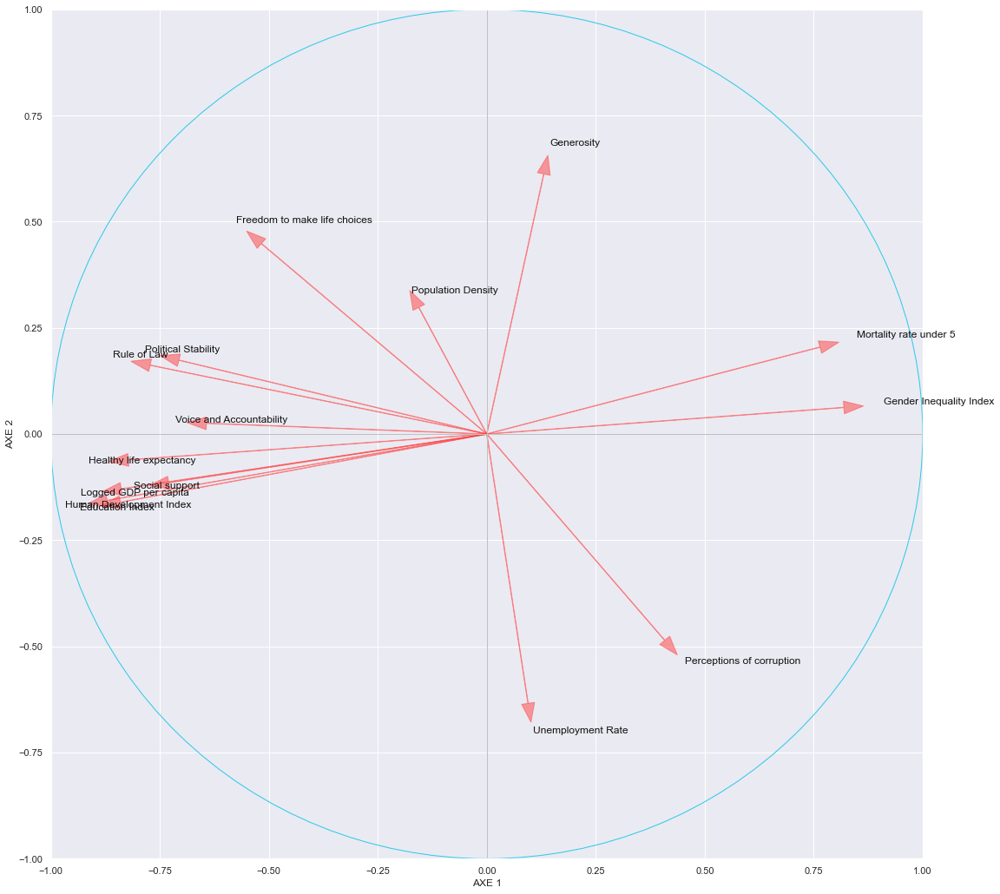

In [113]:
sqrt_eigval = np.sqrt(pca.explained_variance_)
corvar = np.zeros((15, 15))
for k in range(15):
    corvar[:, k] = pca.components_[k, :] * sqrt_eigval[k]
# corvar

fig, axes = plt.subplots(figsize=(18, 18))
axes.set_xlim(-1, 1)
axes.set_ylim(-1, 1)

# affichage des étiquettes (noms des variables)
for j in range(15):
    plt.annotate(df1_bis.columns[j], (corvar[j, 0], corvar[j, 1]), color='#101010')
    plt.arrow(0, 0, corvar[j, 0]*0.9, corvar[j, 1]*0.9, alpha=0.5, head_width=0.03, color='#ff4040')

# ajouter les axes
plt.plot([-1, 1], [0, 0], color='silver', linestyle='-', linewidth=1)
plt.plot([0, 0], [-1, 1], color='silver', linestyle='-', linewidth=1)

cercle = plt.Circle((0, 0), 1, color='#2acaea', fill=False)
axes.add_artist(cercle)
plt.xlabel('AXE 1')
plt.ylabel('AXE 2')
plt.show();

In [114]:
q = [0, 0.25, 0.5, 0.75, 1]

happinessx = pd.qcut(happiness, q)
happinessx.value_counts()

(2.5220000000000002, 4.852]    38
(4.852, 5.534]                 37
(5.534, 6.255]                 37
(6.255, 7.842]                 37
Name: Ladder score, dtype: int64

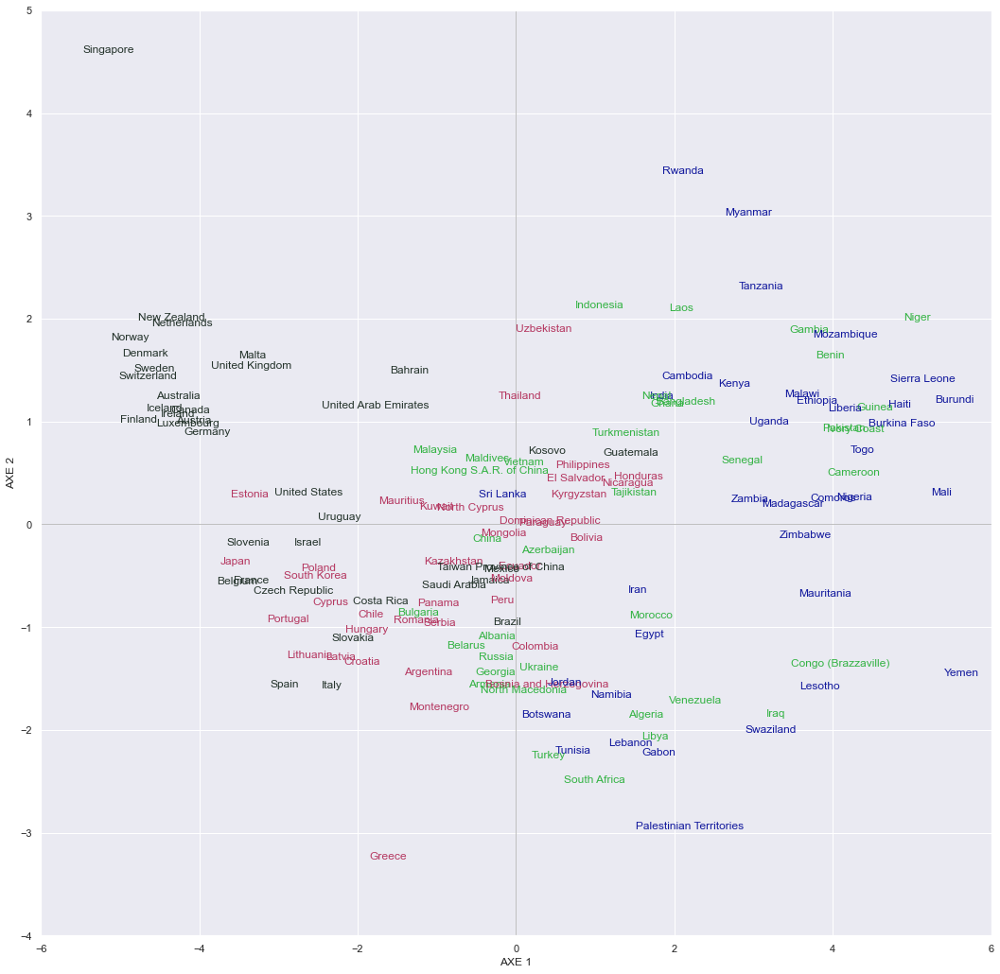

In [115]:
#positionnement des pays dans le premier plan
fig, axes = plt.subplots(figsize=(18, 18))
axes.set_xlim(-6, 6) #même limites en abscisse
axes.set_ylim(-4, 5) #et en ordonnée

#placement des étiquettes des observations
for i in range(149):
    if happiness[i] in happinessx.cat.categories[0]:
        plt.annotate(df1_bis.index[i], (Coord[i, 0],Coord[i, 1]), color='#12199d')
    elif happiness[i] in happinessx.cat.categories[1]:
        plt.annotate(df1_bis.index[i], (Coord[i, 0],Coord[i, 1]), color='#34b344')
    elif happiness[i] in happinessx.cat.categories[2]:
        plt.annotate(df1_bis.index[i], (Coord[i, 0],Coord[i, 1]), color='#b53861')
    else:
        plt.annotate(df1_bis.index[i], (Coord[i, 0],Coord[i, 1]), color='#24332b')
            
#ajouter les axes
plt.plot([-6, 6], [0,0], color='silver', linestyle='-', linewidth=1)
plt.plot([0, 0], [-6, 6], color='silver', linestyle='-', linewidth=1)
plt.xlabel('AXE 1')
plt.ylabel('AXE 2')
#affichage
plt.show();

In [116]:
#loadings = pd.DataFrame(pca.components_.T, columns=['PC1', 'PC2'], index=df1.feature_names)
loadings = pca.components_

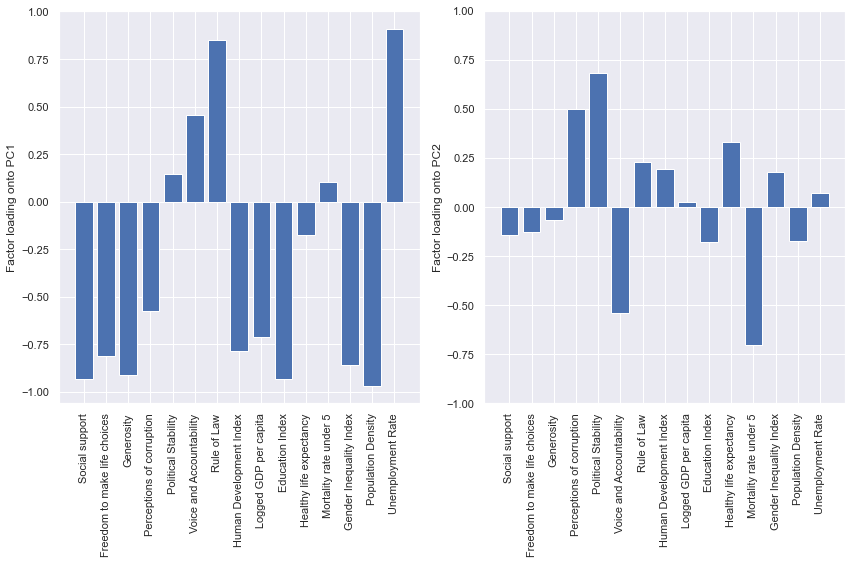

In [117]:
from sklearn import decomposition
pca_2 = PCA(n_components=2)
pca_2.fit_transform(df1_norm);


xlabels = ['Social support', 'Freedom to make life choices', 'Generosity', 'Perceptions of corruption', 'Political Stability', 'Voice and Accountability', 'Rule of Law', 'Human Development Index', 'Logged GDP per capita', 'Education Index', 'Healthy life expectancy', 'Mortality rate under 5', 'Gender Inequality Index', 'Population Density', 'Unemployment Rate']

loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

fig, ax = plt.subplots(1, 2, figsize=(12, 8))

ax[0].bar(range(15), loadings[:, 0], align='center')
ax[1].bar(range(15), loadings[:, 1], align='center')

ax[0].set_ylabel('Factor loading onto PC1')
ax[1].set_ylabel('Factor loading onto PC2')

ax[0].set_xticks(range(15))
ax[1].set_xticks(range(15))
ax[0].set_xticklabels(xlabels, rotation=90)
ax[1].set_xticklabels(xlabels, rotation=90)
plt.ylim([-1, 1])

plt.tight_layout()

In [118]:
pca_2 = PCA(n_components=2, random_state=2020)
pca_2.fit (df1_norm)
df1_pca_2 = pca_2.transform(df1_norm)

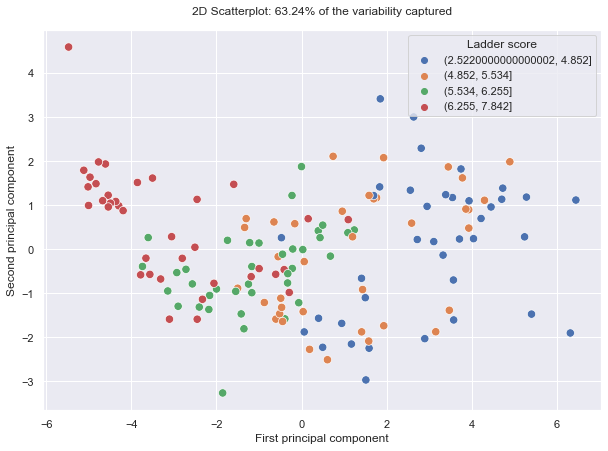

In [119]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x=df1_pca_2[:, 0], y=df1_pca_2[:, 1], s=70, hue = happinessx)
plt.title("2D Scatterplot: 63.24% of the variability captured", pad=15)
plt.xlabel("First principal component")
plt.ylabel ("Second principal component")
plt.savefig("2d_scatterplot.png")

# 4. Apprentissage supervisé

In [120]:
from sklearn import model_selection, preprocessing
from sklearn.model_selection import cross_val_predict, cross_val_score, cross_validate
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

# Metrics and Grid Search
from sklearn import model_selection, metrics
from sklearn.model_selection import GridSearchCV
import scipy.stats as stats

In [121]:
df2.head()

,Country,Regional indicator,Country Code,Year,Life Ladder,Social support,Freedom to make life choices,Generosity,Perceptions of corruption,Political Stability,Voice and Accountability,Rule of Law,Human Development Index,Log GDP per capita,Education Index,Healthy life expectancy at birth,Mortality rate under 5,Gender Inequality Index,Gini Index,Population Density,Unemployment Rate,Positive affect,Negative affect
0,Afghanistan,South Asia,AFG,2008,3.724,0.451,0.718,0.168,0.882,-2.690,-1.169,-1.864,0.447,7.370,0.344,50.80,95.7,NaN,NaN,42.463,11.093,0.518,0.258
1,Afghanistan,South Asia,AFG,2009,4.402,0.552,0.679,0.190,0.850,-2.713,-1.375,-1.847,0.460,7.540,0.351,51.20,91.7,NaN,NaN,43.493,11.311,0.584,0.237
2,Afghanistan,South Asia,AFG,2010,4.758,0.539,0.600,0.121,0.707,-2.579,-1.404,-1.845,0.472,7.647,0.371,51.60,87.8,0.751,NaN,44.704,11.352,0.618,0.275
3,Afghanistan,South Asia,AFG,2011,3.832,0.521,0.496,0.162,0.731,-2.502,-1.336,-1.897,0.477,7.620,0.374,51.92,84.0,0.743,NaN,46.131,11.054,0.611,0.267
4,Afghanistan,South Asia,AFG,2012,3.783,0.521,0.531,0.236,0.776,-2.419,-1.267,-1.643,0.489,7.705,0.391,52.24,80.3,0.734,NaN,47.731,11.341,0.710,0.268


In [122]:
# On rédifinit l'index de notre dataframe
df2.index = df2['Country'] + ' - ' + df2['Regional indicator']

# On supprime les colonnes :
df2 = df2.drop(['Country','Country Code', 'Regional indicator', 'Gini Index', 'Year', 'Human Development Index', 'Population Density'], axis=1)
df2.head()

,Life Ladder,Social support,Freedom to make life choices,Generosity,Perceptions of corruption,Political Stability,Voice and Accountability,Rule of Law,Log GDP per capita,Education Index,Healthy life expectancy at birth,Mortality rate under 5,Gender Inequality Index,Unemployment Rate,Positive affect,Negative affect
Afghanistan - South Asia,3.724,0.451,0.718,0.168,0.882,-2.690,-1.169,-1.864,7.370,0.344,50.80,95.7,NaN,11.093,0.518,0.258
Afghanistan - South Asia,4.402,0.552,0.679,0.190,0.850,-2.713,-1.375,-1.847,7.540,0.351,51.20,91.7,NaN,11.311,0.584,0.237
Afghanistan - South Asia,4.758,0.539,0.600,0.121,0.707,-2.579,-1.404,-1.845,7.647,0.371,51.60,87.8,0.751,11.352,0.618,0.275
Afghanistan - South Asia,3.832,0.521,0.496,0.162,0.731,-2.502,-1.336,-1.897,7.620,0.374,51.92,84.0,0.743,11.054,0.611,0.267
Afghanistan - South Asia,3.783,0.521,0.531,0.236,0.776,-2.419,-1.267,-1.643,7.705,0.391,52.24,80.3,0.734,11.341,0.710,0.268


In [123]:
df2.info()
df2.to_csv("World Happiness Report_Dataset for machine learning.csv")

<class 'pandas.core.frame.DataFrame'>
Index: 1949 entries, Afghanistan - South Asia to Zimbabwe - Sub-Saharan Africa
Data columns (total 16 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Life Ladder                       1949 non-null   float64
 1   Social support                    1936 non-null   float64
 2   Freedom to make life choices      1917 non-null   float64
 3   Generosity                        1860 non-null   float64
 4   Perceptions of corruption         1839 non-null   float64
 5   Political Stability               1932 non-null   float64
 6   Voice and Accountability          1933 non-null   float64
 7   Rule of Law                       1938 non-null   float64
 8   Log GDP per capita                1913 non-null   float64
 9   Education Index                   1907 non-null   float64
 10  Healthy life expectancy at birth  1894 non-null   float64
 11  Mortality rate under 5    

In [124]:
# Séparation de la variable cible 'Life Ladder' des autres variables explicatives :
target = df2['Life Ladder']
data = df2.drop('Life Ladder',  axis=1)

In [125]:
# Séparation des données en un ensemble d'apprentissage (X_train,y_train) et un ensemble de test (X_test, y_test) contenant 20% du total des données.
X_train, X_test, y_train, y_test = train_test_split(data, target, test_size=0.2, random_state=700) 

In [126]:
# Remplacement des valeurs manquantes par la médiane :
for col in X_train.columns:
    X_train[col].fillna(X_train[col].median(), inplace=True)
for col in X_test.columns:
    X_test[col].fillna(X_train[col].median(), inplace=True)
    
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1559 entries, Botswana - Sub-Saharan Africa to Malta - Western Europe
Data columns (total 15 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Social support                    1559 non-null   float64
 1   Freedom to make life choices      1559 non-null   float64
 2   Generosity                        1559 non-null   float64
 3   Perceptions of corruption         1559 non-null   float64
 4   Political Stability               1559 non-null   float64
 5   Voice and Accountability          1559 non-null   float64
 6   Rule of Law                       1559 non-null   float64
 7   Log GDP per capita                1559 non-null   float64
 8   Education Index                   1559 non-null   float64
 9   Healthy life expectancy at birth  1559 non-null   float64
 10  Mortality rate under 5            1559 non-null   float64
 11  Gender Inequality Index     

# 4.1. Régression linéaire multiple

In [127]:
# Modèle de fonction prédéfini pour tester les différents modèles
def modelfit(model):
    model.fit(X_train, y_train)
    y_pred_test = model.predict(X_test)
    y_pred_train = model.predict(X_train)
    train_score = model.score(X_train, y_train)
    test_score = model.score(X_test, y_test)
    mae = metrics.mean_absolute_error(y_test, y_pred_test)
    rmse_test = metrics.mean_squared_error(y_test, y_pred_test, squared=False)
    rmse_train = metrics.mean_squared_error(y_train, y_pred_train, squared=False)
    print(('Train score:', round(train_score,4)), ('Test score :', round(test_score,4)), ('MAE:', round(mae,4)),("RMSE test: ", round(rmse_test,4)), ("RMSE train: ", round(rmse_train,4))) 

In [128]:
# # Instanciation d'un régresseur 
lr = LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1000, normalize=False)
modelfit(lr)

('Train score:', 0.7835) ('Test score :', 0.7717) ('MAE:', 0.3969) ('RMSE test: ', 0.5133) ('RMSE train: ', 0.5237)


In [129]:
#Affichage du score obtenu par validation croisée grâce à la fonction cross_val_score().
print(cross_val_score(lr,X_train,y_train, cv=5).mean())

0.77518593878417


Les scores obtenus sur l'échantillon d'apprentissage sont corrects. Le modèle semble bien ajusté aux données

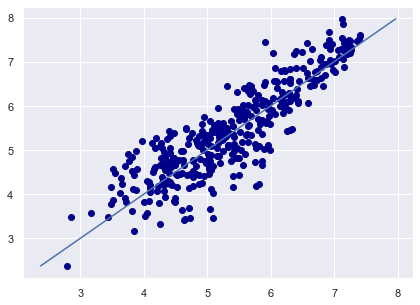

In [130]:
# Affichage dans un graphique le nuage de points entre pred_test et y_test, en ajoutant 
# la droite d'équation  y=x.
plt.figure(figsize=(7, 5))
y_pred_test = lr.predict(X_test)
plt.scatter(y_pred_test, y_test, color='darkblue')
plt.plot((y_test.min(), y_test.max()), (y_test.min(), y_test.max()));

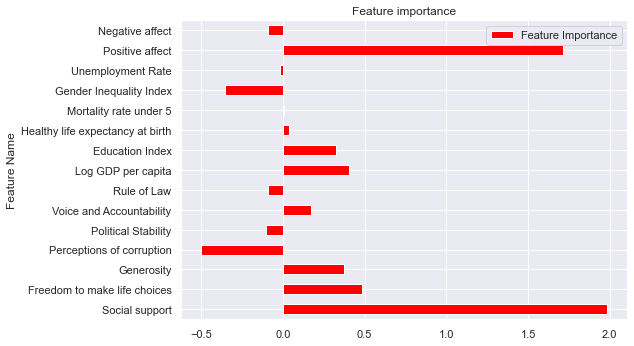

In [131]:
plt.rcParams["figure.figsize"] = (8,5.5)

def display_feat_imp_reg(reg):
  feat_imp_reg = lr.coef_
  reg_feat_importance = pd.DataFrame(columns=["Feature Name", "Feature Importance"])
  reg_feat_importance["Feature Name"] = pd.Series(reg.feature_names_in_)
  reg_feat_importance["Feature Importance"] = pd.Series(feat_imp_reg)
  reg_feat_importance.plot.barh(y="Feature Importance", x="Feature Name", title="Feature importance", color="red")
 
display_feat_imp_reg(lr);

Les prédictions ont l'air d'être bonnes, les points sont assez proches de la droite.

# 4.2. Régression multiple régularisée - Regression Ridge

In [132]:
# Régressoin Ridge 

from sklearn.linear_model import RidgeCV

ridge_reg = RidgeCV(alphas= (0.001, 0.01, 0.1, 0.3, 0.7, 1, 10, 50, 100, 200, 230, 270, 275, 290, 300, 500), cv=3)
modelfit(ridge_reg) 

('Train score:', 0.7835) ('Test score :', 0.7718) ('MAE:', 0.3972) ('RMSE test: ', 0.5131) ('RMSE train: ', 0.5237)


Text(0, 0.5, 'Actual values of happiness score')

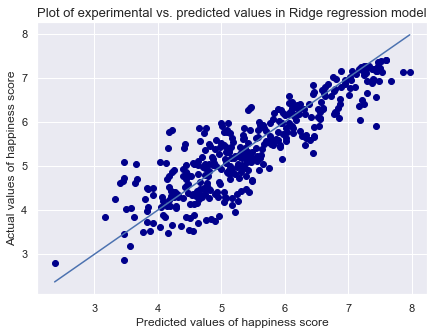

In [133]:
# Affichage dans un graphique le nuage de points entre pred_test et y_test, en ajoutant 
# la droite d'équation  y=x.
plt.figure(figsize=(7, 5))

y_pred_ridge=ridge_reg.predict(X_test)

plt.scatter(y_test, y_pred_ridge, color='darkblue');
plt.plot((y_test.min(), y_test.max()), (y_test.min(), y_test.max()));
plt.title('Plot of experimental vs. predicted values in Ridge regression model', fontsize = 13);
plt.xlabel("Predicted values of happiness score")
plt.ylabel ("Actual values of happiness score")



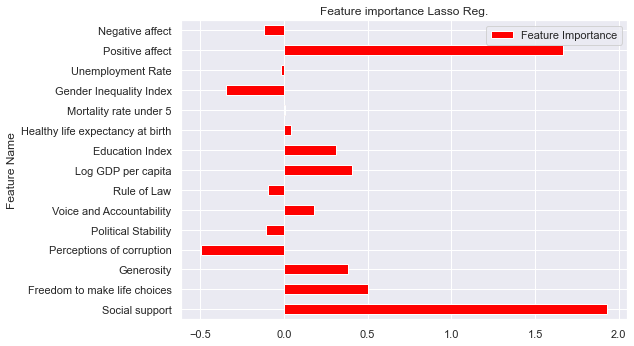

In [134]:
def display_feat_imp_reg(reg):
  feat_imp_reg = ridge_reg.coef_
  reg_feat_importance = pd.DataFrame(columns=["Feature Name", "Feature Importance"])
  reg_feat_importance["Feature Name"] = pd.Series(reg.feature_names_in_)
  reg_feat_importance["Feature Importance"] = pd.Series(feat_imp_reg)
  reg_feat_importance.plot.barh(y="Feature Importance", x="Feature Name", title="Feature importance Lasso Reg.", color="red")
 
display_feat_imp_reg(ridge_reg)

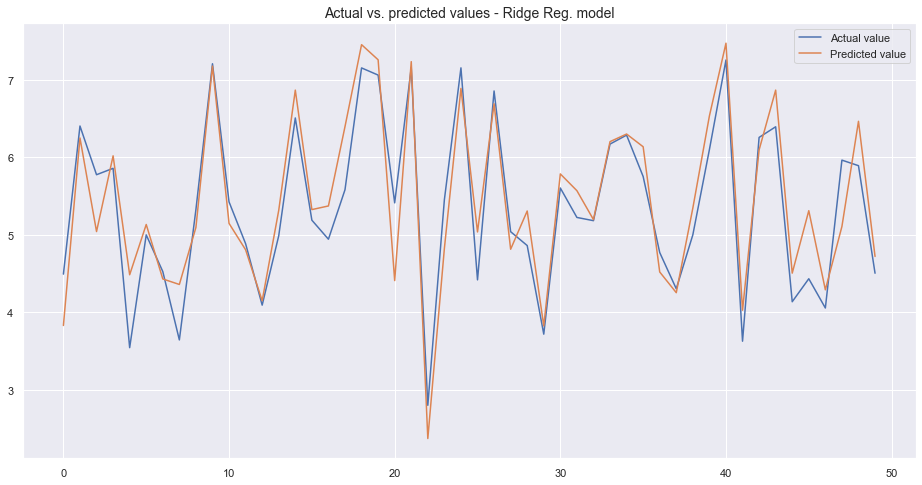

In [135]:
test_ridge = pd.DataFrame({'Predicted value':y_pred_ridge, 'Actual value':y_test})
fig= plt.figure(figsize=(16,8))
test_ridge = test_ridge.reset_index()
test_ridge = test_ridge.drop(['index'],axis=1)
plt.plot(test_ridge[:50])
plt.legend(['Actual value','Predicted value']);
plt.title('Actual vs. predicted values - Ridge Reg. model', fontsize = 14);

# 4.3. Régression multiple régularisée - Regression Lasso

In [136]:
# Régression Lasso

from sklearn.linear_model import LassoCV
lasso_reg = LassoCV(alphas= (0.001, 0.02, 0.024, 0.025, 0.026, 0.03), cv=3)
modelfit(lasso_reg)

('Train score:', 0.7831) ('Test score :', 0.7753) ('MAE:', 0.3948) ('RMSE test: ', 0.5092) ('RMSE train: ', 0.5242)


Text(0, 0.5, 'Actual values of happiness score')

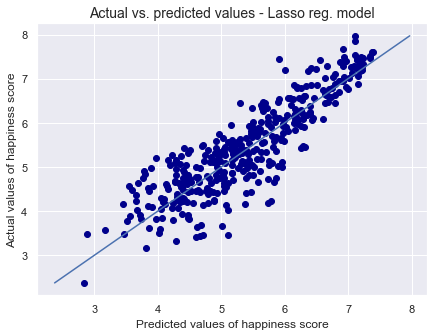

In [137]:
# Affichage dans un graphique le nuage de points entre pred_test et y_test, en ajoutant 
# la droite d'équation  y=x.
plt.figure(figsize=(7, 5))

y_pred_lasso=lasso_reg.predict(X_test)
plt.scatter(y_pred_lasso, y_test, color='darkblue')
plt.title('Actual vs. predicted values - Lasso reg. model', fontsize = 14);

plt.plot((y_test.min(), y_test.max()), (y_test.min(), y_test.max()));
plt.xlabel("Predicted values of happiness score")
plt.ylabel ("Actual values of happiness score")

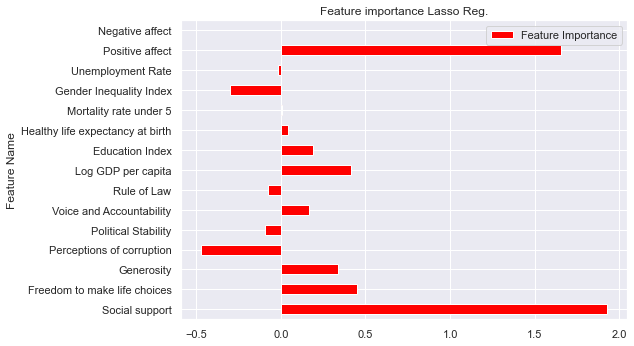

In [138]:
def display_feat_imp_reg(reg):
  feat_imp_reg = lasso_reg.coef_
  reg_feat_importance = pd.DataFrame(columns=["Feature Name", "Feature Importance"])
  reg_feat_importance["Feature Name"] = pd.Series(reg.feature_names_in_)
  reg_feat_importance["Feature Importance"] = pd.Series(feat_imp_reg)
  reg_feat_importance.plot.barh(y="Feature Importance", x="Feature Name", title="Feature importance Lasso Reg.", color="red")
 
display_feat_imp_reg(lasso_reg)

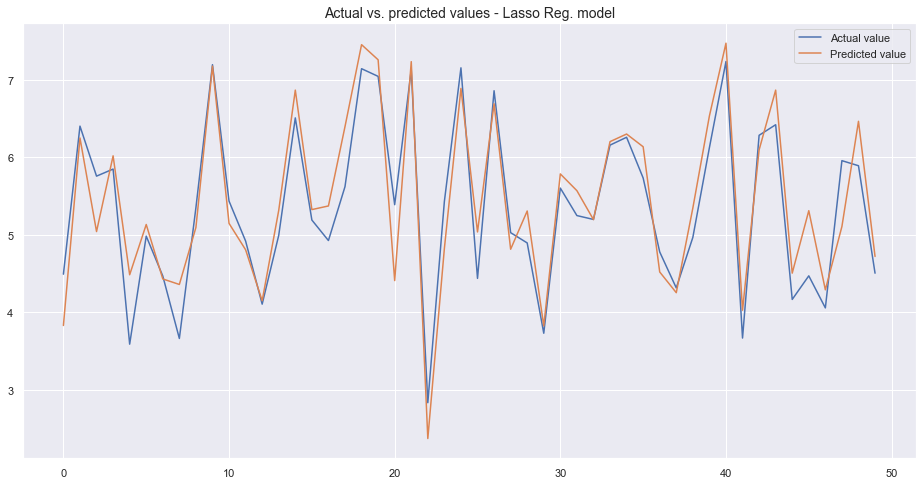

In [139]:
test_lasso = pd.DataFrame({'Predicted value':y_pred_lasso, 'Actual value':y_test})
fig= plt.figure(figsize=(16,8))
test_lasso = test_lasso.reset_index()
test_lasso = test_lasso.drop(['index'],axis=1)
plt.plot(test_lasso[:50])
plt.legend(['Actual value','Predicted value']);
plt.title('Actual vs. predicted values - Lasso Reg. model', fontsize = 14);

# 4.4. SelectKBest

In [140]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression


sk = SelectKBest(k=10)
sk.fit(X_train, y_train)
# See selected features
sk_features = X_train.columns[sk.get_support()]
print(f"===== {len(sk_features)} variables ont été sélectionnées =====")
print(f"{', '.join(sk_features)}")

===== 10 variables ont été sélectionnées =====
Social support, Freedom to make life choices, Perceptions of corruption, Voice and Accountability, Rule of Law, Log GDP per capita, Education Index, Healthy life expectancy at birth, Mortality rate under 5, Gender Inequality Index


In [141]:
sk_train = sk.transform(X_train)
sk_test = sk.transform(X_test)

In [142]:
# modèle de régression linéaire à partir de sk_train et y_train.

sklr = LinearRegression()
sklr.fit(sk_train, y_train)

print(sklr.score(sk_train, y_train))
print(sklr.score(sk_test, y_test))

0.7533480471648696
0.749671843705902


# 4.5. Random Forest Regression

In [147]:
from sklearn.ensemble import RandomForestRegressor
rf_regressor = RandomForestRegressor()
rf_regressor.fit(X_train,y_train)

rf_regressor_score_train = rf_regressor.score(X_train,y_train)
print("Training score: ", rf_regressor_score_train)
rf_regressor_score_test = rf_regressor.score(X_test, y_test)
print("Testing score: ",rf_regressor_score_test)

y_pred_rf_test = rf_regressor.predict(X_test)
y_pred_rf_train = rf_regressor.predict(X_train)
mae = metrics.mean_absolute_error(y_test, y_pred_rf_test)
rmse_test = metrics.mean_squared_error(y_test, y_pred_rf_test, squared=False)
rmse_train = metrics.mean_squared_error(y_train, y_pred_rf_train, squared=False)
print(('MAE:', round(mae,4)),("RMSE test: ", round(rmse_test,4)), ("RMSE train: ", round(rmse_train,4))) 

Training score:  0.9837545809337139
Testing score:  0.8806756051247884
('MAE:', 0.2876) ('RMSE test: ', 0.371) ('RMSE train: ', 0.1435)


In [215]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num =10)]
# Nombre de variables à considérer at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 100, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
rfr_parameters = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

Utilisation de Random Grid pour l'optimisation des hyperparamètres

In [216]:
# First create the base model to tune
rfr_tuning = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rfr_random = RandomizedSearchCV(estimator = rfr_tuning, param_distributions = rfr_parameters, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rfr_random.fit(X_train,y_train)
rfr_random.best_params_

Fitting 3 folds for each of 100 candidates, totalling 300 fits


{'n_estimators': 400,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': None,
 'bootstrap': False}

In [217]:
rf_regressor_random = RandomForestRegressor(n_estimators = 400, min_samples_split= 2,min_samples_leaf= 1,
 max_features= 'sqrt',max_depth =None, bootstrap = False)
rf_regressor_random.fit(X_train,y_train)

rf_regressor_score_train = rf_regressor_random.score(X_train,y_train)
print("Training score: ", rf_regressor_score_train)
rf_regressor_score_test = rf_regressor_random.score(X_test, y_test)
print("Testing score: ",rf_regressor_score_test)

Training score:  1.0
Testing score:  0.898308187600372


In [218]:
y_pred_rfr_tuned_test = rf_regressor_random.predict(X_test)
y_pred_rfr_tuned_train = rf_regressor_random.predict(X_train)
mae = metrics.mean_absolute_error(y_test, y_pred_rfr_tuned_test)
rmse_test = metrics.mean_squared_error(y_test, y_pred_rfr_tuned_test, squared=False)
rmse_train = metrics.mean_squared_error(y_train, y_pred_rfr_tuned_train, squared=False)
print(('MAE:', round(mae,4)),("RMSE test: ", round(rmse_test,4)), ("RMSE train: ", round(rmse_train,4))) 

('MAE:', 0.2635) ('RMSE test: ', 0.3425) ('RMSE train: ', 0.0)
[CV] END bootstrap=False, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=   6.9s
[CV] END bootstrap=False, max_depth=28, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=  36.0s
[CV] END bootstrap=True, max_depth=64, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=400; total time=   5.4s
[CV] END bootstrap=False, max_depth=82, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=800; total time=   5.3s
[CV] END bootstrap=False, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   8.7s
[CV] END bootstrap=False, max_depth=46, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=1800; total time=  30.9s
[CV] END bootstrap=False, max_depth=64, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimator

[CV] END bootstrap=True, max_depth=28, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=400; total time=   2.5s
[CV] END bootstrap=False, max_depth=28, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=  37.5s
[CV] END bootstrap=True, max_depth=64, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=400; total time=   5.3s
[CV] END bootstrap=True, max_depth=64, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=400; total time=   5.2s
[CV] END bootstrap=False, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=2000; total time=  10.1s
[CV] END bootstrap=False, max_depth=28, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=800; total time=   4.6s
[CV] END bootstrap=True, max_depth=19, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=   5.6s
[CV] END bootstrap=True, max_depth=19,

[CV] END bootstrap=True, max_depth=28, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=400; total time=   2.5s
[CV] END bootstrap=False, max_depth=28, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=  35.0s
[CV] END bootstrap=False, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=  30.4s
[CV] END bootstrap=True, max_depth=19, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=   6.6s
[CV] END bootstrap=False, max_depth=100, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=1800; total time=  35.1s
[CV] END bootstrap=False, max_depth=73, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=1400; total time=   8.6s
[CV] END bootstrap=True, max_depth=19, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1000; total time=   4.6s
[CV] END bootstrap=True, max_depth=1

[CV] END bootstrap=False, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=   6.9s
[CV] END bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=1600; total time=   6.9s
[CV] END bootstrap=False, max_depth=28, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=800; total time=   3.9s
[CV] END bootstrap=False, max_depth=55, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=   3.5s
[CV] END bootstrap=False, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=  34.2s
[CV] END bootstrap=False, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   8.6s
[CV] END bootstrap=False, max_depth=64, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=600; total time=  12.3s
[CV] END bootstrap=False, max_depth=10

# 4.6. Decision Tree Regression

In [219]:
from sklearn.tree import DecisionTreeRegressor
tree_regressor = DecisionTreeRegressor(random_state=42)
tree_regressor.fit(X_train,y_train)

tree_regressor_score_train = tree_regressor.score(X_train,y_train)
print("Training score: ", tree_regressor_score_train)
tree_regressor_score_test = tree_regressor.score(X_test, y_test)
print("Testing score: ",tree_regressor_score_test)

y_pred_tree_test = tree_regressor.predict(X_test)
y_pred_tree_train = tree_regressor.predict(X_train)
mae = metrics.mean_absolute_error(y_test, y_pred_tree_test)
rmse_test = metrics.mean_squared_error(y_test, y_pred_tree_test, squared=False)
rmse_train = metrics.mean_squared_error(y_train, y_pred_tree_train, squared=False)
print(('MAE:', round(mae,4)),("RMSE test: ", round(rmse_test,4)), ("RMSE train: ", round(rmse_train,4))) 

Training score:  1.0
Testing score:  0.7705935541513491
('MAE:', 0.3898) ('RMSE test: ', 0.5145) ('RMSE train: ', 0.0)


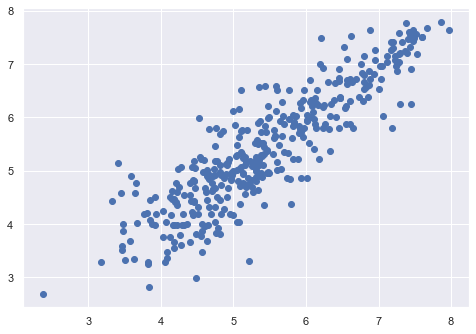

In [220]:
tree_pred=tree_regressor.predict(X_test)

plt.scatter(y_test,tree_pred);

In [221]:
from sklearn.model_selection import RandomizedSearchCV
# Create the random grid
dt_parameters={"splitter":["best","random"],
            "max_depth" : [1,3,5,7,9,11,12],
           "min_samples_leaf":[1,2,3,4,5,6,7,8,9,10],
           "min_weight_fraction_leaf":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9],
           "max_features":["auto","log2","sqrt",None],
           "max_leaf_nodes":[None,10,20,30,40,50,60,70,80,90] }

In [222]:
# First create the base model to tune
dt_tuning = DecisionTreeRegressor(random_state=42)
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
dt_random = RandomizedSearchCV(estimator =dt_tuning, param_distributions = dt_parameters, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
dt_random.fit(X_train,y_train)
dt_random.best_params_

Fitting 3 folds for each of 100 candidates, totalling 300 fits


{'splitter': 'random',
 'min_weight_fraction_leaf': 0.1,
 'min_samples_leaf': 5,
 'max_leaf_nodes': 90,
 'max_features': None,
 'max_depth': 7}

In [225]:
dt_tuning_applied = DecisionTreeRegressor(max_depth=7,max_features=None ,max_leaf_nodes=90,min_samples_leaf=5,min_weight_fraction_leaf=0.1,splitter='random')
dt_tuning_applied.fit(X_train,y_train)

tree_tuned_score_train = dt_tuning_applied.score(X_train,y_train)
print("Training score: ", tree_tuned_score_train)
tree_tuned_score_test = dt_tuning_applied.score(X_test, y_test)
print("Testing score: ",tree_tuned_score_test)

Training score:  0.6002629026496329
Testing score:  0.610688509740567


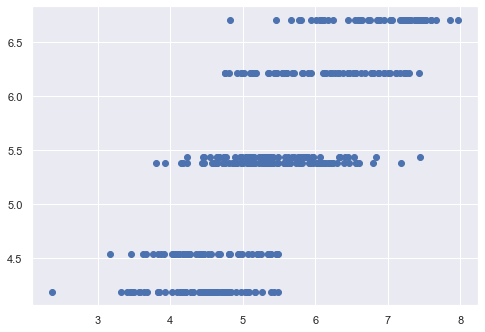

In [226]:
# prediction 
tree_tuned_pred=dt_tuning_applied.predict(X_test)

plt.scatter(y_test,tree_tuned_pred);

In [227]:
y_pred_tree_tuned_test = dt_tuning_applied.predict(X_test)
y_pred_tree_tuned_train = dt_tuning_applied.predict(X_train)
mae = metrics.mean_absolute_error(y_test, y_pred_tree_tuned_test)
rmse_test = metrics.mean_squared_error(y_test, y_pred_tree_tuned_test, squared=False)
rmse_train = metrics.mean_squared_error(y_train, y_pred_tree_tuned_train, squared=False)
print(('MAE:', round(mae,4)),("RMSE test: ", round(rmse_test,4)), ("RMSE train: ", round(rmse_train,4))) 

('MAE:', 0.5543) ('RMSE test: ', 0.6702) ('RMSE train: ', 0.7116)


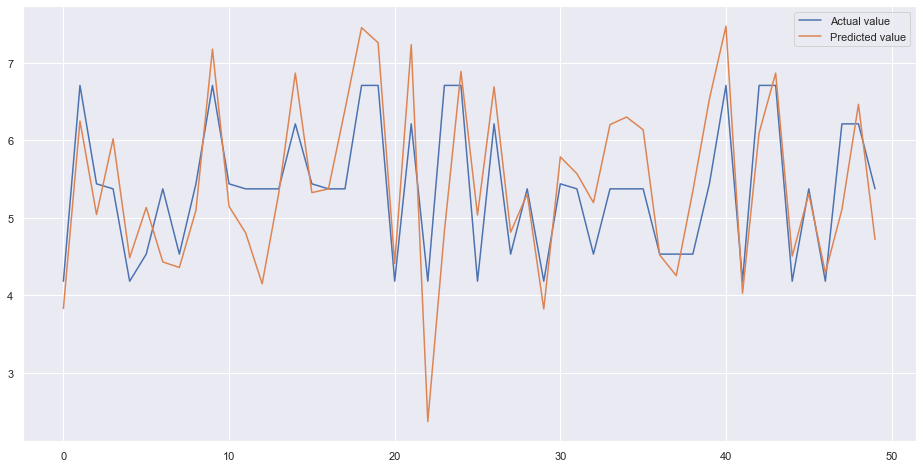

In [228]:
test = pd.DataFrame({'Predicted value':y_pred_tree_tuned_test, 'Actual value':y_test})
fig= plt.figure(figsize=(16,8))
test = test.reset_index()
test = test.drop(['index'],axis=1)
plt.plot(test[:50])
plt.legend(['Actual value','Predicted value']);

# 4.7. Support Vector regression

In [143]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.svm import SVR
sv_regressor = SVR()
sv_regressor.fit(X_train,y_train)
sv_regressor_score_train =sv_regressor.score(X_train,y_train)
print("Training score: ", sv_regressor_score_train)
sv_regressor_score_test = sv_regressor.score(X_test, y_test)
print("Testing score: ",sv_regressor_score_test)

y_pred_svr_test = sv_regressor.predict(X_test)
y_pred_svr_train = sv_regressor.predict(X_train)
mae = metrics.mean_absolute_error(y_test, y_pred_svr_test)
rmse_test = metrics.mean_squared_error(y_test, y_pred_svr_test, squared=False)
rmse_train = metrics.mean_squared_error(y_train, y_pred_svr_train, squared=False)
print(('MAE:', round(mae,4)),("RMSE test: ", round(rmse_test,4)), ("RMSE train: ", round(rmse_train,4))) 

Training score:  0.6797377853407381
Testing score:  0.7154598800708407
('MAE:', 0.4641) ('RMSE test: ', 0.573) ('RMSE train: ', 0.6369)


In [144]:
sv_parameters = {'kernel': ['linear', 'rbf', 'poly'], 'C':[1, 10, 100], 'epsilon':[0.0003,0.1,0.5,0.3,0.5,1, 4]}

In [145]:
svr_tuning = SVR()
svr_random = RandomizedSearchCV(estimator = svr_tuning, param_distributions = sv_parameters, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
svr_random.fit(X_train,y_train)
svr_random.best_params_

Fitting 3 folds for each of 63 candidates, totalling 189 fits


{'kernel': 'linear', 'epsilon': 0.1, 'C': 10}

In [146]:
svr_tuning_applied = SVR(kernel= 'linear', C=10,epsilon =0.1)
svr_tuning_applied.fit(X_train,y_train)

svr_tuned_score_train = svr_tuning_applied.score(X_train,y_train)
print("Training score: ", svr_tuned_score_train)
svr_tuned_score_test = svr_tuning_applied.score(X_test, y_test)
print("Testing score: ",svr_tuned_score_test)

Training score:  0.7819887926106835
Testing score:  0.7720738509273402


Text(0, 0.5, 'Actual values of happiness score')

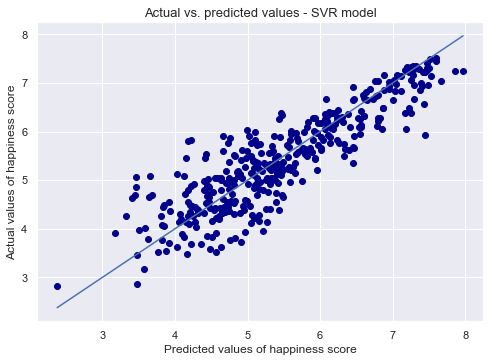

[CV] END .................C=1, epsilon=0.0003, kernel=linear; total time=   3.6s
[CV] END ....................C=1, epsilon=0.5, kernel=linear; total time=   2.0s
[CV] END .......................C=1, epsilon=0.5, kernel=rbf; total time=   0.1s
[CV] END .......................C=1, epsilon=0.5, kernel=rbf; total time=   0.1s
[CV] END ......................C=1, epsilon=0.5, kernel=poly; total time=   0.1s
[CV] END ......................C=1, epsilon=0.5, kernel=poly; total time=   0.1s
[CV] END ......................C=1, epsilon=1, kernel=linear; total time=   0.4s
[CV] END .........................C=1, epsilon=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=1, epsilon=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=1, epsilon=1, kernel=rbf; total time=   0.0s
[CV] END ........................C=1, epsilon=1, kernel=poly; total time=   0.0s
[CV] END ........................C=1, epsilon=1, kernel=poly; total time=   0.0s
[CV] END ...................

[CV] END .................C=1, epsilon=0.0003, kernel=linear; total time=   5.8s
[CV] END .......................C=1, epsilon=0.5, kernel=rbf; total time=   0.1s
[CV] END ......................C=1, epsilon=0.5, kernel=poly; total time=   0.1s
[CV] END ......................C=1, epsilon=1, kernel=linear; total time=   0.2s
[CV] END ......................C=1, epsilon=1, kernel=linear; total time=   0.4s
[CV] END .........................C=1, epsilon=4, kernel=rbf; total time=   0.0s
[CV] END ........................C=1, epsilon=4, kernel=poly; total time=   0.0s
[CV] END ................C=10, epsilon=0.0003, kernel=linear; total time=  31.2s
[CV] END ......................C=10, epsilon=0.5, kernel=rbf; total time=   0.2s
[CV] END ......................C=10, epsilon=0.5, kernel=rbf; total time=   0.2s
[CV] END ......................C=10, epsilon=0.5, kernel=rbf; total time=   0.2s
[CV] END .....................C=10, epsilon=0.5, kernel=poly; total time=   0.2s
[CV] END ...................

In [147]:
# prediction 
y_pred_svr_tuned_train=svr_tuning_applied.predict(X_test)

plt.plot((y_test.min(), y_test.max()), (y_test.min(), y_test.max()));
plt.scatter(y_test, y_pred_svr_tuned_train, color='darkblue');
plt.title('Actual vs. predicted values - SVR model', fontsize = 13);

plt.xlabel("Predicted values of happiness score")
plt.ylabel ("Actual values of happiness score")

In [148]:
y_pred_svr_tuned_test = svr_tuning_applied.predict(X_test)
y_pred_svr_tuned_train = svr_tuning_applied.predict(X_train)
mae = metrics.mean_absolute_error(y_test, y_pred_svr_tuned_test)
rmse_test = metrics.mean_squared_error(y_test, y_pred_svr_tuned_test, squared=False)
rmse_train = metrics.mean_squared_error(y_train, y_pred_svr_tuned_train, squared=False)
print(('MAE:', round(mae,4)),("RMSE test: ", round(rmse_test,4)), ("RMSE train: ", round(rmse_train,4))) 

('MAE:', 0.3925) ('RMSE test: ', 0.5128) ('RMSE train: ', 0.5255)


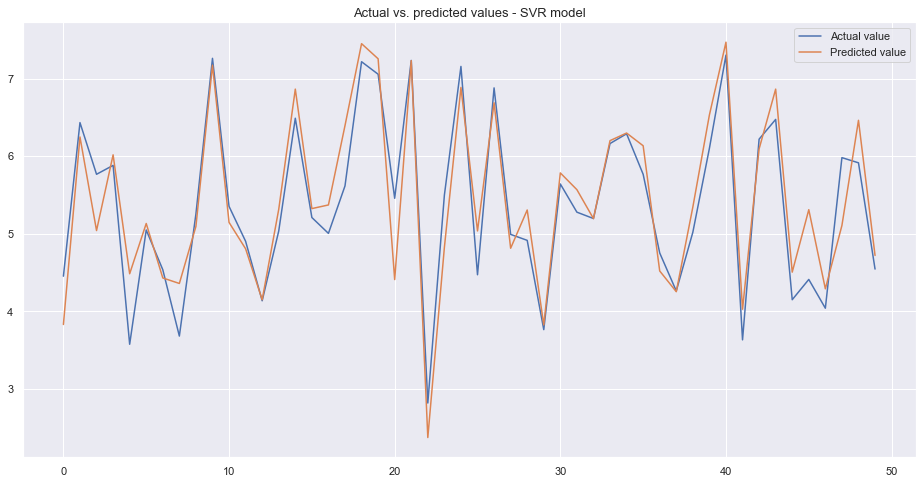

In [149]:
test_svr = pd.DataFrame({'Predicted value':y_pred_svr_tuned_test, 'Actual value':y_test})
fig= plt.figure(figsize=(16,8))
test_svr = test_svr.reset_index()
test_svr = test_svr.drop(['index'],axis=1)
plt.plot(test_svr[:50])
plt.legend(['Actual value','Predicted value']);
plt.title('Actual vs. predicted values - SVR model', fontsize = 13);

In [150]:
svr_tuning_applied_linear = SVR(kernel= 'linear')
svr_tuning_applied_linear.fit(X_train,y_train)

svr_tuned_score_train2 = svr_tuning_applied_linear.score(X_train,y_train)
print("Training score2: ", svr_tuned_score_train2)
svr_tuned_score_test2 = svr_tuning_applied_linear.score(X_test, y_test)
print("Testing score2: ",svr_tuned_score_test2)

Training score2:  0.7819310090859077
Testing score2:  0.7722632936551659


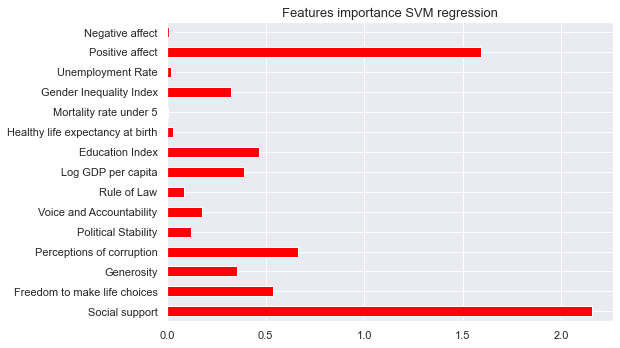

In [151]:
features_names = ['Social support', 'Freedom to make life choices', 'Generosity', 'Perceptions of corruption', 'Political Stability', 'Voice and Accountability', 'Rule of Law', 'Log GDP per capita', 'Education Index', 'Healthy life expectancy at birth', 'Mortality rate under 5', 'Gender Inequality Index', 'Unemployment Rate', 'Positive affect', 'Negative affect']
pd.Series(abs(svr_tuning_applied.coef_[0]), index=features_names).plot(kind='barh', color = 'red'); 
plt.title('Features importance SVM regression', fontsize = 13);

# 4.8. XGBoost

In [239]:
import xgboost as xgb

In [240]:
xgb_regressor = xgb.XGBRegressor()
xgb_regressor.fit(X_train,y_train)

xgb_regressor_score_train = xgb_regressor.score(X_train,y_train)
print("Training score: ", xgb_regressor_score_train)
xgb_regressor_score_test = xgb_regressor.score(X_test, y_test)
print("Testing score: ", xgb_regressor_score_test)

y_pred_xgb_test = xgb_regressor.predict(X_test)
y_pred_xgb_train = xgb_regressor.predict(X_train)
mae = metrics.mean_absolute_error(y_test, y_pred_xgb_test)
rmse_test = metrics.mean_squared_error(y_test, y_pred_xgb_test, squared=False)
rmse_train = metrics.mean_squared_error(y_train, y_pred_xgb_train, squared=False)
print(('MAE:', round(mae,4)),("RMSE test: ", round(rmse_test,4)), ("RMSE train: ", round(rmse_train,4))) 

Training score:  0.9987513551443337
Testing score:  0.8612556653054404
('MAE:', 0.3065) ('RMSE test: ', 0.4001) ('RMSE train: ', 0.0398)


In [241]:
'''Perhaps the most commonly configured hyperparameters are the following:
n_estimators: The number of trees in the ensemble, often increased until no further improvements are seen.
max_depth: The maximum depth of each tree, often values are between 1 and 10.
eta: The learning rate used to weight each model, often set to small values such as 0.3, 0.1, 0.01, or smaller.
subsample: The number of samples (rows) used in each tree, set to a value between 0 and 1, often 1.0 to use all samples.
colsample_bytree: Number of features (columns) used in each tree, set to a value between 0 and 1, often 1.0 to use all features.
For example'''

xgb_parameters={"n_estimators" : [500, 600, 700, 1000],
                "max_depth" : [1, 3, 5, 7, 10], 
                'eta' : [0.001, 0.01, 0.1, 0.3], 
                'subsample' :[0.3, 0.7, 1], 
                'colsample_bytree' : [0.2, 0.4, 0.8, 1],
               'learning_rate' : [0.1, 0.5, 1]}

In [242]:
import warnings
warnings.filterwarnings('ignore')
pd.Index([1,2,3])

# create an xgboost regression model
xgb_tuning = xgb.XGBRegressor()
xgb_random = RandomizedSearchCV(estimator = xgb_tuning, param_distributions = xgb_parameters, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
xgb_random.fit(X_train,y_train)
xgb_random.best_params_

Fitting 3 folds for each of 100 candidates, totalling 300 fits


{'subsample': 0.7,
 'n_estimators': 500,
 'max_depth': 7,
 'learning_rate': 0.1,
 'eta': 0.01,
 'colsample_bytree': 1}

In [243]:
xgb_tuning_applied = xgb.XGBRegressor(n_estimators=500, max_depth=7, eta=0.01, subsample=0.7, colsample_bytree=1, learning_rate = 0.1)
xgb_tuning_applied.fit(X_train,y_train)

xgb_tuned_score_train =xgb_tuning_applied.score(X_train,y_train)
print("Training score: ", xgb_tuned_score_train)
xgb_tuned_score_test = xgb_tuning_applied.score(X_test, y_test)
print("Testing score: ", xgb_tuned_score_test)

Training score:  0.9999961264738012
Testing score:  0.884803846298456


In [245]:
y_pred_xgb_tuned_test = xgb_tuning_applied.predict(X_test)
y_pred_xgb_tuned_train = xgb_tuning_applied.predict(X_train)
mae = metrics.mean_absolute_error(y_test, y_pred_xgb_tuned_test)
rmse_test = metrics.mean_squared_error(y_test, y_pred_xgb_tuned_test, squared=False)
rmse_train = metrics.mean_squared_error(y_train, y_pred_xgb_tuned_train, squared=False)
print(('MAE:', round(mae,4)),("RMSE test: ", round(rmse_test,4)), ("RMSE train: ", round(rmse_train,4))) 

('MAE:', 0.2721) ('RMSE test: ', 0.3646) ('RMSE train: ', 0.0022)


# 5. Interprétabilité

In [152]:
import shap 
# Fits the explainer
explainer_2 = shap.Explainer(svr_tuning_applied.predict, X_test)
# Calculates the SHAP values - It takes some time
shap_values_2 = explainer_2(X_test)

Permutation explainer: 391it [14:01,  2.18s/it]                                 


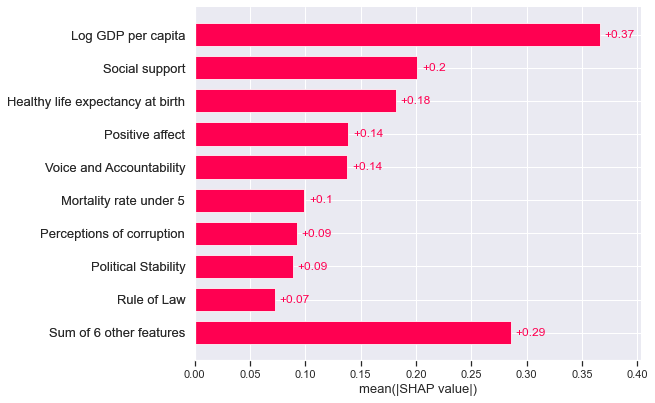

In [153]:
shap.plots.bar(shap_values_2)

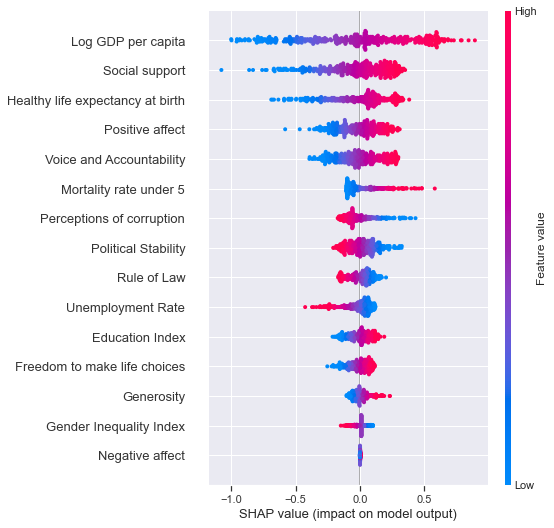

In [154]:
shap.summary_plot(shap_values_2, X_test)

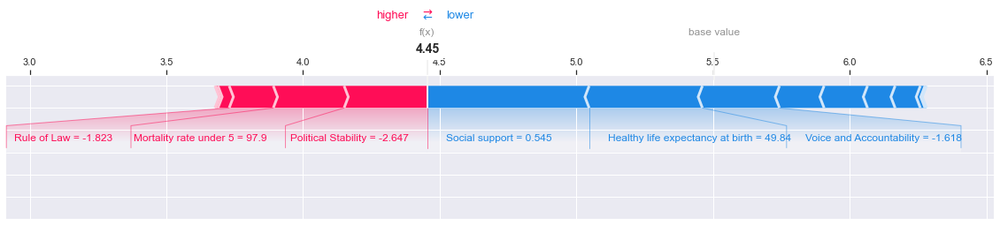

In [155]:
shap.initjs()
shap.force_plot(shap_values_2[0, :], X_test.iloc[280, :], matplotlib=True)

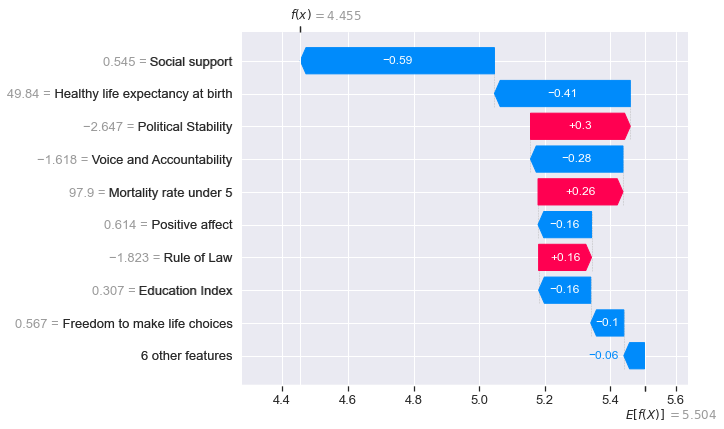

In [156]:
shap.plots.waterfall(shap_values_2[0])

In [157]:
shap.initjs()
shap.force_plot(shap_values_2[:1000], X_test[:1000])

In [158]:
df_ML=pd.DataFrame({'Train Score'  : [0.7835, 0.7835, 0.7831, 1.0, 0.5759, 0.7819, 0.9999],
                    'Test Score' : [0.7717, 0.7718, 0.7753, 0.8974, 0.5737, 0.7722, 0.8848],
                    'RMSE Train' : [0.5237, 0.5237, 0.5242, 1.0, 0.7329, 0.5255, 0.0022],
                    'RMSE Test': [0.5133, 0.5131, 0.5092, 0.3439, 0.7013, 0.5128, 0.3646]},
                   index = ['Linear regression', 'Ridge Regression', 'Lasso Regression', 
                            'Random Forest Regression', 'Decision Tree Regression', 'SVM Regression', 
                            'XGBoost Regression'])
df_ML

,Train Score,Test Score,RMSE Train,RMSE Test
Linear regression,0.7835,0.7717,0.5237,0.5133
Ridge Regression,0.7835,0.7718,0.5237,0.5131
Lasso Regression,0.7831,0.7753,0.5242,0.5092
Random Forest Regression,1.0000,0.8974,1.0000,0.3439
Decision Tree Regression,0.5759,0.5737,0.7329,0.7013
SVM Regression,0.7819,0.7722,0.5255,0.5128
XGBoost Regression,0.9999,0.8848,0.0022,0.3646


# 6. Déploiement du modèle SVR _ Application à l'Afghanistan

In [260]:
df_afghanistan = df2.iloc[0:12, :]
df_afghanistan

,Life Ladder,Social support,Freedom to make life choices,Generosity,Perceptions of corruption,Political Stability,Voice and Accountability,Rule of Law,Log GDP per capita,Education Index,Healthy life expectancy at birth,Mortality rate under 5,Gender Inequality Index,Unemployment Rate,Positive affect,Negative affect
Afghanistan - South Asia,3.724,0.451,0.718,0.168,0.882,-2.690,-1.169,-1.864,7.370,0.344,50.80,95.7,NaN,11.093,0.518,0.258
Afghanistan - South Asia,4.402,0.552,0.679,0.190,0.850,-2.713,-1.375,-1.847,7.540,0.351,51.20,91.7,NaN,11.311,0.584,0.237
Afghanistan - South Asia,4.758,0.539,0.600,0.121,0.707,-2.579,-1.404,-1.845,7.647,0.371,51.60,87.8,0.751,11.352,0.618,0.275
Afghanistan - South Asia,3.832,0.521,0.496,0.162,0.731,-2.502,-1.336,-1.897,7.620,0.374,51.92,84.0,0.743,11.054,0.611,0.267
Afghanistan - South Asia,3.783,0.521,0.531,0.236,0.776,-2.419,-1.267,-1.643,7.705,0.391,52.24,80.3,0.734,11.341,0.710,0.268
Afghanistan - South Asia,3.572,0.484,0.578,0.061,0.823,-2.519,-1.240,-1.597,7.725,0.400,52.56,76.9,0.724,11.193,0.621,0.273
Afghanistan - South Asia,3.131,0.526,0.509,0.104,0.871,-2.411,-1.135,-1.446,7.718,0.403,52.88,73.6,0.714,11.142,0.532,0.375
Afghanistan - South Asia,3.983,0.529,0.389,0.080,0.881,-2.571,-1.118,-1.504,7.702,0.403,53.20,70.4,0.702,11.127,0.554,0.339
Afghanistan - South Asia,4.220,0.559,0.523,0.042,0.793,-2.671,-1.038,-1.498,7.697,0.406,53.00,67.5,0.690,11.158,0.565,0.348
Afghanistan - South Asia,2.662,0.491,0.427,-0.121,0.954,-2.801,-0.991,-1.562,7.697,0.407,52.80,64.8,0.673,11.180,0.496,0.371


In [261]:
df_afghanistan_ladder_serie = df_afghanistan['Life Ladder'].tolist()
df_afghanistan_ladder_serie

[3.724,
 4.402,
 4.758,
 3.832,
 3.783,
 3.572,
 3.131,
 3.983,
 4.22,
 2.662,
 2.694,
 2.375]

In [262]:
df_afghanistan= df_afghanistan.drop(['Life Ladder'], axis=1)
df_afghanistan.head()

,Social support,Freedom to make life choices,Generosity,Perceptions of corruption,Political Stability,Voice and Accountability,Rule of Law,Log GDP per capita,Education Index,Healthy life expectancy at birth,Mortality rate under 5,Gender Inequality Index,Unemployment Rate,Positive affect,Negative affect
Afghanistan - South Asia,0.451,0.718,0.168,0.882,-2.690,-1.169,-1.864,7.370,0.344,50.80,95.7,NaN,11.093,0.518,0.258
Afghanistan - South Asia,0.552,0.679,0.190,0.850,-2.713,-1.375,-1.847,7.540,0.351,51.20,91.7,NaN,11.311,0.584,0.237
Afghanistan - South Asia,0.539,0.600,0.121,0.707,-2.579,-1.404,-1.845,7.647,0.371,51.60,87.8,0.751,11.352,0.618,0.275
Afghanistan - South Asia,0.521,0.496,0.162,0.731,-2.502,-1.336,-1.897,7.620,0.374,51.92,84.0,0.743,11.054,0.611,0.267
Afghanistan - South Asia,0.521,0.531,0.236,0.776,-2.419,-1.267,-1.643,7.705,0.391,52.24,80.3,0.734,11.341,0.710,0.268


In [263]:
df_afghanistan_social = df_afghanistan.copy()
df_afghanistan_gdp = df_afghanistan.copy()

df_afghanistan_social = df_afghanistan_social.fillna(df_afghanistan_social.median())
df_afghanistan_gdp = df_afghanistan_gdp.fillna(df_afghanistan_gdp.median())

In [264]:
df_afghanistan_social_serie = df_afghanistan_social['Social support'].tolist()
df_afghanistan_social_serie

[0.451,
 0.552,
 0.539,
 0.521,
 0.521,
 0.484,
 0.526,
 0.529,
 0.559,
 0.491,
 0.508,
 0.42]

In [265]:
df_afghanistan_social['Social support'] = df_afghanistan_social['Social support'].replace([0.451, 0.552,0.539, 0.521, 0.521,0.484,0.526,0.529,0.559,0.491,0.508,0.42],[0.650, 0.770, 0.725, 0.750, 0.775, 0.800, 0.825, 0.850, 0.875, 0.904, 0.925, 0.950])
df_afghanistan_social.head()

,Social support,Freedom to make life choices,Generosity,Perceptions of corruption,Political Stability,Voice and Accountability,Rule of Law,Log GDP per capita,Education Index,Healthy life expectancy at birth,Mortality rate under 5,Gender Inequality Index,Unemployment Rate,Positive affect,Negative affect
Afghanistan - South Asia,0.650,0.718,0.168,0.882,-2.690,-1.169,-1.864,7.370,0.344,50.80,95.7,0.708,11.093,0.518,0.258
Afghanistan - South Asia,0.770,0.679,0.190,0.850,-2.713,-1.375,-1.847,7.540,0.351,51.20,91.7,0.708,11.311,0.584,0.237
Afghanistan - South Asia,0.725,0.600,0.121,0.707,-2.579,-1.404,-1.845,7.647,0.371,51.60,87.8,0.751,11.352,0.618,0.275
Afghanistan - South Asia,0.775,0.496,0.162,0.731,-2.502,-1.336,-1.897,7.620,0.374,51.92,84.0,0.743,11.054,0.611,0.267
Afghanistan - South Asia,0.775,0.531,0.236,0.776,-2.419,-1.267,-1.643,7.705,0.391,52.24,80.3,0.734,11.341,0.710,0.268


In [266]:
df_afghanistan_gdp_serie = df_afghanistan_gdp['Log GDP per capita'].tolist()
df_afghanistan_gdp_serie

[7.37,
 7.54,
 7.647,
 7.62,
 7.705,
 7.725,
 7.718,
 7.702,
 7.697,
 7.697,
 7.692,
 7.697]

In [267]:
df_afghanistan_gdp['Log GDP per capita'] = df_afghanistan_social['Log GDP per capita'].replace([7.37,7.54,7.647,7.62,7.705,7.725,7.718,7.702,7.697,7.697,7.692,7.697],[8.000, 8.250, 8.500, 8.875,9.000, 9.250, 9.500, 9.875, 10.000, 10.225, 10.500, 10.750])
df_afghanistan_gdp.head()

,Social support,Freedom to make life choices,Generosity,Perceptions of corruption,Political Stability,Voice and Accountability,Rule of Law,Log GDP per capita,Education Index,Healthy life expectancy at birth,Mortality rate under 5,Gender Inequality Index,Unemployment Rate,Positive affect,Negative affect
Afghanistan - South Asia,0.451,0.718,0.168,0.882,-2.690,-1.169,-1.864,8.000,0.344,50.80,95.7,0.708,11.093,0.518,0.258
Afghanistan - South Asia,0.552,0.679,0.190,0.850,-2.713,-1.375,-1.847,8.250,0.351,51.20,91.7,0.708,11.311,0.584,0.237
Afghanistan - South Asia,0.539,0.600,0.121,0.707,-2.579,-1.404,-1.845,8.500,0.371,51.60,87.8,0.751,11.352,0.618,0.275
Afghanistan - South Asia,0.521,0.496,0.162,0.731,-2.502,-1.336,-1.897,8.875,0.374,51.92,84.0,0.743,11.054,0.611,0.267
Afghanistan - South Asia,0.521,0.531,0.236,0.776,-2.419,-1.267,-1.643,9.000,0.391,52.24,80.3,0.734,11.341,0.710,0.268


In [268]:
# Importer les fonctions dump et load de joblib et Enregistrer le dernier modèle c
    
from joblib import dump, load
dump(svr_tuning_applied, 'svr.joblib')

['svr.joblib']

In [269]:
# Charger le modèle sous le nom 'loaded_model' et afficher les prédictions du modèle sur X_test.
loaded_model = load('svr.joblib')

In [270]:
test_gdp = loaded_model.predict(df_afghanistan_gdp)
test_gdp

array([3.59613279, 3.98623088, 4.10937815, 4.16101917, 4.36479965,
       4.19346786, 4.18318584, 4.320827  , 4.87591368, 4.42243558,
       4.23224149, 4.01677231])

In [271]:
test_social = loaded_model.predict(df_afghanistan_social)
test_social

array([3.77818553, 4.1778826 , 4.17596179, 4.21659695, 4.40469332,
       4.27686032, 4.12915304, 4.16091773, 4.36017316, 4.11584338,
       4.03033913, 3.96245178])

In [272]:
test_gdp = pd.DataFrame({'Predicted value':test_gdp, 'Actual value':df_afghanistan_ladder_serie})
test_gdp

,Predicted value,Actual value
0,3.596133,3.724
1,3.986231,4.402
2,4.109378,4.758
3,4.161019,3.832
4,4.364800,3.783
5,4.193468,3.572
6,4.183186,3.131
7,4.320827,3.983
8,4.875914,4.220
9,4.422436,2.662


In [273]:
test_social = pd.DataFrame({'Predicted value':test_social, 'Actual value':df_afghanistan_ladder_serie})
test_social

,Predicted value,Actual value
0,3.778186,3.724
1,4.177883,4.402
2,4.175962,4.758
3,4.216597,3.832
4,4.404693,3.783
5,4.276860,3.572
6,4.129153,3.131
7,4.160918,3.983
8,4.360173,4.220
9,4.115843,2.662


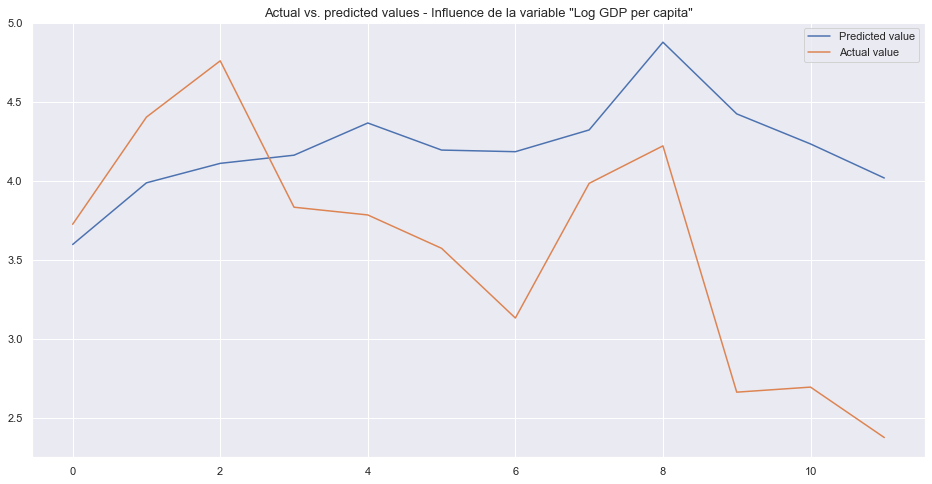

In [279]:
fig= plt.figure(figsize=(16,8))

plt.plot(test_gdp)
plt.legend(['Predicted value', 'Actual value']);
plt.title('Actual vs. predicted values - Influence de la variable "Log GDP per capita"', fontsize = 13);

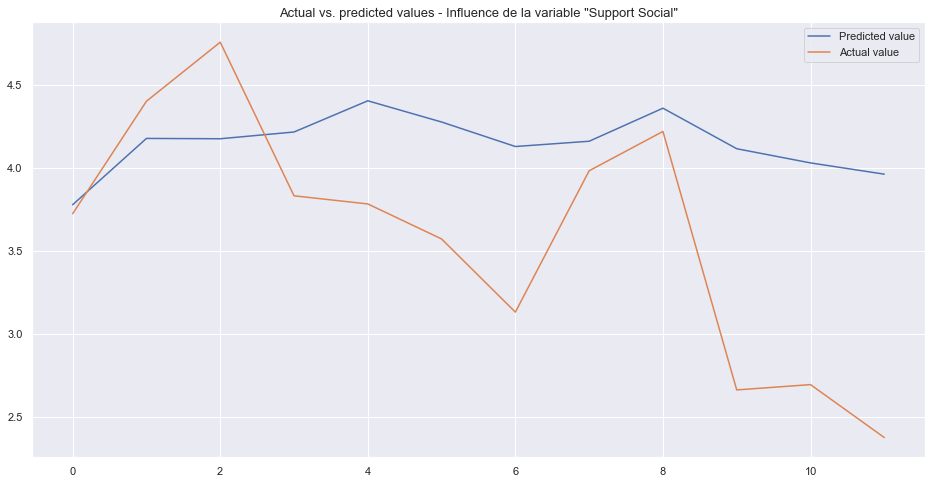

In [278]:
fig= plt.figure(figsize=(16,8))

plt.plot(test_social)
plt.legend(['Predicted value', 'Actual value']);
plt.title('Actual vs. predicted values - Influence de la variable "Support Social"', fontsize = 13);

# 7. Focus sur les pays d'Asie du Sud

# Pour cette partie, se référer au notebook n°2